<a href="https://colab.research.google.com/github/BiodataAnalysisGroup/PertFlow_A-cloud-based-workflow-for-scRNA-seq-perturbational-modeling/blob/main/PertFlow_prototype_CLL_pilot_pre_post_Ibrutinib.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The following Colab workflow represents **PertFlow** implementation on Chronic Lympocytic Leukemia (CLL) data before (Pre-Ibr, Day 0) and after the treatment with the Bruton tyrosine kinase inhibitor Ibrutinib (Post-Ibr, Day 30, Day 120, Day 150 and Day 280) (Rendeiro et al. 2020).

PertFlow will try to go beyond ground truths established by the authors since it will try to infer *novel perturbationally-driven insights with potential pharmacological merit.*

PertFlow could provide answers for the following indicative questions:
- Which transcription factors are involved Pre/Post-Ibr?
- Which cell types are experiencing the biggest perturbation during Ibrutinib treatment?
- What could be the impact of targeting certain molecules of interest (e.g., transcription factors) based on molecular knockdowns from ECCITE-seq datasets?
- What kind of drugs could be repurposed to mimic the effects of Ibrutinib?

# **0.1 Set up GDrive working directory**

The first code chunks enables the user to designate a specific file in its Google Drive as working directory (e.g., here is My Drive/Colab Notebooks/Project_folder/CellMate_pilots).

In [ ]:
import os

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
#set working directory

root_dir = "/content/drive/My Drive/"

In [ ]:
#choose the project folder
project_folder = "Colab Notebooks/Project_folder/CellMate_pilots/"
#project_folder = "Project_folder/"

In [ ]:
#define function to create and set working directory
def create_and_set_working_directory(project_folder):
  if os.path.isdir(root_dir + project_folder) == False:
    os.mkdir(root_dir + project_folder)
    print(root_dir + project_folder + 'did not exists and was created')

#change the OS path to project folder as working directory
os.chdir(root_dir + project_folder)

In [ ]:
!pwd

/content/drive/My Drive/Colab Notebooks/Project_folder/CellMate_pilots


# **0.2 Set up Rpy2 package for in tandem Python-R coding**

To enable interoperability between the Scanpy (Python) and Seurat (R) pipelines below, we activate the Rpy2 package

In [ ]:
!pip install rpy2==3.5.1 #https://stackoverflow.com/questions/74283327/conversion-py2rpy-not-defined-for-objects-of-type-class-str

In [ ]:
%load_ext rpy2.ipython

# **1. Scanpy basic preprocessing**

Scanpy is a scalable toolkit for analyzing single-cell gene expression data built jointly with anndata. It includes preprocessing, visualization, clustering, trajectory inference and differential expression testing. The Python-based implementation efficiently deals with datasets of more than one million cells. https://scanpy.readthedocs.io/en/stable/

anndata.svg

In [ ]:
# https://scanpy-tutorials.readthedocs.io/en/latest/pbmc3k.html for an in-depth tutorial using PBMCs

In [ ]:
pip install scanpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.2/104.2 kB 10.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.2/88.2 kB 8.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.6/75.6 kB 8.3 MB/s eta 0:00:00
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82807 sha256=478479b9c7f15e049e150dfa5f5a605488af76c46210b5c0f130d8b13805b6ac
  Stored in directory: /root/.cache/pip/wheels/a0/e8/c6/a37ea663620bd5200ea1ba0907ab3c217042c1d035ef606acc
  Created wheel for session-info: filename=session_info-1.0.0-py3-none-any.whl size=8026 sha256=edb44370a741676463400c35212447187aabe04088d41bc8512610debb123851
  Stored in directory: /root/.cache/pip/wheels/6a/aa

In [ ]:
import numpy as np
import pandas as pd
import scanpy as sc

In [ ]:
# sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
# sc.logging.print_header()
# sc.settings.set_figure_params(dpi=80, facecolor='white')

In [ ]:
# CLL data from Rendeiro et al. 2020 were downloaded, integrated and pre-processed using .... (xxxx.xx script)
CLLdata = sc.read('CLLdata.h5ad')

In [ ]:
CLLdata

AnnData object with n_obs × n_vars = 30374 × 16333
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'days', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'labels', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2'
    uns: 'days_colors', 'labels_colors', 'subject_colors'
    obsm: 'X_pca', 'X_umap'

In [ ]:
CLLdata.obs

,orig.ident,nCount_RNA,nFeature_RNA,dataset,barcode,subject,days,mitoPercent,nCount_SCT,nFeature_SCT,SCT_snn_res.0.7,seurat_clusters,integrated_snn_res.0.3,labels,integrated_snn_res.0.5,UMAP_1,UMAP_2
barcode,,,,,,,,,,,,,,,,,
CLL_AAACCTGAGACCTTTG-scRNA-seq_CLL6_d0,SeuratProject,2868,1063,CLL,CLL_AAACCTGAGACCTTTG-scRNA-seq_CLL6_d0,CLL6,d0,4.532775,2253,1034,4,0,0,B cells,0,-3.195922,-4.913904
CLL_AAACCTGAGCCGTCGT-scRNA-seq_CLL6_d0,SeuratProject,2236,922,CLL,CLL_AAACCTGAGCCGTCGT-scRNA-seq_CLL6_d0,CLL6,d0,4.606440,2069,905,4,0,0,B cells,0,-3.702928,-5.436599
CLL_AAACCTGCAAACAACA-scRNA-seq_CLL6_d0,SeuratProject,3123,1253,CLL,CLL_AAACCTGCAAACAACA-scRNA-seq_CLL6_d0,CLL6,d0,2.017291,2321,1215,4,0,0,B cells,0,-2.987708,-5.460833
CLL_AAACCTGCACTCGACG-scRNA-seq_CLL6_d0,SeuratProject,2254,986,CLL,CLL_AAACCTGCACTCGACG-scRNA-seq_CLL6_d0,CLL6,d0,3.948536,2083,962,6,8,6,CD8+ T cells,8,-0.381276,7.189632
CLL_AAACGGGAGACAGAGA-scRNA-seq_CLL6_d0,SeuratProject,2873,1028,CLL,CLL_AAACGGGAGACAGAGA-scRNA-seq_CLL6_d0,CLL6,d0,4.211625,2252,985,5,6,4,Monocytes,6,-9.610204,2.465317
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CLL_TTTGGTTGTTACCGAT-scRNA-seq_CLL5_d150,SeuratProject,1322,603,CLL,CLL_TTTGGTTGTTACCGAT-scRNA-seq_CLL5_d150,CLL5,d150,1.815431,1588,597,2,4,2,CD8+ T cells,4,-0.352752,10.903490
CLL_TTTGGTTTCTCGTTTA-scRNA-seq_CLL5_d150,SeuratProject,938,507,CLL,CLL_TTTGGTTTCTCGTTTA-scRNA-seq_CLL5_d150,CLL5,d150,1.385928,1507,519,2,4,2,CD8+ T cells,4,0.395087,9.845680
CLL_TTTGGTTTCTTTACGT-scRNA-seq_CLL5_d150,SeuratProject,1036,591,CLL,CLL_TTTGGTTTCTTTACGT-scRNA-seq_CLL5_d150,CLL5,d150,1.254826,1448,590,8,8,6,NK cells,8,-1.078152,7.739480


In [ ]:
CLLdata.obs.days

barcode
CLL_AAACCTGAGACCTTTG-scRNA-seq_CLL6_d0        d0
CLL_AAACCTGAGCCGTCGT-scRNA-seq_CLL6_d0        d0
CLL_AAACCTGCAAACAACA-scRNA-seq_CLL6_d0        d0
CLL_AAACCTGCACTCGACG-scRNA-seq_CLL6_d0        d0
CLL_AAACGGGAGACAGAGA-scRNA-seq_CLL6_d0        d0
                                            ... 
CLL_TTTGGTTGTTACCGAT-scRNA-seq_CLL5_d150    d150
CLL_TTTGGTTTCTCGTTTA-scRNA-seq_CLL5_d150    d150
CLL_TTTGGTTTCTTTACGT-scRNA-seq_CLL5_d150    d150
CLL_TTTGTCACACGAGAGT-scRNA-seq_CLL5_d150    d150
CLL_TTTGTCACAGCTTCGG-scRNA-seq_CLL5_d150    d150
Name: days, Length: 30374, dtype: category
Categories (5, object): ['d0', 'd30', 'd120', 'd150', 'd280']

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


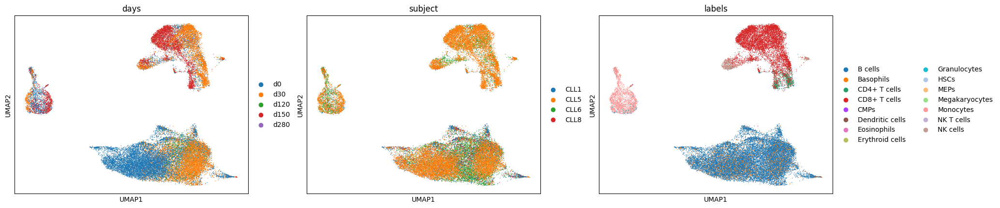

In [ ]:
# Data exploration
sc.pl.umap(CLLdata, color=['days', 'subject', 'labels'])

In [ ]:
# Subsetting to adata for each time point (D0, D30, D120, D150, D270)
CLLdata_D0 = CLLdata[((CLLdata.obs["days"] == "d0"))]
CLLdata_D30 = CLLdata[((CLLdata.obs["days"] == "d30"))]
CLLdata_D120 = CLLdata[((CLLdata.obs["days"] == "d120"))]
CLLdata_D150 = CLLdata[((CLLdata.obs["days"] == "d150"))]
CLLdata_D280 = CLLdata[((CLLdata.obs["days"] == "d280"))]

In [ ]:
CLLdata_D0.raw = CLLdata_D0
CLLdata_D30.raw = CLLdata_D30
CLLdata_D120.raw = CLLdata_D120
CLLdata_D150.raw = CLLdata_D150
CLLdata_D280.raw = CLLdata_D280

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


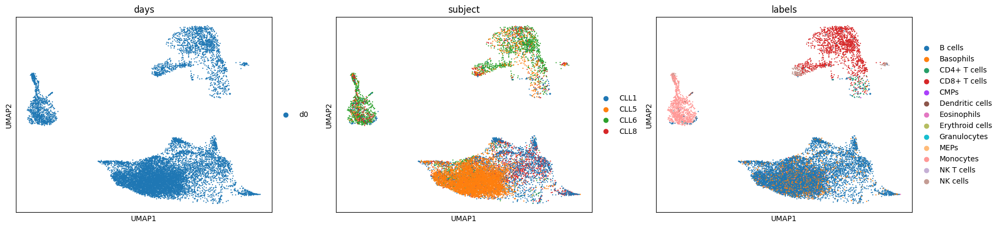

In [ ]:
# Data exploration
sc.pl.umap(CLLdata_D0, color=['days', 'subject', 'labels'])

# **2. Pathway enrichment and transcription factor enrichment through decoupler**

**decoupler** is a package containing different statistical methods to extract biological activities from omics data within a unified framework. It allows to flexibly test any method with any prior knowledge resource and incorporates methods that take into account the sign and weight. It can be used with any omic, as long as its features can be linked to a biological process based on prior knowledge. For example, in transcriptomics gene sets regulated by a transcription factor, or in phospho-proteomics phosphosites that are targeted by a kinase.

PertFlow enables "Pathway activity inference" and "Transcription factor activity inference" but more utilities from Decoupler can be incorporated based on the user's specifications:

https://decoupler-py.readthedocs.io/en/latest/notebooks/progeny.html


https://decoupler-py.readthedocs.io/en/latest/notebooks/dorothea.html


We are using decoupler to perform pathway enrichment and to approximate the activity of transcription factors involved in Pre/Post-Ibrutinib.

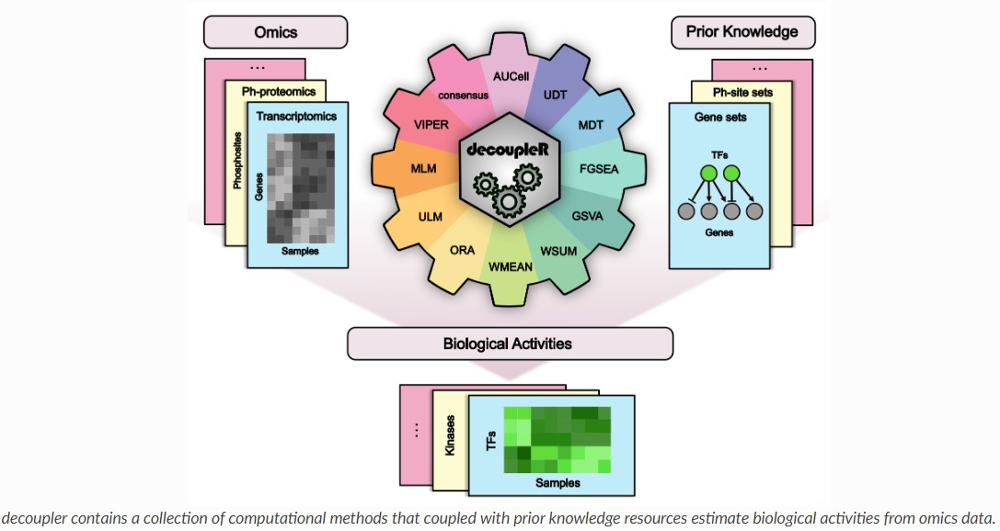

**2.1 Pathway activity inference**

scRNA-seq yield many molecular readouts that are hard to interpret by themselves. One way of summarizing this information is by infering pathway activities from prior knowledge.

In this notebook we showcase how to use decoupler for pathway activity inference with the 3k PBMCs 10X data-set. The data consists of 3k PBMCs from a Healthy Donor and is freely available from 10x Genomics here from this webpage

In [ ]:
pip install decoupler

In [ ]:
import decoupler as dc

# # Plotting options, change to your liking
# sc.settings.set_figure_params(dpi=200, frameon=False)
# sc.set_figure_params(dpi=200)
# sc.set_figure_params(figsize=(4, 4))

In [ ]:
pip install omnipath

***PROGENy model***

PROGENy is a comprehensive resource containing a curated collection of pathways and their target genes, with weights for each interaction. For this example we will use the human weights (other organisms are available) and we will use the top 500 responsive genes ranked by p-value. Here is a brief description of each pathway:

Androgen: involved in the growth and development of the male reproductive organs.

EGFR: regulates growth, survival, migration, apoptosis, proliferation, and differentiation in mammalian cells

Estrogen: promotes the growth and development of the female reproductive organs.

Hypoxia: promotes angiogenesis and metabolic reprogramming when O2 levels are low.

JAK-STAT: involved in immunity, cell division, cell death, and tumor formation.

MAPK: integrates external signals and promotes cell growth and proliferation.

NFkB: regulates immune response, cytokine production and cell survival.

p53: regulates cell cycle, apoptosis, DNA repair and tumor suppression.

PI3K: promotes growth and proliferation.

TGFb: involved in development, homeostasis, and repair of most tissues.

TNFa: mediates haematopoiesis, immune surveillance, tumour regression and protection from infection.

Trail: induces apoptosis.

VEGF: mediates angiogenesis, vascular permeability, and cell migration.

WNT: regulates organ morphogenesis during development and tissue repair.

To access it we can use decoupler.

In [ ]:
progeny = dc.get_progeny(organism='human', top=500)
progeny

,source,target,weight,p_value
0,Androgen,TMPRSS2,11.490631,0.000000e+00
1,Androgen,NKX3-1,10.622551,2.242078e-44
2,Androgen,MBOAT2,10.472733,4.624285e-44
3,Androgen,KLK2,10.176186,1.944414e-40
4,Androgen,SARG,11.386852,2.790209e-40
...,...,...,...,...
6995,p53,ZMYM4,-2.325752,1.522388e-06
6996,p53,CFDP1,-1.628168,1.526045e-06
6997,p53,VPS37D,2.309503,1.537098e-06
6998,p53,TEDC1,-2.274823,1.547037e-06


***Activity inference with multivariate linear model (MLM)***

To infer pathway enrichment scores we will run the multivariate linear model (mlm) method. For each cell in our dataset (adata), it fits a linear model that predicts the observed gene expression based on all pathways’ Pathway-Gene interactions weights. Once fitted, the obtained t-values of the slopes are the scores. If it is positive, we interpret that the pathway is active and if it is negative we interpret that it is inactive.

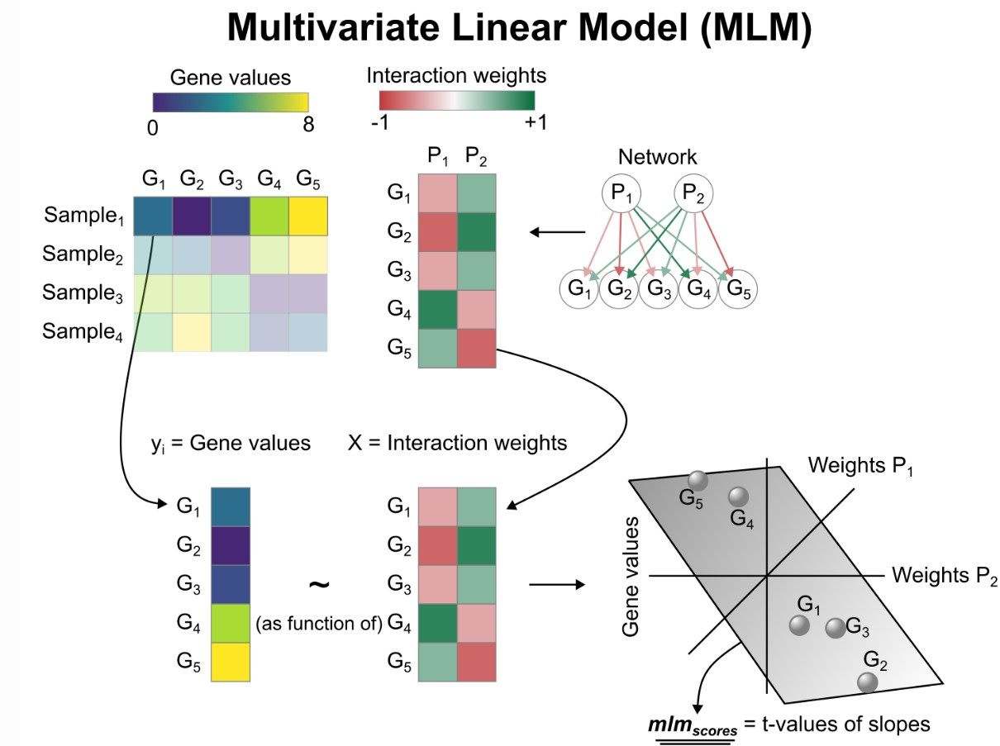

To run decoupler methods, we need an input matrix (mat), an input prior knowledge network/resource (net), and the name of the columns of net that we want to use.

In [ ]:
dc.run_mlm(
    mat=CLLdata_D0,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

4594 features of mat are empty, they will be removed.
Running mlm on mat with 12935 samples and 11739 targets for 14 sources.


100%|██████████| 2/2 [00:22<00:00, 11.21s/it]


The obtained scores (t-values)(mlm_estimate) and p-values (mlm_pvals) are stored in the .obsm key:

In [ ]:
adata = CLLdata_D0

In [ ]:
adata.obsm['mlm_estimate']

,Androgen,EGFR,Estrogen,Hypoxia,JAK-STAT,MAPK,NFkB,PI3K,TGFb,TNFa,Trail,VEGF,WNT,p53
CLL_AAACCTGAGACCTTTG-scRNA-seq_CLL6_d0,-0.996836,1.166057,0.085836,1.190710,2.391647,-2.119837,-1.465738,-0.887254,-0.834949,1.420862,0.197637,-2.146120,0.416352,-5.450927
CLL_AAACCTGAGCCGTCGT-scRNA-seq_CLL6_d0,-0.839987,1.898599,0.568333,1.192197,0.496959,-2.770570,-1.732675,-0.248921,-1.402147,1.750970,-0.028397,-0.804798,0.249313,-6.374464
CLL_AAACCTGCAAACAACA-scRNA-seq_CLL6_d0,-0.612432,0.948127,-1.561782,1.398603,1.063811,-1.535439,-1.207134,-1.140258,-0.170029,0.784141,0.476582,-2.042162,-0.308665,-4.369206
CLL_AAACCTGCACTCGACG-scRNA-seq_CLL6_d0,-0.767769,2.035222,-1.594387,1.219926,1.506199,-1.900550,-1.210685,-1.411345,-0.002565,2.617356,0.342523,-0.563493,1.162340,-5.928216
CLL_AAACGGGAGACAGAGA-scRNA-seq_CLL6_d0,-0.647050,3.948306,-0.593199,1.677267,1.250803,-2.621399,-2.160109,-0.835911,-0.369855,4.464674,0.325684,-1.371550,0.664053,-4.458301
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CLL_TTTGTCAGTTCGGGCT-scRNA-seq_CLL5_d0,-0.333477,3.325162,-0.629023,-0.456090,2.936013,-3.794949,-2.972628,-0.792109,-1.149470,3.783084,0.758145,-0.574443,0.790625,-3.556673
CLL_TTTGTCAGTTGACGTT-scRNA-seq_CLL5_d0,-0.050296,1.119411,-0.637582,0.983973,2.014258,-1.998007,-2.050579,-0.438328,-0.571269,1.782713,0.495582,-1.199748,1.397818,-3.814258
CLL_TTTGTCATCCGAATGT-scRNA-seq_CLL5_d0,-0.740902,1.768677,0.659761,1.686828,0.311277,-2.763942,-2.185440,-0.758883,-1.426997,2.531575,0.224456,-1.304201,1.925362,-4.577764
CLL_TTTGTCATCCTCGCAT-scRNA-seq_CLL5_d0,-0.821165,0.988696,-0.516158,1.629667,6.542709,-2.136224,-2.120471,0.174347,-0.726338,2.017725,-0.132166,-0.749729,1.444680,-4.531531


In [ ]:
adata.obsm['progeny_mlm_estimate'] = adata.obsm['mlm_estimate'].copy()
adata.obsm['progeny_mlm_pvals'] = adata.obsm['mlm_pvals'].copy()
adata

AnnData object with n_obs × n_vars = 12935 × 16333
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'days', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'labels', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2'
    uns: 'days_colors', 'labels_colors', 'subject_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'

***Visualization***

To visualize the obtained scores, we can re-use many of scanpy’s plotting functions. First though, we need to extract the activities from the adata object.

In [ ]:
acts = dc.get_acts(adata, obsm_key='mlm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

AnnData object with n_obs × n_vars = 12935 × 14
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'days', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'labels', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2'
    var: 'mean', 'std'
    uns: 'days_colors', 'labels_colors', 'subject_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals'

dc.get_acts returns a new AnnData object which holds the obtained activities in its .X attribute, allowing us to re-use many scanpy functions, for example let’s visualise the Trail pathway:

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


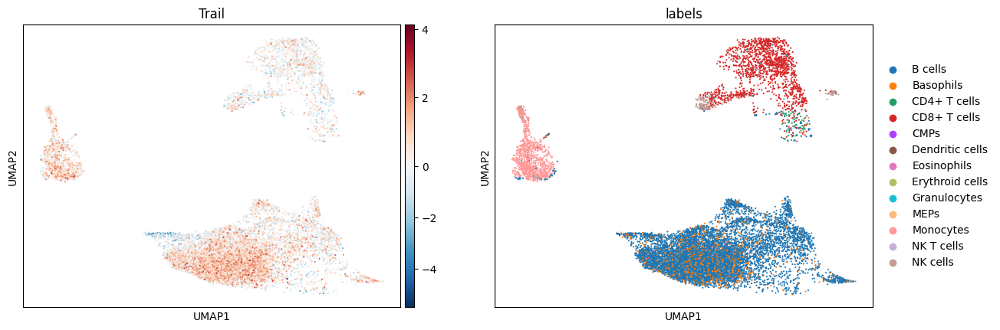

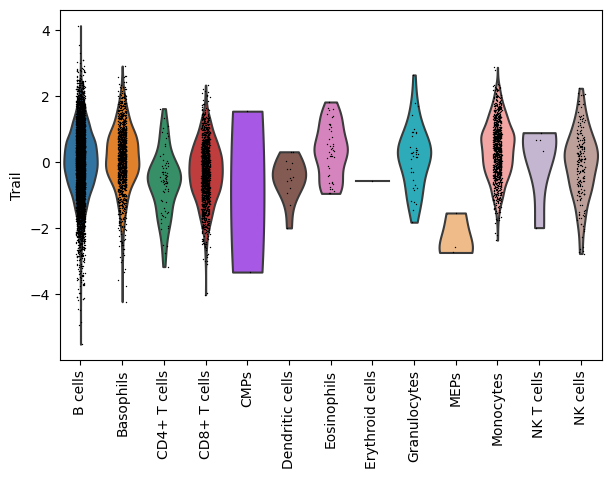

In [ ]:
sc.pl.umap(acts, color=['Trail', 'labels'], cmap='RdBu_r', vcenter=0)
sc.pl.violin(acts, keys=['Trail'], groupby='labels', rotation=90)

***Exploration***

We can visualize which pathways are more active in each cell type:

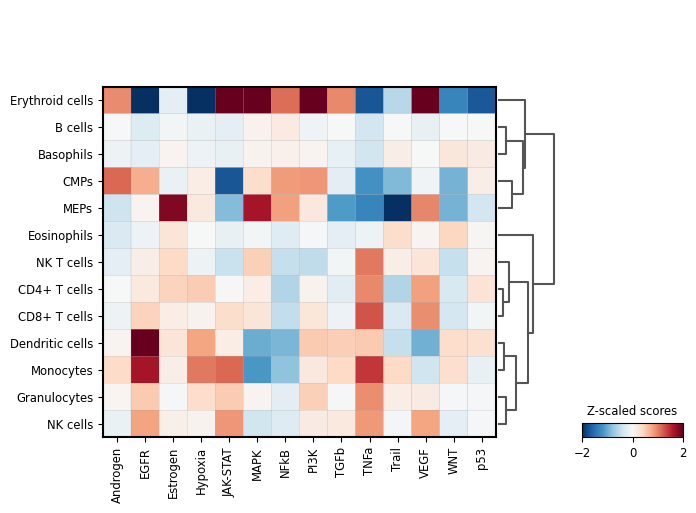

In [ ]:
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

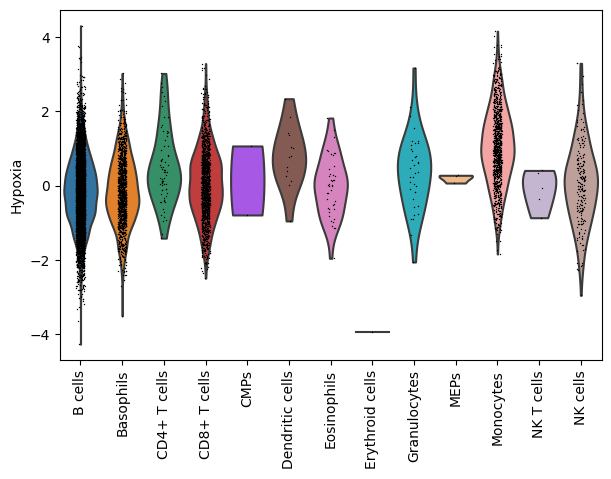

In [ ]:
sc.pl.violin(acts, keys=['Hypoxia'], groupby='labels', rotation=90)

**2.2 Transcription factor activity inference**

In [ ]:
msigdb = dc.get_resource('MSigDB')
msigdb

,genesymbol,collection,geneset
0,MAFF,chemical_and_genetic_perturbations,BOYAULT_LIVER_CANCER_SUBCLASS_G56_DN
1,MAFF,chemical_and_genetic_perturbations,ELVIDGE_HYPOXIA_UP
2,MAFF,chemical_and_genetic_perturbations,NUYTTEN_NIPP1_TARGETS_DN
3,MAFF,immunesigdb,GSE17721_POLYIC_VS_GARDIQUIMOD_4H_BMDC_DN
4,MAFF,chemical_and_genetic_perturbations,SCHAEFFER_PROSTATE_DEVELOPMENT_12HR_UP
...,...,...,...
3838543,PRAMEF22,go_biological_process,GOBP_POSITIVE_REGULATION_OF_CELL_POPULATION_PR...
3838544,PRAMEF22,go_biological_process,GOBP_APOPTOTIC_PROCESS
3838545,PRAMEF22,go_biological_process,GOBP_REGULATION_OF_CELL_DEATH
3838546,PRAMEF22,go_biological_process,GOBP_NEGATIVE_REGULATION_OF_DEVELOPMENTAL_PROCESS


In [ ]:
msigdb['collection'].unique()

array(['chemical_and_genetic_perturbations', 'immunesigdb',
       'mirna_targets_mirdb', 'go_molecular_function', 'tf_targets_gtrf',
       'tf_targets_legacy', 'oncogenic_signatures',
       'cell_type_signatures', 'vaccine_response',
       'go_biological_process', 'cancer_gene_neighborhoods',
       'cancer_modules', 'go_cellular_component', 'wikipathways',
       'reactome_pathways', 'hallmark', 'mirna_targets_legacy',
       'biocarta_pathways', 'positional', 'human_phenotype_ontology',
       'pid_pathways', 'kegg_pathways'], dtype=object)

In [ ]:
# Filter by hallmark
# msigdb = msigdb[msigdb['collection']=='hallmark']
msigdb = msigdb[msigdb['collection']=='wikipathways']

In [ ]:
msigdb

,genesymbol,collection,geneset
68,MAFF,wikipathways,WP_NUCLEAR_RECEPTORS_METAPATHWAY
167,MAFF,wikipathways,WP_NRF2_PATHWAY
368,MAFF,wikipathways,WP_ETHANOL_METABOLISM_PRODUCTION_OF_ROS_BY_CYP2E1
421,MAFF,wikipathways,WP_MYOMETRIAL_RELAXATION_AND_CONTRACTION_PATHWAYS
671,IER3,wikipathways,WP_IL18_SIGNALING_PATHWAY
...,...,...,...
3836250,DAZ2,wikipathways,WP_MALE_INFERTILITY
3836343,DAZ4,wikipathways,WP_MALE_INFERTILITY
3836711,DAZ3,wikipathways,WP_MALE_INFERTILITY
3837137,DAZ1,wikipathways,WP_MALE_INFERTILITY


In [ ]:
# Remove duplicated entries
msigdb = msigdb[~msigdb.duplicated(['geneset', 'genesymbol'])]
msigdb

,genesymbol,collection,geneset
68,MAFF,wikipathways,WP_NUCLEAR_RECEPTORS_METAPATHWAY
167,MAFF,wikipathways,WP_NRF2_PATHWAY
368,MAFF,wikipathways,WP_ETHANOL_METABOLISM_PRODUCTION_OF_ROS_BY_CYP2E1
421,MAFF,wikipathways,WP_MYOMETRIAL_RELAXATION_AND_CONTRACTION_PATHWAYS
671,IER3,wikipathways,WP_IL18_SIGNALING_PATHWAY
...,...,...,...
3836250,DAZ2,wikipathways,WP_MALE_INFERTILITY
3836343,DAZ4,wikipathways,WP_MALE_INFERTILITY
3836711,DAZ3,wikipathways,WP_MALE_INFERTILITY
3837137,DAZ1,wikipathways,WP_MALE_INFERTILITY


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


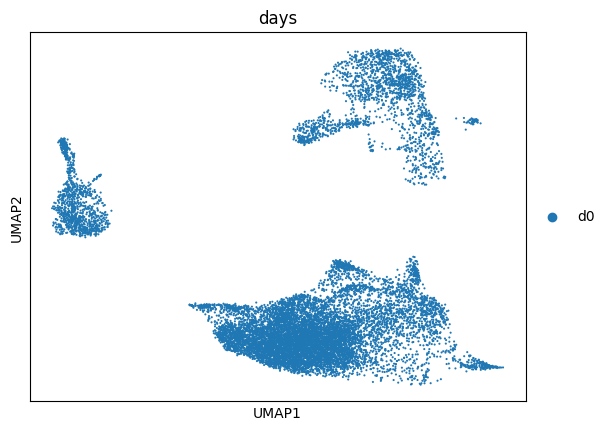

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


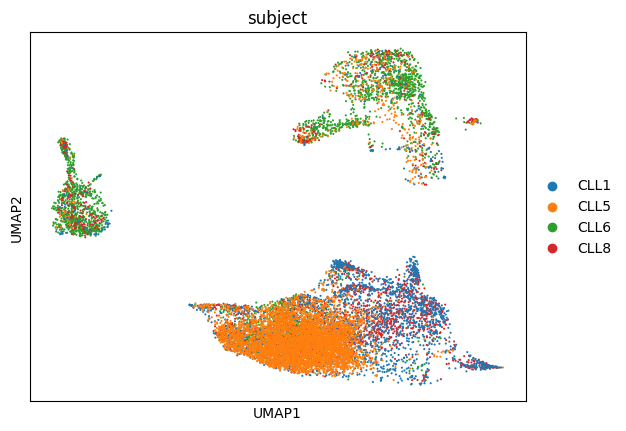

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


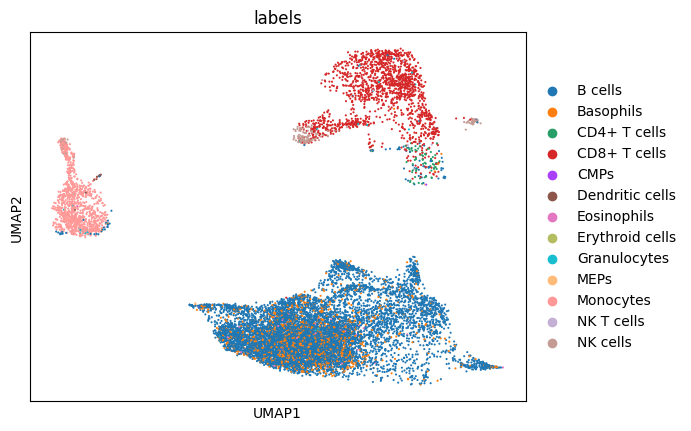

In [ ]:
#Exploring Day 0, before Ibrutinib treatment
sc.pl.umap(CLLdata_D0, color='days')
sc.pl.umap(CLLdata_D0, color='subject')
sc.pl.umap(CLLdata_D0, color='labels')

In [ ]:
dc.run_ora(
    mat=CLLdata_D0,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True
)

4594 features of mat are empty, they will be removed.
Running ora on mat with 12935 samples and 11739 targets for 646 sources.


100%|██████████| 12935/12935 [03:28<00:00, 61.99it/s]


In [ ]:
CLLdata_D0.obsm['ora_estimate']

source,WP_15Q112_COPY_NUMBER_VARIATION_SYNDROME,WP_15Q133_COPY_NUMBER_VARIATION_SYNDROME,WP_16P112_DISTAL_DELETION_SYNDROME,WP_16P112_PROXIMAL_DELETION_SYNDROME,WP_17Q12_COPY_NUMBER_VARIATION_SYNDROME,WP_1Q211_COPY_NUMBER_VARIATION_SYNDROME,WP_22Q112_COPY_NUMBER_VARIATION_SYNDROME,WP_2Q112_COPY_NUMBER_VARIATION_SYNDROME,WP_2Q13_COPY_NUMBER_VARIATION_SYNDROME,WP_2Q211_COPY_NUMBER_VARIATION_SYNDROME,...,WP_VITAMIN_D_METABOLISM,WP_VITAMIN_D_RECEPTOR_PATHWAY,WP_VITAMIN_K_METABOLISM_AND_ACTIVATION_OF_DEPENDENT_PROTEINS,WP_WHITE_FAT_CELL_DIFFERENTIATION,WP_WNTBETACATENIN_SIGNALING_PATHWAY_IN_LEUKEMIA,WP_WNT_SIGNALING,WP_WNT_SIGNALING_IN_KIDNEY_DISEASE,WP_WNT_SIGNALING_PATHWAY,WP_WNT_SIGNALING_PATHWAY_AND_PLURIPOTENCY,WP_ZINC_HOMEOSTASIS
CLL_AAACCTGAGACCTTTG-scRNA-seq_CLL6_d0,-0.000000,0.588936,0.279548,1.534155,-0.000000,-0.000000,0.575391,0.779608,1.083831,0.673503,...,-0.00000,1.731210,-0.000000,0.332345,-0.000000,0.575391,-0.000000,0.157007,0.262038,0.317919
CLL_AAACCTGAGCCGTCGT-scRNA-seq_CLL6_d0,0.628538,-0.000000,0.779608,1.534155,0.859287,-0.000000,0.076776,-0.000000,0.188566,-0.000000,...,-0.00000,2.818833,-0.000000,0.902097,1.058003,1.479644,-0.000000,1.535350,1.453323,-0.000000
CLL_AAACCTGCAAACAACA-scRNA-seq_CLL6_d0,0.628538,-0.000000,0.279548,0.602157,0.429736,-0.000000,0.076776,-0.000000,0.561635,-0.000000,...,-0.00000,0.545503,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.317919
CLL_AAACCTGCACTCGACG-scRNA-seq_CLL6_d0,-0.000000,0.588936,-0.000000,0.602157,2.043513,-0.000000,0.269091,0.779608,0.561635,0.673503,...,0.85887,1.271009,-0.000000,-0.000000,-0.000000,0.575391,0.467114,0.950465,1.453323,-0.000000
CLL_AAACGGGAGACAGAGA-scRNA-seq_CLL6_d0,-0.000000,-0.000000,-0.000000,1.023329,0.429736,-0.000000,0.269091,0.279548,1.083831,0.673503,...,-0.00000,3.437436,-0.000000,0.902097,-0.000000,0.575391,-0.000000,0.482892,0.262038,0.868842
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CLL_TTTGTCAGTTCGGGCT-scRNA-seq_CLL5_d0,-0.000000,-0.000000,0.779608,1.023329,2.043513,1.266316,1.479644,-0.000000,0.188566,-0.000000,...,-0.00000,0.545503,-0.000000,-0.000000,-0.000000,0.076776,-0.000000,-0.000000,0.074311,0.317919
CLL_TTTGTCAGTTGACGTT-scRNA-seq_CLL5_d0,-0.000000,-0.000000,0.779608,1.534155,0.859287,-0.000000,0.269091,0.779608,1.727780,0.673503,...,-0.00000,1.731210,-0.000000,-0.000000,-0.000000,0.076776,-0.000000,0.157007,0.074311,-0.000000
CLL_TTTGTCATCCGAATGT-scRNA-seq_CLL5_d0,0.628538,0.588936,0.279548,0.602157,0.136224,-0.000000,0.269091,0.279548,0.188566,0.673503,...,-0.00000,1.271009,0.785972,-0.000000,-0.000000,0.575391,0.467114,0.157007,0.262038,0.317919
CLL_TTTGTCATCCTCGCAT-scRNA-seq_CLL5_d0,0.628538,-0.000000,0.279548,1.534155,0.429736,-0.000000,0.575391,-0.000000,0.188566,-0.000000,...,-0.00000,1.731210,-0.000000,-0.000000,-0.000000,0.269091,-0.000000,0.482892,0.262038,0.317919


In [ ]:
acts = dc.get_acts(CLLdata_D0, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

AnnData object with n_obs × n_vars = 12935 × 646
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'days', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'labels', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2'
    var: 'mean', 'std'
    uns: 'days_colors', 'labels_colors', 'subject_colors', 'dendrogram_labels'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ora_estimate', 'ora_pvals'

In [ ]:
df = dc.rank_sources_groups(acts, groupby='labels', reference='rest', method='t-test_overestim_var')
df

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,B cells,rest,WP_ALLOGRAFT_REJECTION,39.117427,0.586393,0.000000e+00,0.000000e+00
1,B cells,rest,WP_EXTRAFOLLICULAR_AND_FOLLICULAR_B_CELL_ACTIV...,36.768291,0.528470,1.553428e-284,2.640827e-283
2,B cells,rest,WP_EDA_SIGNALING_IN_HAIR_FOLLICLE_DEVELOPMENT,35.766982,0.512822,8.343889e-270,1.347538e-268
3,B cells,rest,WP_GENES_ASSOCIATED_WITH_THE_DEVELOPMENT_OF_RH...,32.305373,0.472126,3.362910e-222,4.177769e-221
4,B cells,rest,WP_ULCERATIVE_COLITIS_SIGNALING,32.040855,0.463516,1.434940e-218,1.685403e-217
...,...,...,...,...,...,...,...
8393,NK cells,rest,WP_TRANSSULFURATION_ONECARBON_METABOLISM_AND_R...,-6.166014,-0.522575,1.985787e-09,2.983298e-08
8394,NK cells,rest,WP_CYTOPLASMIC_RIBOSOMAL_PROTEINS,-6.527745,-0.847612,2.465507e-10,4.308563e-09
8395,NK cells,rest,WP_ALLOGRAFT_REJECTION,-8.507075,-0.757435,4.484636e-16,1.524776e-14
8396,NK cells,rest,WP_CYTOKINES_AND_INFLAMMATORY_RESPONSE,-8.961545,-1.148183,2.199229e-17,1.092848e-15


/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


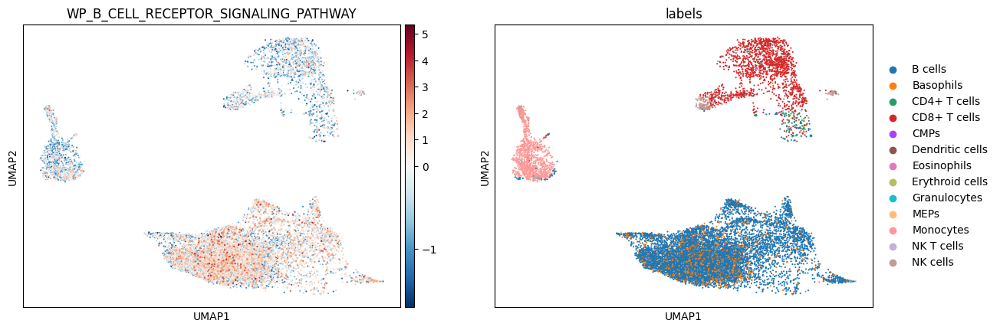

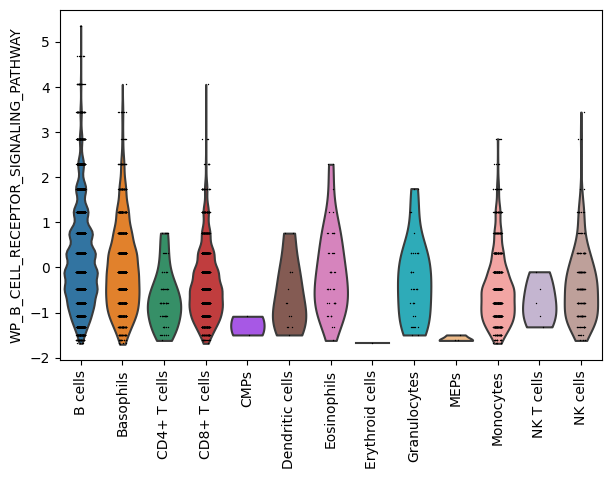

In [ ]:
sc.pl.umap(acts, color=['WP_B_CELL_RECEPTOR_SIGNALING_PATHWAY', 'labels'], cmap='RdBu_r', vcenter=0)
sc.pl.violin(acts, keys=['WP_B_CELL_RECEPTOR_SIGNALING_PATHWAY'], groupby='labels', rotation=90)

In [ ]:
n_markers = 3
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers
first_key = next(iter(source_markers))
print(first_key)
first_value = source_markers.pop(first_key)
print(first_value)
print(source_markers)

B cells
['WP_ALLOGRAFT_REJECTION', 'WP_EXTRAFOLLICULAR_AND_FOLLICULAR_B_CELL_ACTIVATION_BY_SARSCOV2', 'WP_EDA_SIGNALING_IN_HAIR_FOLLICLE_DEVELOPMENT']
{'Basophils': ['WP_ALLOGRAFT_REJECTION', 'WP_CYTOPLASMIC_RIBOSOMAL_PROTEINS', 'WP_ELECTRON_TRANSPORT_CHAIN_OXPHOS_SYSTEM_IN_MITOCHONDRIA'], 'CD4+ T cells': ['WP_IL7_SIGNALING_PATHWAY', 'WP_FOXP3_IN_COVID19', 'WP_MEASLES_VIRUS_INFECTION'], 'CD8+ T cells': ['WP_CANCER_IMMUNOTHERAPY_BY_PD1_BLOCKADE', 'WP_15Q133_COPY_NUMBER_VARIATION_SYNDROME', 'WP_INTERACTIONS_OF_NATURAL_KILLER_CELLS_IN_PANCREATIC_CANCER'], 'CMPs': ['WP_FAMILIAL_HYPERLIPIDEMIA_TYPE_4', 'WP_METABOLIC_REPROGRAMMING_IN_COLON_CANCER', 'WP_STATIN_INHIBITION_OF_CHOLESTEROL_PRODUCTION'], 'Dendritic cells': ['WP_SLEEP_REGULATION', 'WP_PROSTAGLANDIN_SYNTHESIS_AND_REGULATION', 'WP_ACTIVATION_OF_NLRP3_INFLAMMASOME_BY_SARSCOV2'], 'Eosinophils': ['WP_LIPID_METABOLISM_IN_SENESCENT_CELLS', 'WP_ELECTRON_TRANSPORT_CHAIN_OXPHOS_SYSTEM_IN_MITOCHONDRIA', 'WP_MITOCHONDRIAL_COMPLEX_IV_ASSEMBLY']

categories: B cells, Basophils, CD4+ T cells, etc.
var_group_labels: Basophils, CD4+ T cells, CD8+ T cells, etc.


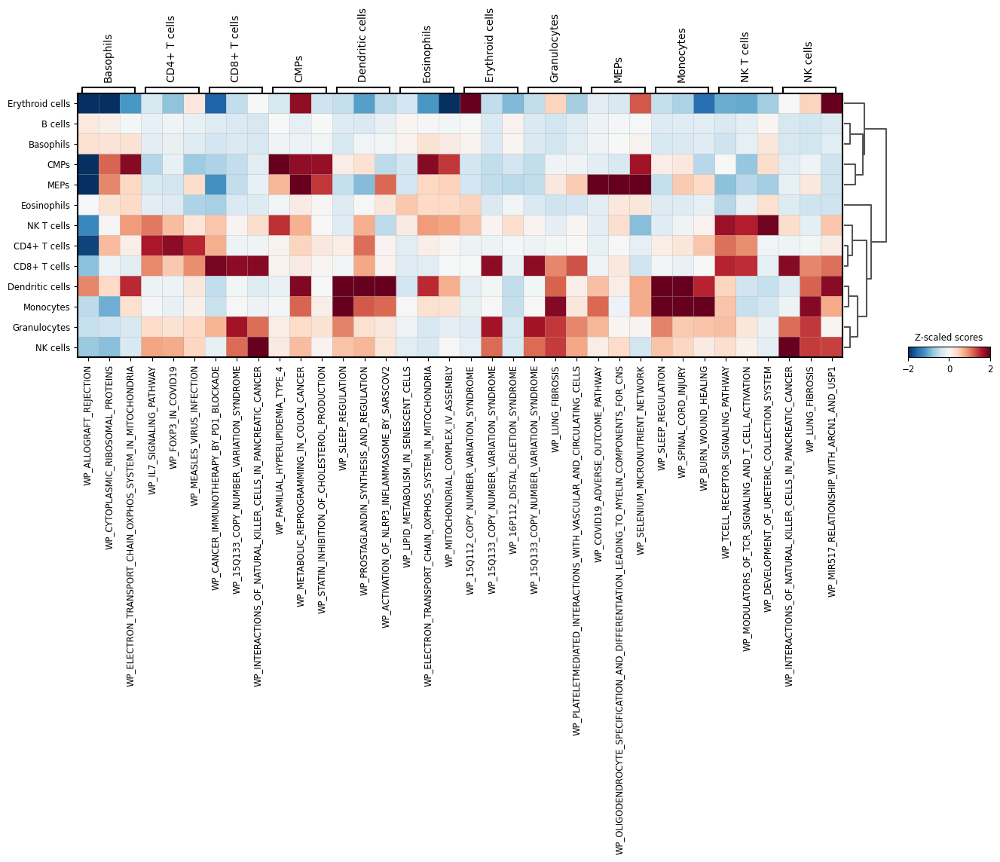

In [ ]:
sc.pl.matrixplot(acts, source_markers, dendrogram=True, groupby='labels', colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

***Obtaining Oxidative Phosphorylation from WikiPathways corroborates that we have captured a major GROUND TRUTH for this dataset, based on Rendeiro et al.***

At this point, we are going to use Dorothea to infer active transcirption factors across CLL PBMCs to gain a better understanding of the transcriptional landscape:

***CollecTRI network***

In [ ]:
net = dc.get_dorothea()
net

,source,confidence,target,weight
0,MYC,A,TERT,1.000000
1,FOS,A,NTS,1.000000
2,FOS,A,NTF3,1.000000
3,FOS,A,NFKB1,-1.000000
4,FOS,A,NEFL,1.000000
...,...,...,...,...
32270,LEF1,C,NKD1,0.333333
32271,LEF1,C,NETO2,0.333333
32272,LEF1,C,MYO18B,0.333333
32273,LEF1,C,PHLDB2,0.333333


To infer TF enrichment scores we will run the univariate linear model (ulm) method. For each cell in our dataset (adata) and each TF in our network (net), it fits a linear model that predicts the observed gene expression based solely on the TF’s TF-Gene interaction weights. Once fitted, the obtained t-value of the slope is the score. If it is positive, we interpret that the TF is active and if it is negative we interpret that it is inactive.

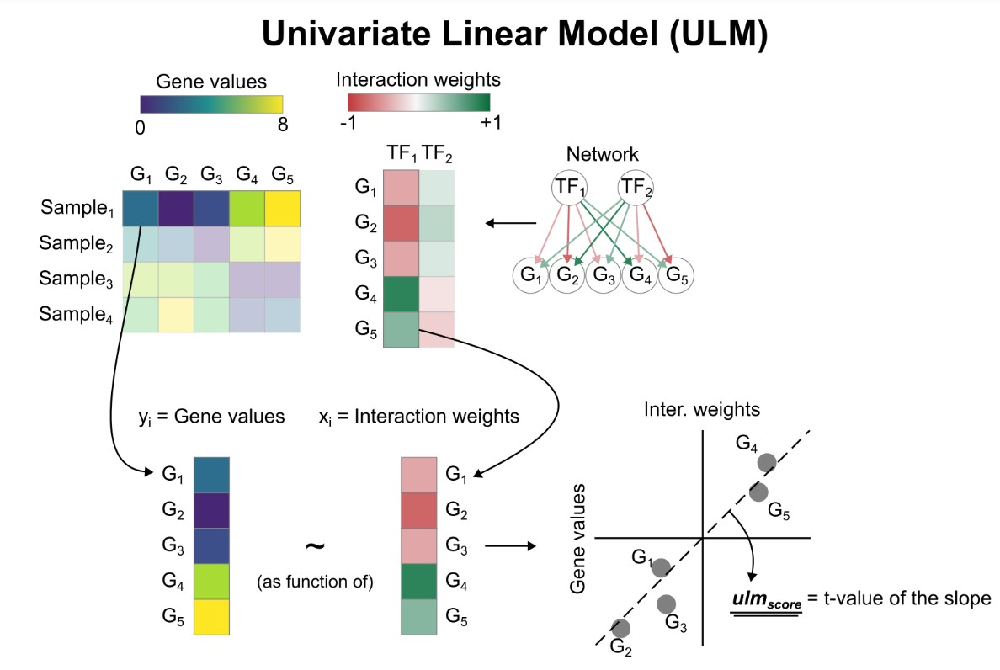

In [ ]:
dc.run_ulm(
    mat=CLLdata_D0,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

CLLdata_D0.obsm['ulm_estimate']

4594 features of mat are empty, they will be removed.
Running ulm on mat with 12935 samples and 11739 targets for 280 sources.


100%|██████████| 2/2 [00:03<00:00,  1.51s/it]


,AHR,AR,ARID2,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,...,ZNF217,ZNF24,ZNF263,ZNF274,ZNF384,ZNF584,ZNF592,ZNF639,ZNF644,ZNF740
CLL_AAACCTGAGACCTTTG-scRNA-seq_CLL6_d0,-0.491963,0.971245,-1.462781,0.533206,0.118556,-1.023598,2.028134,2.062400,1.311146,0.693954,...,-0.767557,-0.900167,-1.041325,-1.106649,0.881309,-0.717953,-0.323274,-0.186179,-0.664726,0.233441
CLL_AAACCTGAGCCGTCGT-scRNA-seq_CLL6_d0,0.448913,0.873858,0.296786,-0.340273,-0.264940,-1.351295,0.065680,2.668662,0.898892,-0.292208,...,-0.709068,-0.085716,-2.321692,-0.461950,-1.265330,-0.663243,-0.904149,1.432075,0.395674,-1.341335
CLL_AAACCTGCAAACAACA-scRNA-seq_CLL6_d0,0.280193,3.226438,0.558719,0.383126,1.034117,-1.605094,1.129380,1.700668,1.564707,-0.896747,...,-0.842225,-0.987736,-1.532309,-1.214309,-0.271801,-0.787794,-0.427976,0.118718,-0.729389,-0.762667
CLL_AAACCTGCACTCGACG-scRNA-seq_CLL6_d0,0.612979,3.384198,0.208894,-0.190898,1.003620,-1.409196,0.767438,1.681823,3.653264,-0.921775,...,0.119107,-0.867199,-1.183686,-0.515947,-1.042676,0.226122,-0.942886,1.049022,-0.640381,1.453124
CLL_AAACGGGAGACAGAGA-scRNA-seq_CLL6_d0,1.891053,2.755832,0.100027,-0.748055,0.262214,-0.323077,3.003354,5.198338,0.025591,1.390959,...,-0.743491,-0.185443,-2.052444,-1.071948,-0.939487,0.164956,-0.948044,0.968645,-0.643884,-0.594380
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CLL_TTTGTCAGTTCGGGCT-scRNA-seq_CLL5_d0,-0.654287,2.071696,-0.629790,-0.993786,0.408201,-0.629787,0.026227,0.915236,0.511951,0.329970,...,-0.598881,-0.702347,-3.007774,-0.863444,-0.896083,-0.560182,-0.763640,0.315659,-0.518650,0.830226
CLL_TTTGTCAGTTGACGTT-scRNA-seq_CLL5_d0,-0.558557,2.590312,-0.756987,-1.082126,-0.696574,-0.756983,0.500958,0.390602,-0.333927,-0.484264,...,1.195824,-0.764777,-1.778395,-0.348138,-0.196025,0.377717,-0.831520,-0.150715,-0.564751,-0.028793
CLL_TTTGTCATCCGAATGT-scRNA-seq_CLL5_d0,0.098350,1.541124,-1.090878,-0.949886,1.535774,-1.090873,-0.911595,-0.068553,0.066078,-0.189343,...,0.372501,-0.671322,-2.647698,-0.825303,-0.149558,-0.535437,-0.729909,0.540949,-0.495740,-0.606149
CLL_TTTGTCATCCTCGCAT-scRNA-seq_CLL5_d0,-0.729687,2.213271,-0.230485,-0.490381,0.752312,-0.718405,-0.467705,1.989579,2.054785,0.528057,...,-0.633029,0.049231,-1.987842,0.276788,0.945839,-0.592121,-0.807183,2.251276,-0.548222,-0.729253


In [ ]:
acts = dc.get_acts(CLLdata_D0, obsm_key='ulm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

AnnData object with n_obs × n_vars = 12935 × 280
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'days', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'labels', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2'
    var: 'mean', 'std'
    uns: 'days_colors', 'labels_colors', 'subject_colors', 'dendrogram_labels'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'progeny_mlm_estimate', 'progeny_mlm_pvals', 'ora_estimate', 'ora_pvals', 'ulm_estimate', 'ulm_pvals'

In [ ]:
df = dc.rank_sources_groups(acts, groupby='labels', reference='rest', method='t-test_overestim_var')
df

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,B cells,rest,RFX5,77.906407,1.106853,0.000000e+00,0.000000e+00
1,B cells,rest,POU5F1,70.927591,1.025183,0.000000e+00,0.000000e+00
2,B cells,rest,IRF4,62.991570,0.875624,0.000000e+00,0.000000e+00
3,B cells,rest,POU2F1,58.227421,0.867210,0.000000e+00,0.000000e+00
4,B cells,rest,RBPJ,54.392151,0.754071,0.000000e+00,0.000000e+00
...,...,...,...,...,...,...,...
3635,NK cells,rest,PAX5,-9.336069,-0.794530,1.266265e-18,1.611611e-17
3636,NK cells,rest,POU2F1,-10.908559,-1.132824,2.216325e-24,6.205710e-23
3637,NK cells,rest,CREB1,-13.025812,-1.340957,1.694799e-32,7.909064e-31
3638,NK cells,rest,POU5F1,-14.355891,-1.626668,1.720983e-37,1.204688e-35


In [ ]:
n_markers = 3
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers
first_key = next(iter(source_markers))
print(first_key)
first_value = source_markers.pop(first_key)
print(first_value)
print(source_markers)

B cells
['RFX5', 'POU5F1', 'IRF4']
{'Basophils': ['RFX5', 'E2F7', 'CREB1'], 'CD4+ T cells': ['MYC', 'ETS1', 'HOXB13'], 'CD8+ T cells': ['ATF3', 'REL', 'JUND'], 'CMPs': ['MYC', 'NFE2L2', 'EPAS1'], 'Dendritic cells': ['SRF', 'HIF1A', 'ETV4'], 'Eosinophils': ['TP53', 'E2F7', 'MAX'], 'Erythroid cells': ['AHR', 'AR', 'ARID2'], 'Granulocytes': ['JUND', 'ATF3', 'REL'], 'MEPs': ['MYC', 'E2F5', 'SREBF2'], 'Monocytes': ['CEBPB', 'SPI1', 'HNF4G'], 'NK T cells': ['STAT4', 'E2F5', 'TGIF2'], 'NK cells': ['IRF1', 'FLI1', 'JUND']}


categories: B cells, Basophils, CD4+ T cells, etc.
var_group_labels: Basophils, CD4+ T cells, CD8+ T cells, etc.


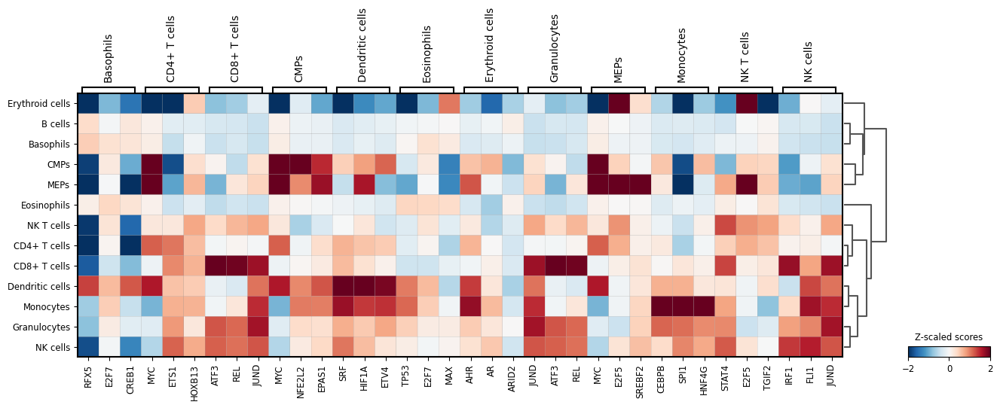

In [ ]:
sc.pl.matrixplot(acts, source_markers, 'labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

***There are several transcription factors that have been implicated in carcinogenesis across the CLL microenvironment in the blood. RFX5 has been previously reported in CLL (doi:10.3324/haematol.2017.177212).***

In [ ]:
# Exploring day 30

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


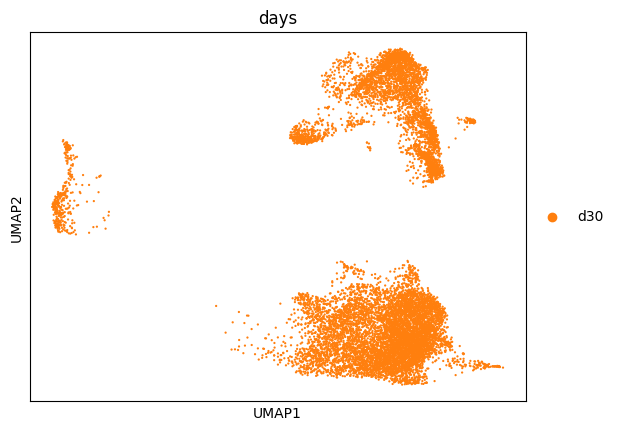

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


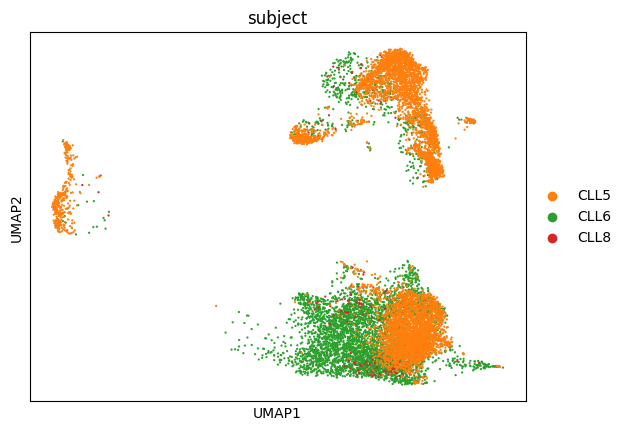

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


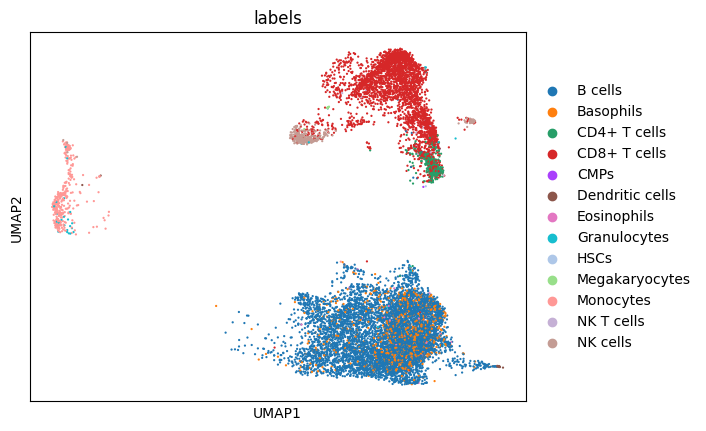

In [ ]:
sc.pl.umap(CLLdata_D30, color='days')
sc.pl.umap(CLLdata_D30, color='subject')
sc.pl.umap(CLLdata_D30, color='labels')

In [ ]:
dc.run_ora(
    mat=CLLdata_D30,
    net=msigdb,
    source='geneset',
    target='genesymbol',
    verbose=True
)

5180 features of mat are empty, they will be removed.
Running ora on mat with 11644 samples and 11153 targets for 635 sources.


100%|██████████| 11644/11644 [02:46<00:00, 69.85it/s]


In [ ]:
CLLdata_D30.obsm['ora_estimate']

source,WP_15Q112_COPY_NUMBER_VARIATION_SYNDROME,WP_15Q133_COPY_NUMBER_VARIATION_SYNDROME,WP_16P112_DISTAL_DELETION_SYNDROME,WP_16P112_PROXIMAL_DELETION_SYNDROME,WP_17Q12_COPY_NUMBER_VARIATION_SYNDROME,WP_1Q211_COPY_NUMBER_VARIATION_SYNDROME,WP_22Q112_COPY_NUMBER_VARIATION_SYNDROME,WP_2Q112_COPY_NUMBER_VARIATION_SYNDROME,WP_2Q13_COPY_NUMBER_VARIATION_SYNDROME,WP_2Q211_COPY_NUMBER_VARIATION_SYNDROME,...,WP_VITAMIN_D_METABOLISM,WP_VITAMIN_D_RECEPTOR_PATHWAY,WP_VITAMIN_K_METABOLISM_AND_ACTIVATION_OF_DEPENDENT_PROTEINS,WP_WHITE_FAT_CELL_DIFFERENTIATION,WP_WNTBETACATENIN_SIGNALING_PATHWAY_IN_LEUKEMIA,WP_WNT_SIGNALING,WP_WNT_SIGNALING_IN_KIDNEY_DISEASE,WP_WNT_SIGNALING_PATHWAY,WP_WNT_SIGNALING_PATHWAY_AND_PLURIPOTENCY,WP_ZINC_HOMEOSTASIS
CLL_AAACCTGAGAGACTTA-scRNA-seq_CLL6_d30,0.693336,-0.000000,-0.000000,1.084916,0.470647,0.540633,-0.000000,-0.000000,0.610798,-0.000000,...,0.80641,1.938919,-0.0,0.364190,-0.000000,1.735850,0.540633,1.051087,0.643719,-0.000000
CLL_AAACCTGCACTATCTT-scRNA-seq_CLL6_d30,0.693336,0.648074,-0.000000,0.643719,0.928988,-0.000000,0.616180,0.294739,1.165472,1.710855,...,0.80641,0.350125,-0.0,-0.000000,0.485208,1.173416,0.540633,1.051087,0.090379,-0.000000
CLL_AAACCTGCATTAACCG-scRNA-seq_CLL6_d30,0.693336,-0.000000,0.294739,1.616736,0.152308,0.540633,1.043833,0.294739,0.208862,-0.000000,...,-0.00000,1.001692,-0.0,0.364190,-0.000000,0.340665,-0.000000,0.181023,0.090379,-0.000000
CLL_AAACCTGGTAATTGGA-scRNA-seq_CLL6_d30,0.693336,-0.000000,-0.000000,2.227930,0.470647,-0.000000,0.291791,0.814362,0.610798,0.693336,...,-0.00000,1.001692,-0.0,0.364190,-0.000000,0.703373,0.540633,0.181023,0.307130,0.333866
CLL_AAACCTGGTGTTCTTT-scRNA-seq_CLL6_d30,-0.000000,-0.000000,-0.000000,0.307130,0.928988,-0.000000,0.616180,0.294739,0.208862,-0.000000,...,-0.00000,1.938919,-0.0,-0.000000,0.485208,0.102627,-0.000000,0.181023,0.090379,-0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CLL_TTTGTCACAGTATGCT-scRNA-seq_CLL5_d30,-0.000000,0.648074,0.814362,1.616736,2.176086,-0.000000,0.291791,0.294739,0.610798,0.693336,...,-0.00000,0.636462,-0.0,-0.000000,0.485208,1.735850,-0.000000,1.051087,0.643719,-0.000000
CLL_TTTGTCAGTCAAACTC-scRNA-seq_CLL5_d30,-0.000000,-0.000000,-0.000000,2.909653,0.470647,-0.000000,2.823597,0.814362,0.208862,1.710855,...,-0.00000,5.229542,-0.0,1.762087,-0.000000,0.703373,0.540633,0.542606,0.643719,0.904740
CLL_TTTGTCAGTTCAGCGC-scRNA-seq_CLL5_d30,-0.000000,0.648074,0.294739,1.616736,1.503392,-0.000000,0.084870,0.294739,2.626037,-0.000000,...,-0.00000,0.149730,-0.0,-0.000000,-0.000000,0.102627,-0.000000,0.542606,0.307130,0.333866
CLL_TTTGTCATCACGCATA-scRNA-seq_CLL5_d30,-0.000000,-0.000000,0.294739,0.643719,0.470647,-0.000000,0.616180,-0.000000,1.165472,-0.000000,...,-0.00000,1.001692,-0.0,-0.000000,-0.000000,0.102627,-0.000000,0.181023,0.090379,0.904740


In [ ]:
acts = dc.get_acts(CLLdata_D30, obsm_key='ora_estimate')

# We need to remove inf and set them to the maximum value observed
acts_v = acts.X.ravel()
max_e = np.nanmax(acts_v[np.isfinite(acts_v)])
acts.X[~np.isfinite(acts.X)] = max_e

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

AnnData object with n_obs × n_vars = 11644 × 635
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'days', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'labels', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2'
    var: 'mean', 'std'
    uns: 'days_colors', 'labels_colors', 'subject_colors'
    obsm: 'X_pca', 'X_umap', 'mlm_estimate', 'mlm_pvals', 'ora_estimate', 'ora_pvals'

In [ ]:
df = dc.rank_sources_groups(acts, groupby='labels', reference='rest', method='t-test_overestim_var')
df

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


,group,reference,names,statistic,meanchange,pvals,pvals_adj
0,B cells,rest,WP_CYTOKINES_AND_INFLAMMATORY_RESPONSE,70.808130,1.087649,0.000000e+00,0.000000e+00
1,B cells,rest,WP_ALLOGRAFT_REJECTION,53.088479,0.856401,0.000000e+00,0.000000e+00
2,B cells,rest,WP_GENES_ASSOCIATED_WITH_THE_DEVELOPMENT_OF_RH...,49.277564,0.791688,0.000000e+00,0.000000e+00
3,B cells,rest,WP_EBOLA_VIRUS_INFECTION_IN_HOST,45.184072,0.746407,0.000000e+00,0.000000e+00
4,B cells,rest,WP_CARDIAC_PROGENITOR_DIFFERENTIATION,38.200722,0.637036,1.930962e-302,2.786730e-301
...,...,...,...,...,...,...,...
8250,NK cells,rest,WP_GENES_CONTROLLING_NEPHROGENESIS,-9.721371,-0.630588,7.552720e-21,1.776288e-19
8251,NK cells,rest,WP_CARDIAC_PROGENITOR_DIFFERENTIATION,-10.026557,-0.661201,4.950401e-22,1.309794e-20
8252,NK cells,rest,WP_GENES_ASSOCIATED_WITH_THE_DEVELOPMENT_OF_RH...,-12.191265,-0.769811,1.470810e-30,9.339643e-29
8253,NK cells,rest,WP_CYTOKINES_AND_INFLAMMATORY_RESPONSE,-18.194966,-1.255744,1.968904e-60,3.125635e-58


In [ ]:
n_markers = 3
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers
first_key = next(iter(source_markers))
print(first_key)
first_value = source_markers.pop(first_key)
print(first_value)
print(source_markers)

B cells
['WP_CYTOKINES_AND_INFLAMMATORY_RESPONSE', 'WP_ALLOGRAFT_REJECTION', 'WP_GENES_ASSOCIATED_WITH_THE_DEVELOPMENT_OF_RHEUMATOID_ARTHRITIS']
{'Basophils': ['WP_EBOLA_VIRUS_INFECTION_IN_HOST', 'WP_CYTOKINES_AND_INFLAMMATORY_RESPONSE', 'WP_ALLOGRAFT_REJECTION'], 'CD4+ T cells': ['WP_TCELL_ANTIGEN_RECEPTOR_TCR_PATHWAY_DURING_STAPHYLOCOCCUS_AUREUS_INFECTION', 'WP_TCELL_RECEPTOR_SIGNALING_PATHWAY', 'WP_TH17_CELL_DIFFERENTIATION_PATHWAY'], 'CD8+ T cells': ['WP_15Q133_COPY_NUMBER_VARIATION_SYNDROME', 'WP_CANCER_IMMUNOTHERAPY_BY_PD1_BLOCKADE', 'WP_TCELL_RECEPTOR_SIGNALING_PATHWAY'], 'CMPs': ['WP_15Q112_COPY_NUMBER_VARIATION_SYNDROME', 'WP_15Q133_COPY_NUMBER_VARIATION_SYNDROME', 'WP_16P112_DISTAL_DELETION_SYNDROME'], 'Dendritic cells': ['WP_SLEEP_REGULATION', 'WP_TYPE_I_COLLAGEN_SYNTHESIS_IN_THE_CONTEXT_OF_OSTEOGENESIS_IMPERFECTA', 'WP_DEGRADATION_PATHWAY_OF_SPHINGOLIPIDS_INCLUDING_DISEASES'], 'Eosinophils': ['WP_CYTOKINES_AND_INFLAMMATORY_RESPONSE', 'WP_LEUKOCYTEINTRINSIC_HIPPO_PATHWAY_FUN

categories: B cells, Basophils, CD4+ T cells, etc.
var_group_labels: Basophils, CD4+ T cells, CD8+ T cells, etc.


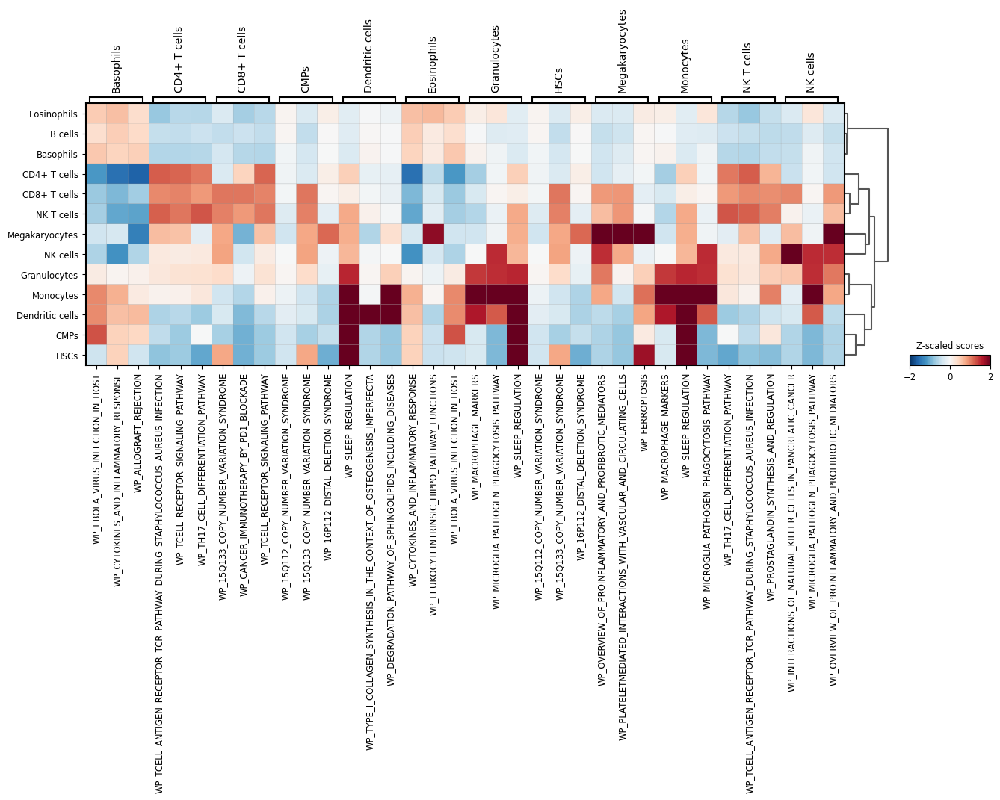

In [ ]:
sc.pl.matrixplot(acts, source_markers, dendrogram=True, groupby='labels', colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

***Obviously, 30 days of treatment with Ibrutinib has started to change the biological pathways involved across CLL PBMCs***

5180 features of mat are empty, they will be removed.
Running ulm on mat with 11644 samples and 11153 targets for 277 sources.


100%|██████████| 2/2 [00:03<00:00,  1.57s/it]
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


B cells
['RFX5', 'POU2F1', 'POU2F2']
{'Basophils': ['RFX5', 'POU2F2', 'CREB1'], 'CD4+ T cells': ['MYC', 'ETS1', 'ELK1'], 'CD8+ T cells': ['ATF3', 'JUND', 'REL'], 'CMPs': ['AHR', 'AR', 'ARID2'], 'Dendritic cells': ['RARG', 'IRF3', 'IRF9'], 'Eosinophils': ['CREB1', 'POU2F2', 'MAFB'], 'Granulocytes': ['CEBPB', 'SPI1', 'STAT1'], 'HSCs': ['AHR', 'AR', 'ARID2'], 'Megakaryocytes': ['FOSL1', 'GATA1', 'JUND'], 'Monocytes': ['SPI1', 'STAT1', 'CEBPB'], 'NK T cells': ['SRF', 'ETS1', 'ESR2'], 'NK cells': ['STAT5B', 'IRF1', 'STAT5A']}
categories: B cells, Basophils, CD4+ T cells, etc.
var_group_labels: Basophils, CD4+ T cells, CD8+ T cells, etc.


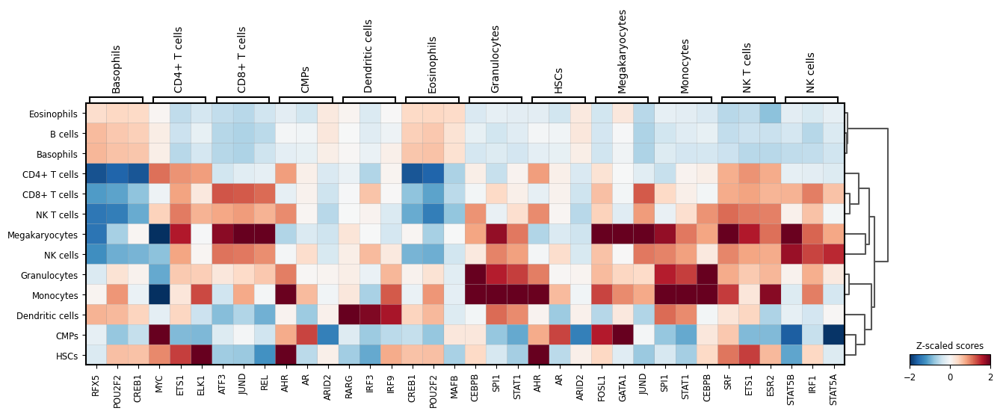

In [ ]:
# Transcription Factor activity
net = dc.get_dorothea()
net

dc.run_ulm(
    mat=CLLdata_D30,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True,
    use_raw=False
)

CLLdata_D30.obsm['ulm_estimate']

acts = dc.get_acts(CLLdata_D30, obsm_key='ulm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

df = dc.rank_sources_groups(acts, groupby='labels', reference='rest', method='t-test_overestim_var')
df

n_markers = 3
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers
first_key = next(iter(source_markers))
print(first_key)
first_value = source_markers.pop(first_key)
print(first_value)
print(source_markers)

sc.pl.matrixplot(acts, source_markers, 'labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

It seems that CLL B cells start to recover towards a more normal-like transcriptional signature. It is vey interesting that POU2F2 (OCT2) which is a normal super-enhancer to tumor supressor circuitries becomes highly active. These in silico findings are in line with Andrews et al. 2021 (https://doi.org/10.1016/j.ebiom.2021.103559). (Adopted from Figure 5A)

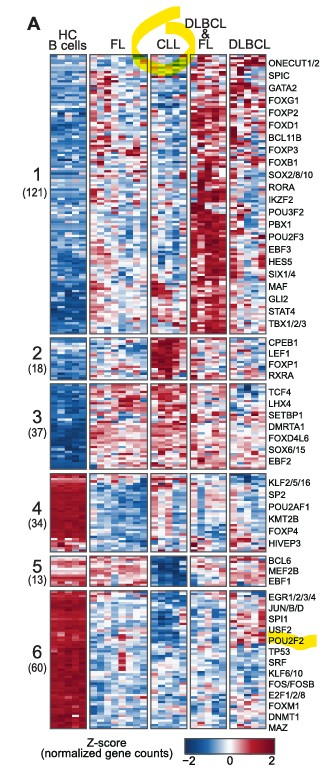

5180 features of mat are empty, they will be removed.
Running mlm on mat with 11644 samples and 11153 targets for 14 sources.


100%|██████████| 2/2 [00:20<00:00, 10.01s/it]


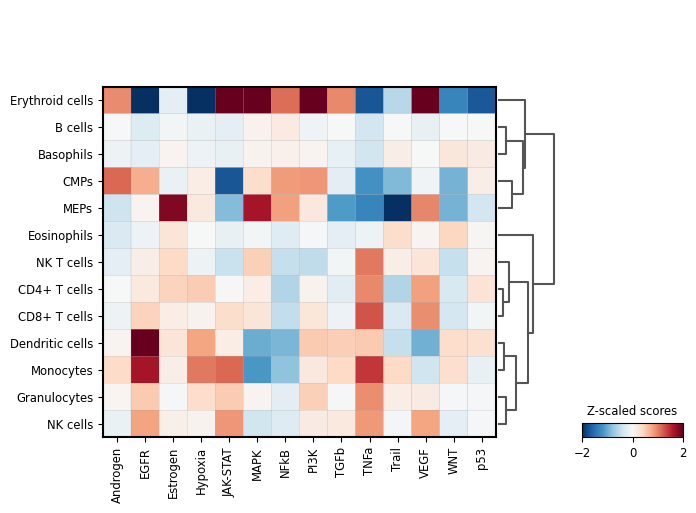

In [ ]:
dc.run_mlm(
    mat=CLLdata_D30,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

#Visualization
acts = dc.get_acts(CLLdata_D0, obsm_key='mlm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

#Explore
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


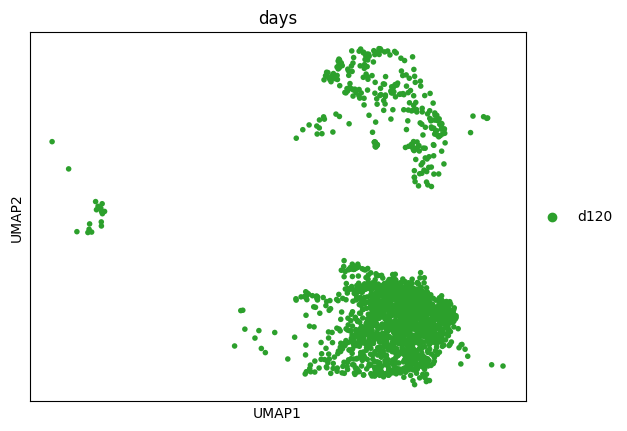

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


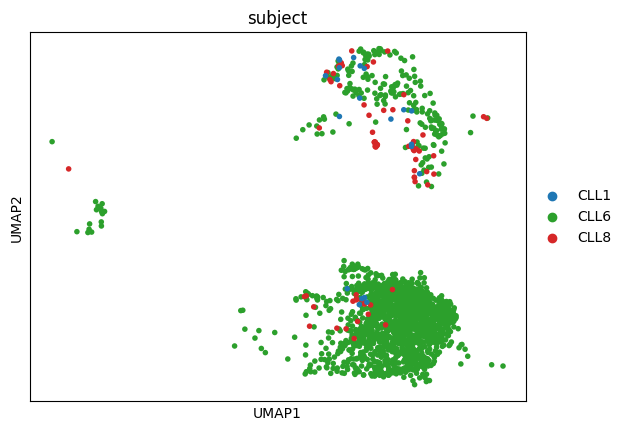

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


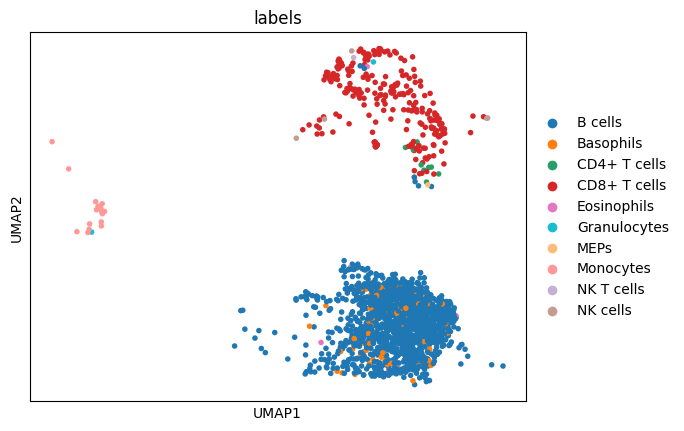

In [ ]:
# Exploring day 120 post-Ibrutinib
sc.pl.umap(CLLdata_D120, color='days')
sc.pl.umap(CLLdata_D120, color='subject')
sc.pl.umap(CLLdata_D120, color='labels')

6210 features of mat are empty, they will be removed.
Running ulm on mat with 1876 samples and 10123 targets for 277 sources.


100%|██████████| 1/1 [00:00<00:00,  2.60it/s]
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


B cells
['RFX5', 'POU2F1', 'POU2F2']
{'Basophils': ['RFX5', 'POU2F1', 'POU2F2'], 'CD4+ T cells': ['HIF1A', 'ETV4', 'RUNX1'], 'CD8+ T cells': ['JUND', 'ATF3', 'REL'], 'Eosinophils': ['SNAPC4', 'HNF1B', 'MAFB'], 'Granulocytes': ['FOXM1', 'STAT3', 'ELK1'], 'MEPs': ['AHR', 'AR', 'ARID2'], 'Monocytes': ['CEBPB', 'ESR2', 'SRF'], 'NK T cells': ['AHR', 'AR', 'ARID2'], 'NK cells': ['STAT4', 'NR1H3', 'CTCFL']}
categories: B cells, Basophils, CD4+ T cells, etc.
var_group_labels: Basophils, CD4+ T cells, CD8+ T cells, etc.


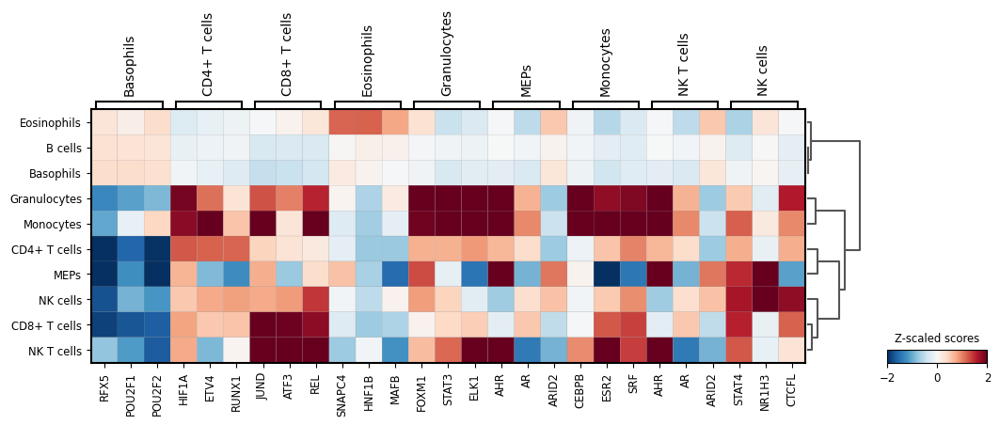

In [ ]:
net = dc.get_dorothea()
net

dc.run_ulm(
    mat=CLLdata_D120,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

CLLdata_D120.obsm['ulm_estimate']



acts = dc.get_acts(CLLdata_D120, obsm_key='ulm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

df = dc.rank_sources_groups(acts, groupby='labels', reference='rest', method='t-test_overestim_var')
df



n_markers = 3
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers
first_key = next(iter(source_markers))
print(first_key)
first_value = source_markers.pop(first_key)
print(first_value)
print(source_markers)


sc.pl.matrixplot(acts, source_markers, 'labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

6210 features of mat are empty, they will be removed.
Running mlm on mat with 1876 samples and 10123 targets for 14 sources.


100%|██████████| 1/1 [00:01<00:00,  1.49s/it]


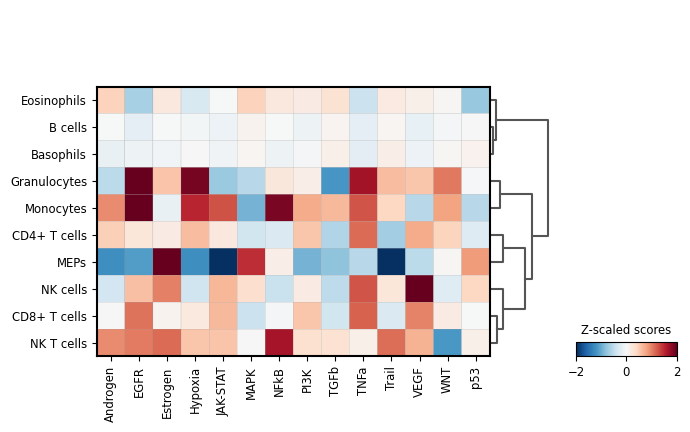

In [ ]:
progeny = dc.get_progeny(organism='human', top=500)
progeny

dc.run_mlm(
    mat=CLLdata_D120,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)


CLLdata_D120.obsm['mlm_estimate']

#Visualization
acts = dc.get_acts(CLLdata_D120, obsm_key='mlm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

#Explore
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


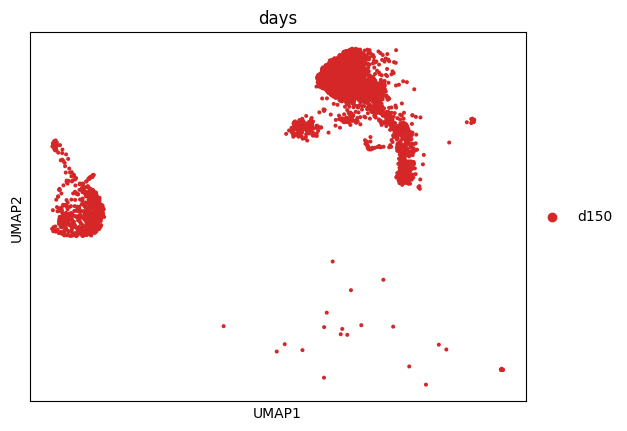

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


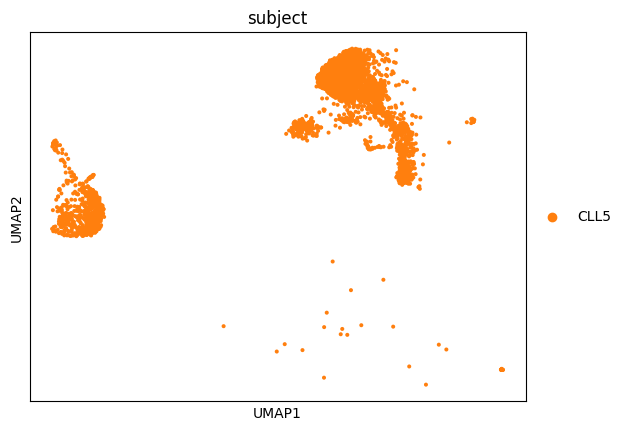

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


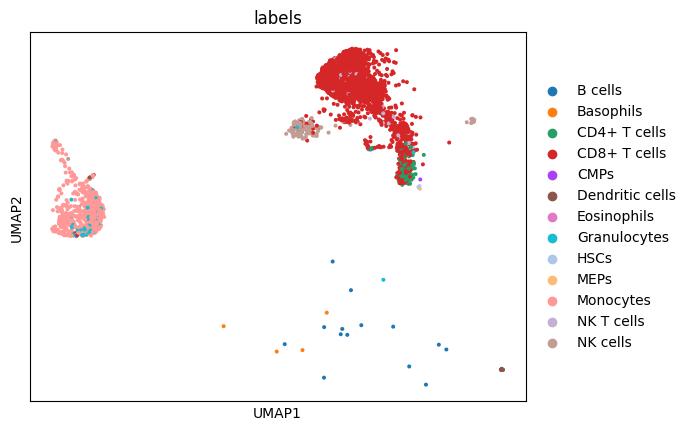

In [ ]:
# explore d150
sc.pl.umap(CLLdata_D150, color='days')
sc.pl.umap(CLLdata_D150, color='subject')
sc.pl.umap(CLLdata_D150, color='labels')

7124 features of mat are empty, they will be removed.
Running ulm on mat with 3585 samples and 9209 targets for 275 sources.


100%|██████████| 1/1 [00:00<00:00,  1.52it/s]
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


B cells
['RFX5', 'POU2F1', 'POU5F1']
{'Basophils': ['RFX5', 'RBPJ', 'IRF4'], 'CD4+ T cells': ['MYC', 'TGIF2', 'E2F5'], 'CD8+ T cells': ['ATF3', 'CREM', 'IRF3'], 'CMPs': ['ZBED1', 'HSF1', 'ETV4'], 'Dendritic cells': ['RFX5', 'POU2F1', 'POU2F2'], 'Eosinophils': ['AHR', 'AR', 'ARID2'], 'Granulocytes': ['CEBPB', 'SPI1', 'CEBPA'], 'HSCs': ['FOXP1', 'SMAD5', 'MYC'], 'MEPs': ['SREBF1', 'MYC', 'HSF1'], 'Monocytes': ['CEBPB', 'STAT1', 'SPI1'], 'NK T cells': ['TGIF2', 'MYC', 'NR2C2'], 'NK cells': ['STAT5B', 'STAT5A', 'BHLHE22']}
categories: B cells, Basophils, CD4+ T cells, etc.
var_group_labels: Basophils, CD4+ T cells, CD8+ T cells, etc.


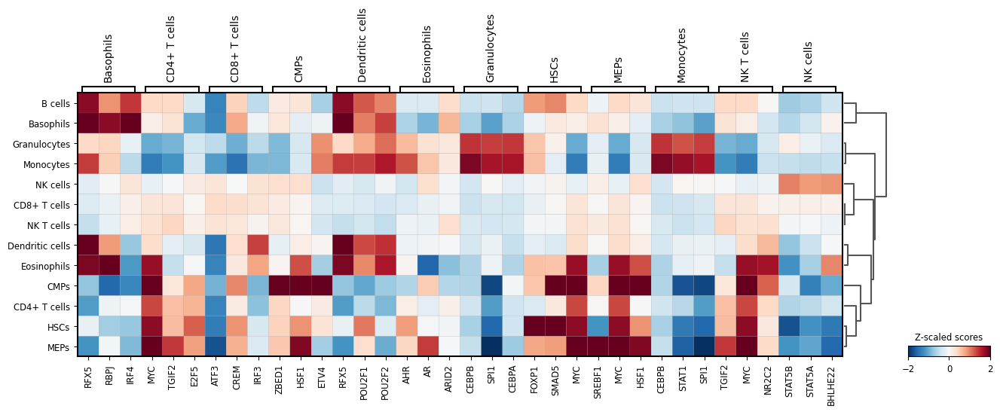

In [ ]:
net = dc.get_dorothea()
net

dc.run_ulm(
    mat=CLLdata_D150,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

CLLdata_D150.obsm['ulm_estimate']



acts = dc.get_acts(CLLdata_D150, obsm_key='ulm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

df = dc.rank_sources_groups(acts, groupby='labels', reference='rest', method='t-test_overestim_var')
df



n_markers = 3
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers
first_key = next(iter(source_markers))
print(first_key)
first_value = source_markers.pop(first_key)
print(first_value)
print(source_markers)


sc.pl.matrixplot(acts, source_markers, 'labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

***More transcription factors are appearing to be engaged across CLL PBMCs 150 post Ibrutinib, especially in CLL B cells***

7124 features of mat are empty, they will be removed.
Running mlm on mat with 3585 samples and 9209 targets for 14 sources.


100%|██████████| 1/1 [00:05<00:00,  5.93s/it]


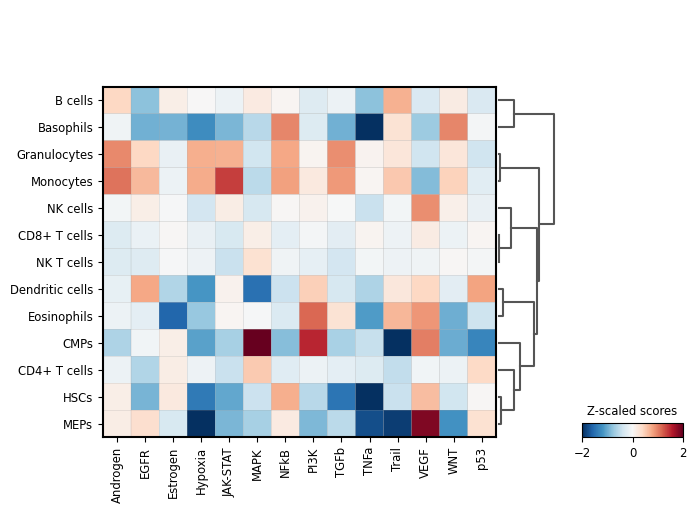

In [ ]:
dc.run_mlm(
    mat=CLLdata_D150,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)


CLLdata_D150.obsm['mlm_estimate']


#Visualization
acts = dc.get_acts(CLLdata_D150, obsm_key='mlm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

#Explore
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


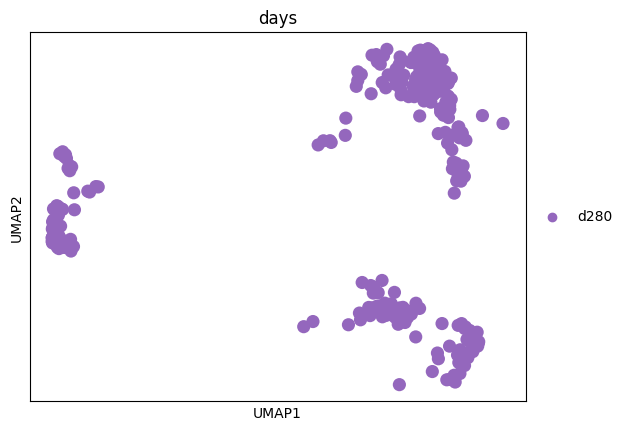

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


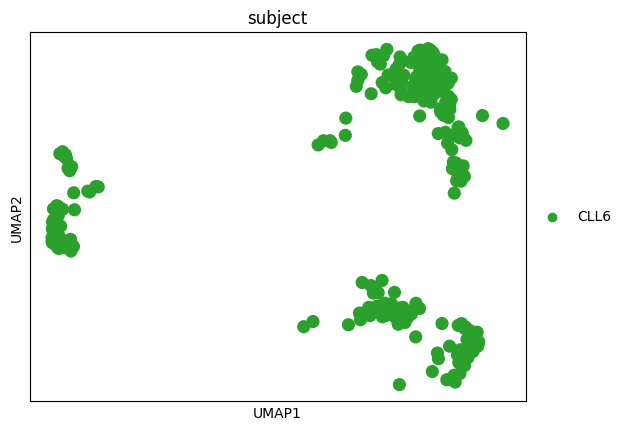

/usr/local/lib/python3.10/dist-packages/scanpy/plotting/_tools/scatterplots.py:391: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


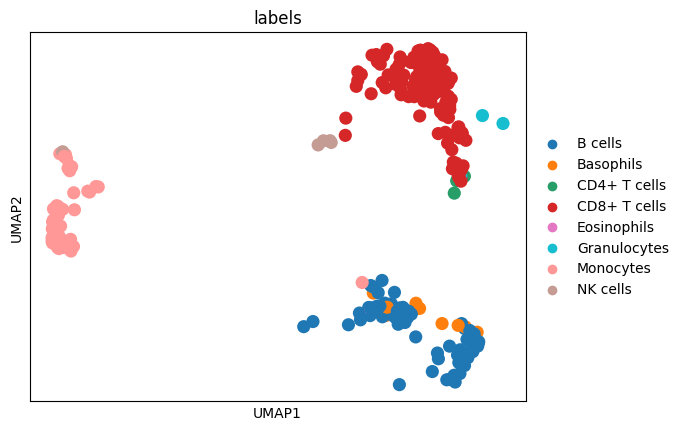

In [ ]:
#Explore 280 Post Ibrutinib mostly for a CLL case not responding to Ibrutinib wellsc.pl.umap(CLLdata_D280, color='days')
sc.pl.umap(CLLdata_D280, color='days')
sc.pl.umap(CLLdata_D280, color='subject')
sc.pl.umap(CLLdata_D280, color='labels')

6930 features of mat are empty, they will be removed.
Running ulm on mat with 334 samples and 9403 targets for 276 sources.


100%|██████████| 1/1 [00:00<00:00, 16.62it/s]
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:265: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:257: RuntimeWarning: invalid value encountered in divide
  ret = ret.dtype.type(ret / rcount)


B cells
['RFX5', 'ZHX2', 'POU2F1']
{'Basophils': ['PKNOX1', 'ZBTB33', 'E2F1'], 'CD4+ T cells': ['MYC', 'PAX6', 'POU4F2'], 'CD8+ T cells': ['REL', 'ATF3', 'JUND'], 'Eosinophils': ['AHR', 'AR', 'ARID2'], 'Granulocytes': ['TAL1', 'GATA2', 'SOX13'], 'Monocytes': ['CEBPB', 'SPI1', 'STAT1'], 'NK cells': ['RUNX1', 'BCL11A', 'STAT4']}
categories: B cells, Basophils, CD4+ T cells, etc.
var_group_labels: Basophils, CD4+ T cells, CD8+ T cells, etc.


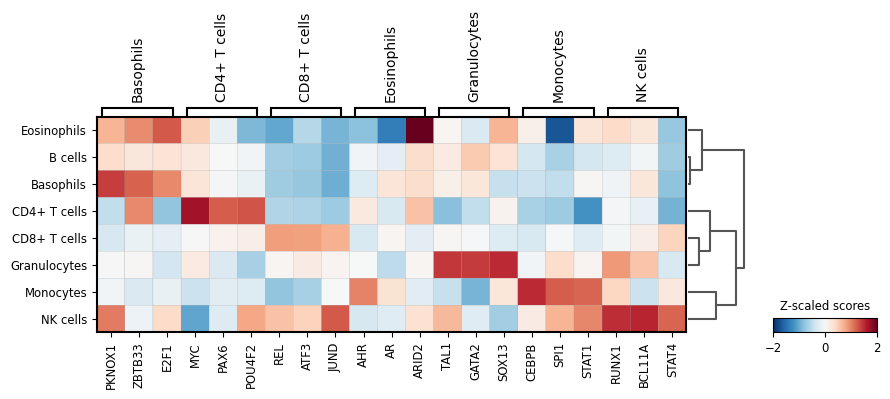

In [ ]:
dc.run_ulm(
    mat=CLLdata_D280,
    net=net,
    source='source',
    target='target',
    weight='weight',
    verbose=True
)

CLLdata_D280.obsm['ulm_estimate']



acts = dc.get_acts(CLLdata_D280, obsm_key='ulm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

df = dc.rank_sources_groups(acts, groupby='labels', reference='rest', method='t-test_overestim_var')
df



n_markers = 3
source_markers = df.groupby('group').head(n_markers).groupby('group')['names'].apply(lambda x: list(x)).to_dict()
source_markers
first_key = next(iter(source_markers))
print(first_key)
first_value = source_markers.pop(first_key)
print(first_value)
print(source_markers)


sc.pl.matrixplot(acts, source_markers, 'labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

6930 features of mat are empty, they will be removed.
Running mlm on mat with 334 samples and 9403 targets for 14 sources.


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


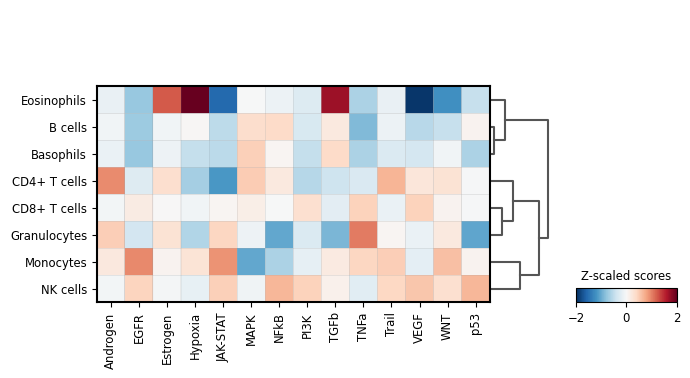

In [ ]:
# progeny = dc.get_progeny(organism='human', top=500)
# progeny

dc.run_mlm(
    mat=CLLdata_D280,
    net=progeny,
    source='source',
    target='target',
    weight='weight',
    verbose=True)


CLLdata_D280.obsm['mlm_estimate']


#Visualization
acts = dc.get_acts(CLLdata_D280, obsm_key='mlm_estimate')

# We can scale the obtained activities for better visualizations
sc.pp.scale(acts)
acts

#Explore
sc.pl.matrixplot(acts, var_names=acts.var_names, groupby='labels', dendrogram=True,
                 colorbar_title='Z-scaled scores', vmin=-2, vmax=2, cmap='RdBu_r')

To get a more in depth look at what is happening on day 280 compared to day 0, we can focus perform differential expression analysis between day 280 and day 0. We can use PseudoBulk analysis from decoupler.

In [ ]:
import scanpy as sc
import decoupler as dc

# Only needed for processing
import numpy as np
import pandas as pd

# Needed for some plotting
import matplotlib.pyplot as plt

In [ ]:
CLLdata.raw = CLLdata

In [ ]:
adata = CLLdata

In [ ]:
# Store raw counts in layers
adata.X = np.round(adata.X)
adata.layers['counts'] = adata.X

In [ ]:
# Get pseudo-bulk profile
pdata = dc.get_pseudobulk(
    adata,
    sample_col='days',
    groups_col='labels',
    layer='counts',
    mode='sum',
    min_cells=0,
    min_counts=0
)
pdata

AnnData object with n_obs × n_vars = 57 × 12280
    obs: 'orig.ident', 'dataset', 'days', 'labels', 'psbulk_n_cells', 'psbulk_counts'
    layers: 'psbulk_props'

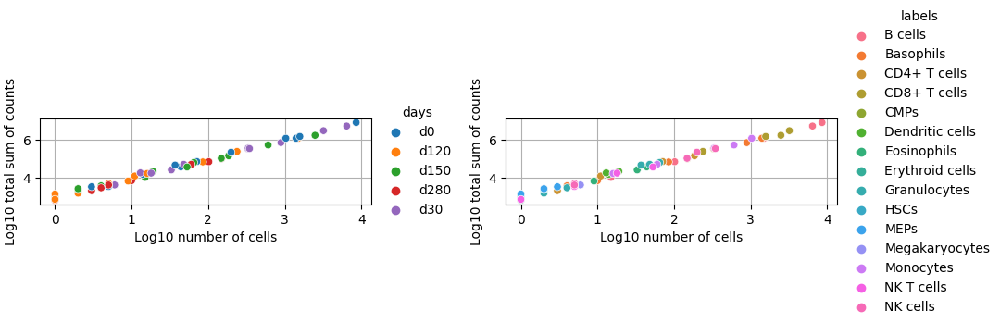

In [ ]:
dc.plot_psbulk_samples(pdata, groupby=['days', 'labels'], figsize=(11, 3))

In [ ]:
# Get filtered pseudo-bulk profile
pdata = dc.get_pseudobulk(
    adata,
    sample_col='days',
    groups_col='labels',
    layer='counts',
    mode='sum',
    min_cells=10
)
pdata

AnnData object with n_obs × n_vars = 36 × 12244
    obs: 'orig.ident', 'dataset', 'days', 'labels', 'psbulk_n_cells', 'psbulk_counts'
    layers: 'psbulk_props'

In [ ]:
# pp_pdata = pdata.copy()
# sc.pp.normalize_total(pp_pdata, target_sum=1e6)
# sc.pp.log1p(pp_pdata)
# sc.pp.scale(pp_pdata, max_value=10)
# sc.tl.pca(pp_pdata, n_comps=10)

In [ ]:
# sc.pl.pca(pp_pdata, color=['days', 'labels'], ncols=2, show=True, size=300)

In [ ]:
# dc.get_metadata_associations(
#     pp_pdata,
#     obs_keys = ['days', 'labels', 'psbulk_n_cells', 'psbulk_counts'], #metadata columns to associate to PCs
#     obsm_key='X_pca',  # where the PCs are stored
#     uns_key='pca_anova',  # where the results are stored
#     inplace=True
# )

100%|██████████| 10/10 [00:01<00:00,  6.66it/s]


In [ ]:
!pip install PyComplexHeatmap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.5/60.5 kB 1.2 MB/s eta 0:00:00


In [ ]:
# plt.figure(figsize=(7,10))
# ax, legend_axes = dc.plot_associations(
#     pp_pdata,
#     uns_key='pca_anova',  # summary statistics from the anova tests
#     obsm_key='X_pca',  # where the PCs are stored
#     stat_col='p_adj',  # which summary statistic to plot
#     obs_annotation_cols = ['days', 'labels'], # which sample annotations to plot
#     titles=['Adjusted p-values from ANOVA', 'Principle component scores']
# )
# plt.show()

In [ ]:
# Select B cell profiles
bcells = pdata[pdata.obs['labels'] == 'B cells'].copy()

In [ ]:
# dc.plot_filter_by_expr(bcells, group='days', min_count=10, min_total_count=15)

In [ ]:
# # Obtain genes that pass the thresholds
# genes = dc.filter_by_expr(bcells, group='days', min_count=10, min_total_count=15)

# # Filter by these genes
# bcells = bcells[:, genes].copy()
# bcells

In [ ]:
# Contrast between conditions
# Let's create a binary scenario and take at look on the comparison between day 0 and day 30

# bcells_0_30 = bcells[(bcells.obs["days"] == 'd0') | (bcells.obs["days"] == 'd30')]
bcells_0_280 = bcells[(bcells.obs["days"] == 'd0') | (bcells.obs["days"] == 'd280')]

In [ ]:
# bcells_0_30
bcells_0_280

View of AnnData object with n_obs × n_vars = 2 × 12244
    obs: 'orig.ident', 'dataset', 'days', 'labels', 'psbulk_n_cells', 'psbulk_counts'
    uns: 'trend_coeffs', '_squared_logres', 'prior_disp_var'
    obsm: 'design_matrix', 'size_factors'
    varm: 'non_zero', '_rough_dispersions', 'genewise_dispersions', '_genewise_converged', '_normed_means', 'fitted_dispersions', 'MAP_dispersions', '_MAP_converged', 'dispersions', '_outlier_genes', 'LFC', '_LFC_converged', 'replaced'
    layers: 'psbulk_props', 'normed_counts', '_mu_hat', '_mu_LFC', '_hat_diagonals', 'cooks'

In [ ]:
pip install pydeseq2

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 9.9 MB/s eta 0:00:00


In [ ]:
# Import DESeq2
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats

In [ ]:
# Build DESeq2 object
dds = DeseqDataSet(
    adata=bcells,
    design_factors='days',
    ref_level=['days', 'd0'],
    refit_cooks=True,
    n_cpus=8,
)

In [ ]:
# Compute LFCs
dds.deseq2()

Fitting size factors...
... done in 0.00 seconds.

/usr/local/lib/python3.10/dist-packages/pydeseq2/utils.py:980: RuntimeWarning: divide by zero encountered in divide
  ((normed_counts - y_hat) ** 2 - y_hat) / ((num_samples - num_vars) * y_hat**2)
/usr/local/lib/python3.10/dist-packages/pydeseq2/utils.py:980: RuntimeWarning: invalid value encountered in divide
  ((normed_counts - y_hat) ** 2 - y_hat) / ((num_samples - num_vars) * y_hat**2)
Fitting dispersions...
... done in 130.93 seconds.

Fitting dispersion trend curve...
... done in 8.24 seconds.

/usr/local/lib/python3.10/dist-packages/pydeseq2/dds.py:363: UserWarning: As the residual degrees of freedom is less than 3, the distribution of log dispersions is especially asymmetric and likely to be poorly estimated by the MAD.
  self.fit_dispersion_prior()
Fitting MAP dispersions...
... done in 67.88 seconds.

Fitting LFCs...
... done in 8.12 seconds.

Refitting 0 outliers.



In [ ]:
# Extract contrast between treated and control states
# stat_res = DeseqStats(dds, contrast=["days", 'd30', 'd0'], n_cpus=8)
stat_res = DeseqStats(dds, contrast=["days", 'd280', 'd0'], n_cpus=8)

In [ ]:
# Compute Wald test
stat_res.summary()

Running Wald tests...
... done in 4.90 seconds.



Log2 fold change & Wald test p-value: days d280 vs d0


,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
A1BG,64.661827,-1.372486,0.834076,-1.645516,0.099863,0.740953
A1BG-AS1,7.923392,-0.064924,2.069855,-0.031367,0.974977,NaN
A2M-AS1,0.265596,2.116760,7.299692,0.289979,0.771832,NaN
AAAS,15.199348,-4.309215,7.276135,-0.592240,0.553690,NaN
AACS,8.823946,0.868407,2.686212,0.323283,0.746481,NaN
...,...,...,...,...,...,...
ZXDC,4.828899,1.057060,3.603215,0.293366,0.769243,NaN
ZYG11B,9.924360,1.046495,2.562635,0.408367,0.683004,NaN
ZYX,10.863138,1.871506,2.400977,0.779477,0.435699,NaN
ZZEF1,12.729193,0.735137,2.323521,0.316389,0.751707,NaN


In [ ]:
# Shrink LFCs
stat_res.lfc_shrink(coeff='days_d280_vs_d0')

Fitting MAP LFCs...


Shrunk log2 fold change & Wald test p-value: days d280 vs d0


... done in 40.95 seconds.



,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
A1BG,64.661827,-0.144270,0.415138,-1.645516,0.099863,0.740953
A1BG-AS1,7.923392,-0.001192,0.323477,-0.031367,0.974977,NaN
A2M-AS1,0.265596,-0.002134,0.482552,0.289979,0.771832,NaN
AAAS,15.199348,-0.007855,0.421683,-0.592240,0.553690,NaN
AACS,8.823946,0.015529,0.278988,0.323283,0.746481,NaN
...,...,...,...,...,...,...
ZXDC,4.828899,0.010259,0.288994,0.293366,0.769243,NaN
ZYG11B,9.924360,0.019265,0.278544,0.408367,0.683004,NaN
ZYX,10.863138,0.036881,0.262056,0.779477,0.435699,NaN
ZZEF1,12.729193,0.017116,0.284793,0.316389,0.751707,NaN


In [ ]:
# Extract results
results_df = stat_res.results_df
results_df

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
A1BG,64.661827,-0.144270,0.415138,-1.645516,0.099863,0.740953
A1BG-AS1,7.923392,-0.001192,0.323477,-0.031367,0.974977,NaN
A2M-AS1,0.265596,-0.002134,0.482552,0.289979,0.771832,NaN
AAAS,15.199348,-0.007855,0.421683,-0.592240,0.553690,NaN
AACS,8.823946,0.015529,0.278988,0.323283,0.746481,NaN
...,...,...,...,...,...,...
ZXDC,4.828899,0.010259,0.288994,0.293366,0.769243,NaN
ZYG11B,9.924360,0.019265,0.278544,0.408367,0.683004,NaN
ZYX,10.863138,0.036881,0.262056,0.779477,0.435699,NaN
ZZEF1,12.729193,0.017116,0.284793,0.316389,0.751707,NaN


In [ ]:
!pip install adjustText

/usr/local/lib/python3.10/dist-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


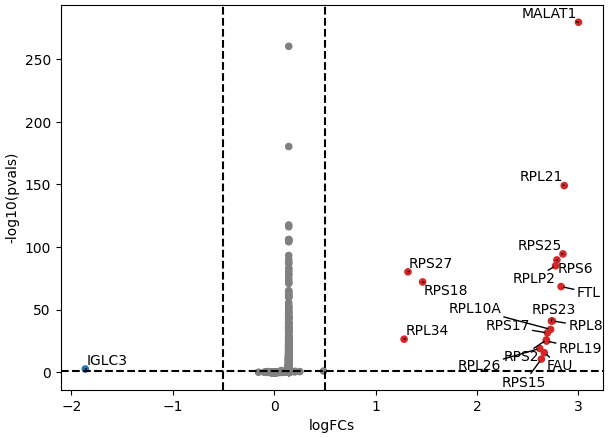

In [ ]:
# #Plotting in Volcano, day 0 vs 30
# dc.plot_volcano_df(results_df, x='log2FoldChange', y='padj', top=100)
# https://doi.org/10.5045%2Fbr.2018.53.4.320

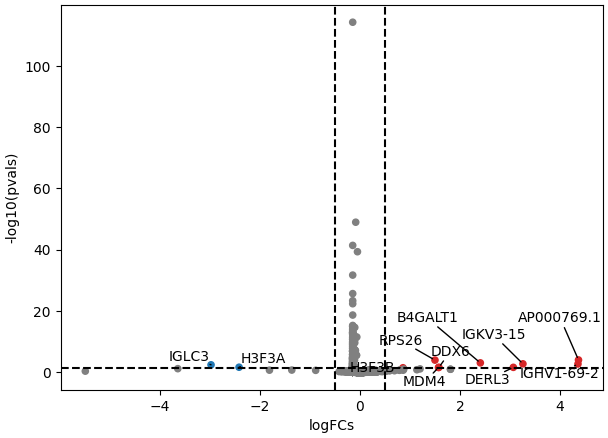

In [ ]:
# Plotting in Volcano, day 0 vs 280
dc.plot_volcano_df(results_df, x='log2FoldChange', y='padj', top=100)

In [ ]:
mat = results_df[['stat']].T.rename(index={'stat': 'B cells'})
mat

,A1BG,A1BG-AS1,A2M-AS1,AAAS,AACS,AAED1,AAGAB,AAK1,AAMDC,AAMP,...,ZUFSP,ZW10,ZWILCH,ZWINT,ZXDA,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
B cells,-1.645516,-0.031367,0.289979,-0.59224,0.323283,0.167783,-0.44313,1.996168,-0.609293,-0.573315,...,0.321789,-0.075011,0.516052,0.12277,0.052173,0.293366,0.408367,0.779477,0.316389,0.476222


In [ ]:
mat_filtered = mat.dropna(axis=1)
mat_filtered

,A1BG,A1BG-AS1,A2M-AS1,AAAS,AACS,AAED1,AAGAB,AAK1,AAMDC,AAMP,...,ZUFSP,ZW10,ZWILCH,ZWINT,ZXDA,ZXDC,ZYG11B,ZYX,ZZEF1,ZZZ3
B cells,-1.645516,-0.031367,0.289979,-0.59224,0.323283,0.167783,-0.44313,1.996168,-0.609293,-0.573315,...,0.321789,-0.075011,0.516052,0.12277,0.052173,0.293366,0.408367,0.779477,0.316389,0.476222


In [ ]:
# Retrieve CollecTRI gene regulatory network
net = dc.get_dorothea()
net

,source,confidence,target,weight
0,MYC,A,TERT,1.000000
1,FOS,A,NTS,1.000000
2,FOS,A,NTF3,1.000000
3,FOS,A,NFKB1,-1.000000
4,FOS,A,NEFL,1.000000
...,...,...,...,...
32270,LEF1,C,NKD1,0.333333
32271,LEF1,C,NETO2,0.333333
32272,LEF1,C,MYO18B,0.333333
32273,LEF1,C,PHLDB2,0.333333


In [ ]:
# Infer pathway activities with ulm
tf_acts, tf_pvals = dc.run_ulm(mat=mat_filtered , net=net)
tf_acts

,AHR,AR,ARID2,ARID3A,ARNT,ASCL1,ATF1,ATF2,ATF3,ATF4,...,ZNF217,ZNF24,ZNF263,ZNF274,ZNF384,ZNF584,ZNF592,ZNF639,ZNF644,ZNF740
B cells,1.278928,-2.778196,4.429389,0.712546,-0.078734,0.316728,1.741033,0.996203,0.634381,-1.055207,...,0.928992,0.593956,1.453515,0.823538,3.893395,0.536774,-0.017411,2.950356,2.893583,4.165196


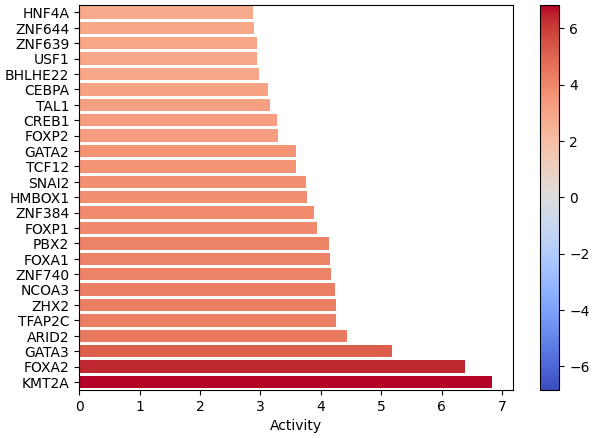

In [ ]:
# Let us plot the obtained scores for the top active/inactive transcription factors
dc.plot_barplot(tf_acts, 'B cells', top=25, vertical=True)

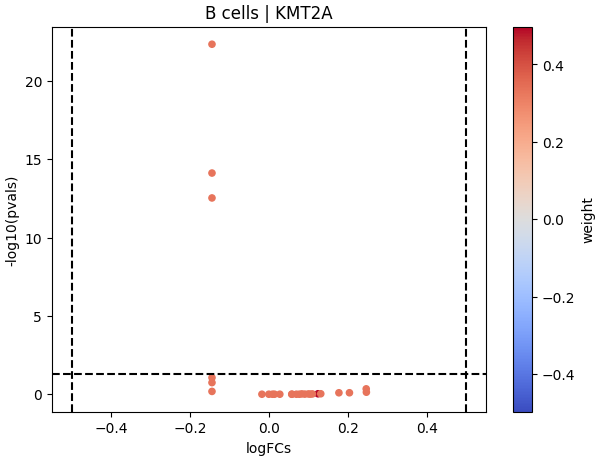

In [ ]:
# Extract logFCs and pvals
logFCs = results_df[['log2FoldChange']].T.rename(index={'log2FoldChange': 'B cells'})
pvals = results_df[['padj']].T.rename(index={'padj': 'B cells'})

# Plot
dc.plot_volcano(logFCs, pvals, 'B cells', name='KMT2A', net=net, top=10, sign_thr=0.05, lFCs_thr=0.5)

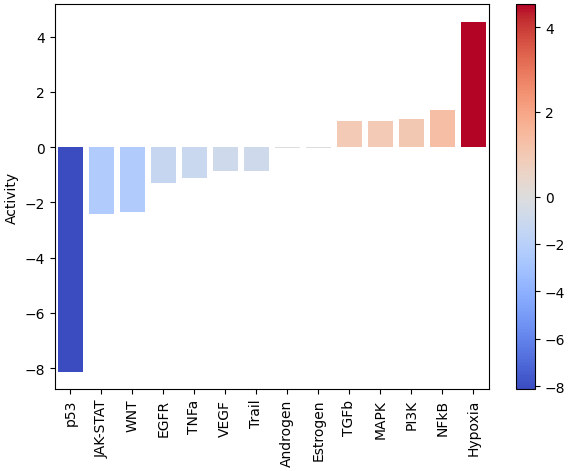

In [ ]:
# Infer pathway activities with mlm
pathway_acts, pathway_pvals = dc.run_mlm(mat=mat_filtered, net=progeny)
pathway_acts

dc.plot_barplot(pathway_acts, 'B cells', top=25, vertical=False)

***Hypoxia is key marker of aggressiveness and since we compare day 280 from day 0 it could be connected to slow Ibrutinib response (https://doi.org/10.3390/cancers13122883). On the other hand, reduction of p53 alludes to impairment of oxidative phosphorylation (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC3135642/#:~:text=10.1177/1947601911409738) which is the main narrative both from our analysis and from the authors of Rendeiro et al. 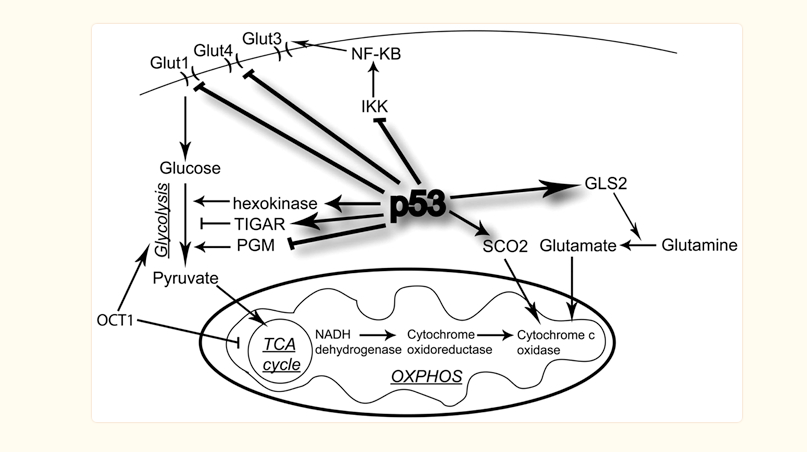***


In [ ]:
# Infer enrichment with ora using significant deg
top_genes = results_df[results_df['padj'] < 0.05]

# Run ora
enr_pvals = dc.get_ora_df(
    df=top_genes,
    net=msigdb,
    source='geneset',
    target='genesymbol'
)

enr_pvals.head()

,Term,Set size,Overlap ratio,p-value,FDR p-value,Odds ratio,Combined score,Features
0,WP_16P112_PROXIMAL_DELETION_SYNDROME,75,0.026667,0.117419,0.363526,4.242989,9.088494,EZR;NR3C1
1,WP_22Q112_COPY_NUMBER_VARIATION_SYNDROME,120,0.008333,0.612699,0.653969,1.581311,0.774655,CDC42
2,WP_2Q37_COPY_NUMBER_VARIATION_SYNDROME,137,0.014599,0.292164,0.435567,2.322537,2.857741,CXCR4;RPS6
3,WP_7Q1123_COPY_NUMBER_VARIATION_SYNDROME,104,0.009615,0.560337,0.610738,1.824893,1.057008,BRD4
4,WP_ACUTE_VIRAL_MYOCARDITIS,85,0.023529,0.143802,0.374957,3.744852,7.262451,CXCR4;RAC2


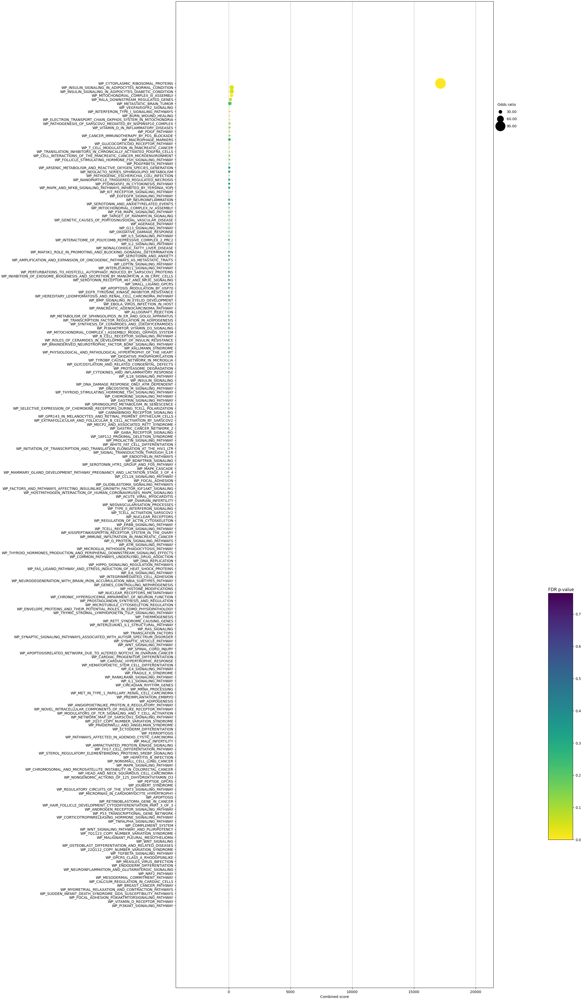

In [ ]:
dc.plot_dotplot(enr_pvals, x='Combined score', y = 'Term', s='Odds ratio', c = 'FDR p-value', scale = 0.05, figsize=(20,50))

***Oxidative Phosphorylation emerges again as an important pathway during Ibrutinib treatment***

# **3. PertPy toolkit for AugurPy, scGEN and Mixscape**

*PertPy* represents a core inspiration for **PertFlow** since it provides access to python iterations of Augur, Mixscape (otherwise also available in R) and for scGEN. The user is encouraged to deploy other PertPy tools in the PertFlow architecture for more nuanced results (https://pertpy.readthedocs.io/en/latest/).

In [ ]:
!pip install pertpy

In [ ]:
pip install lightning==2.0.1 # https://stackoverflow.com/questions/76647518/how-to-fix-error-cannot-import-name-modelmetaclass-from-pydantic-main

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 8.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.5/55.5 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 18.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.3/64.3 kB 7.7 MB/s eta 0:00:00
  Attempting uninstall: pydantic
    Found existing installation: pydantic 2.1.1
    Uninstalling pydantic-2.1.1:
      Successfully uninstalled pydantic-2.1.1
  Attempting uninstall: starlette
    Found existing installation: starlette 0.27.0
    Uninstalling starlette-0.27.0:
      Successfully uninstalled starlette-0.27.0
  Attempting uninstall: croniter
    Found existing installation: croniter 1.4.1
    Uninstalling croniter-1.4.1:
      Successfully uninstalled croniter-1.4.1
  Attempting uninstall: fastapi
    Found existing installation: fastapi 0.103.1
    Uninstalling fastapi-0.103.1:
      Successfully uninstalled fastapi-0.103.1
  Attempting uninstall: lightning


In [ ]:
pip install flax==0.7.0 # https://pypi.org/project/flax/#history

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 225.9/225.9 kB 1.8 MB/s eta 0:00:00
  Attempting uninstall: flax
    Found existing installation: flax 0.7.2
    Uninstalling flax-0.7.2:
      Successfully uninstalled flax-0.7.2


In [ ]:
import pertpy as pt

/usr/local/lib/python3.10/dist-packages/scvi/_settings.py:63: UserWarning: Since v1.0.0, scvi-tools no longer uses a random seed by default. Run `scvi.settings.seed = 0` to reproduce results from previous versions.
/usr/local/lib/python3.10/dist-packages/scvi/_settings.py:70: UserWarning: Setting `dl_pin_memory_gpu_training` is deprecated in v1.0 and will be removed in v1.1. Please pass in `pin_memory` to the data loaders instead.


To use sccoda or tasccoda please install ete3 with pip install ete3

**3.1 AugurPy for cell-type prioritization**

Augur's objective (https://doi.org/10.1038/s41587-020-0605-1) is to rank or prioritize cell types based on their responses to experimental perturbations using high-dimensional single-cell sequencing data. It achieves this by assessing how effectively cells with strong reactions to perturbations can be distinguished from those with weak reactions in terms of molecular measurements. This separation ability is determined by the predictive accuracy of experimental labels (e.g., treatment vs. control) within each cell type. Augur trains machine learning models for each cell type through cross-validation, prioritizing cell types based on metric scores that gauge the model's accuracy. Categorical data uses the default area under the curve metric, while numerical data employs the concordance correlation coefficient as an approximation of perturbation response accuracy.

A tutorial illustrates Augur's usage with a simulated dataset containing 600 cells across three populations (cell types A, B, and C). These cell types are evenly split between treatment and control conditions, with varying proportions of differentially expressed genes in response to treatment: around 5% for cell type A, 25% for cell type B, and 50% for cell type C.
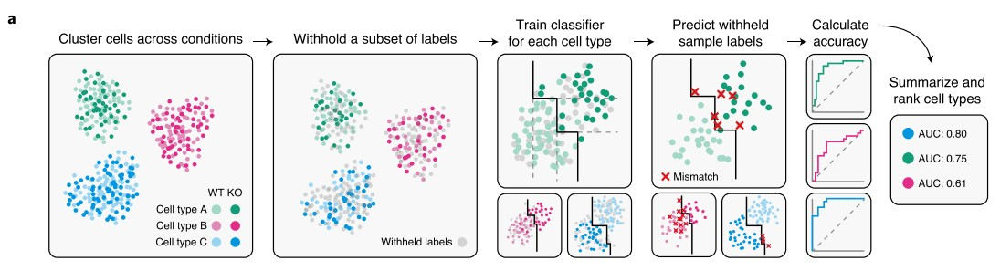

Our goal here is to investigate which CLL PBMCs are experiencing the biggest perturbation effect due to Ibrutinib, at the various time points. Feature selection will also give us some informed insights into which markers play a crucial role and hence could allude to relevant signaling cascades.

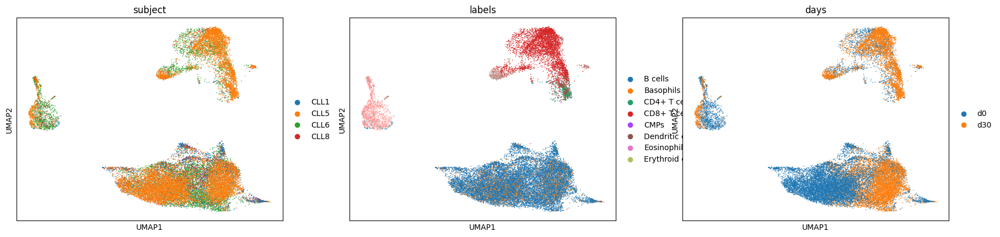

In [ ]:
#Subset to Day 0 and 30 only
CLLdata_D0_30 = CLLdata[(CLLdata.obs["days"].isin(["d30", "d0"]))]

sc.pl.umap(CLLdata_D0_30, color=['subject', 'labels', 'days'])

In [ ]:
# adata.obs.cell_type.value_counts()
CLLdata_D0_30.obs.labels.value_counts()

B cells            14976
CD8+ T cells        4773
Basophils           2293
Monocytes           1366
NK cells             545
CD4+ T cells         400
Granulocytes          85
Eosinophils           77
Dendritic cells       27
NK T cells            23
Megakaryocytes         6
CMPs                   3
MEPs                   3
Erythroid cells        1
HSCs                   1
Name: labels, dtype: int64

In [ ]:
augurdata = CLLdata_D0_30[(CLLdata_D0_30.obs["labels"].isin(["B cells", "CD8+ T cells", "Basophils", "Monocytes", "NK cells", "CD4+ T cells", "Granulocytes", "Eosinophils", "Dendritic cells", "NK T cells"]))]

In [ ]:
augurdata.obs.labels.value_counts()

B cells            14976
CD8+ T cells        4773
Basophils           2293
Monocytes           1366
NK cells             545
CD4+ T cells         400
Granulocytes          85
Eosinophils           77
Dendritic cells       27
NK T cells            23
Name: labels, dtype: int64

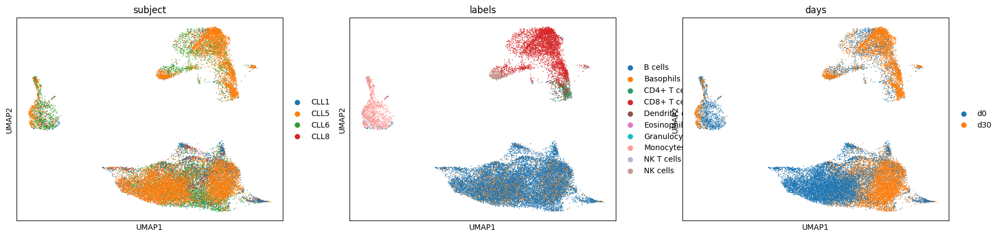

In [ ]:
sc.pl.umap(augurdata, color=['subject', 'labels', 'days'])

In [ ]:
ag_rfc = pt.tl.Augur("random_forest_classifier")

In [ ]:
loaded_data = ag_rfc.load(augurdata, label_col="days", cell_type_col="labels")
loaded_data

AnnData object with n_obs × n_vars = 24565 × 16333
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'label', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'cell_type', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2', 'y_'
    uns: 'days_colors', 'labels_colors', 'subject_colors'
    obsm: 'X_pca', 'X_umap'

In [ ]:
v_adata, v_results = ag_rfc.predict(
    loaded_data, subsample_size=20, n_threads=4, select_variance_features=True, span=1
)

v_results["summary_metrics"]

Set smaller span value in the case of a `segmentation fault` error.

Set larger span in case of svddc or other near singularities error.

Output()

Skipping Dendritic cells cell type - 27 samples is less than min_cells 50.

Skipping NK T cells cell type - 23 samples is less than min_cells 50.

,B cells,CD8+ T cells,Monocytes,CD4+ T cells,NK cells,Basophils,Granulocytes,Eosinophils
mean_augur_score,0.669785,0.649422,0.792687,0.612109,0.717177,0.665397,0.678662,0.585907
mean_auc,0.669785,0.649422,0.792687,0.612109,0.717177,0.665397,0.678662,0.585907
mean_accuracy,0.589267,0.580000,0.685788,0.555897,0.619011,0.600147,0.580293,0.540916
mean_precision,0.584198,0.585985,0.699136,0.554805,0.604539,0.614658,0.565969,0.548471
mean_f1,0.634881,0.622877,0.693981,0.457386,0.677819,0.590988,0.661161,0.451005
mean_recall,0.754762,0.735238,0.747619,0.457143,0.836508,0.631270,0.844127,0.456667


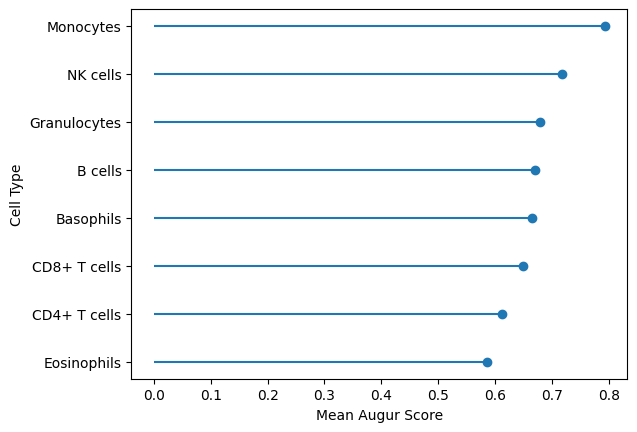

In [ ]:
lollipop = pt.pl.ag.lollipop(v_results)

In [ ]:
# sc.pp.neighbors(v_adata)
# sc.tl.umap(v_adata)

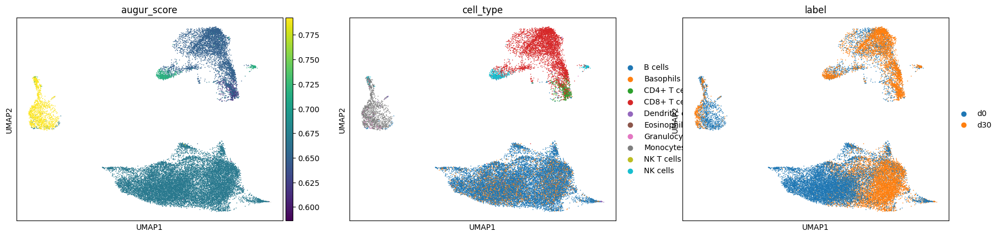

In [ ]:
sc.pl.umap(adata=v_adata, color=["augur_score", "cell_type", "label"])

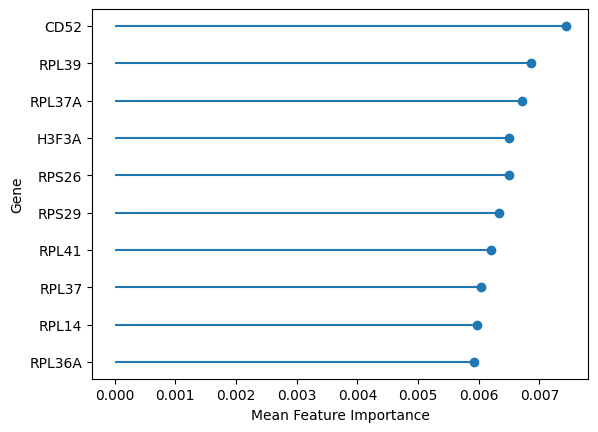

In [ ]:
important_features = pt.pl.ag.important_features(v_results)

In [ ]:
#Subset to Day 0 and 120 only
CLLdata_D0_120 = CLLdata[(CLLdata.obs["days"].isin(["d120", "d0"]))]

In [ ]:
augurdata = CLLdata_D0_120[(CLLdata_D0_120.obs["labels"].isin(["B cells", "CD8+ T cells", "Basophils", "Monocytes", "NK cells", "CD4+ T cells", "Granulocytes", "Eosinophils"]))]

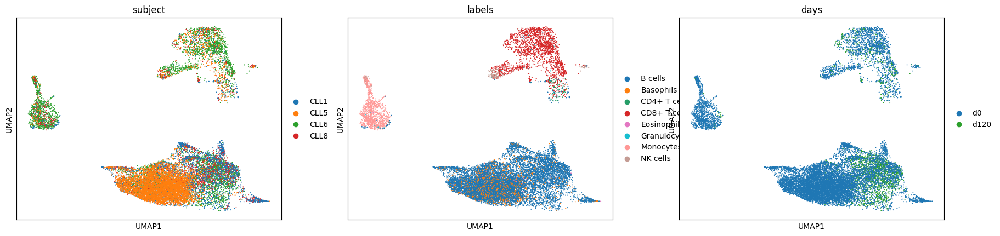

In [ ]:
sc.pl.umap(augurdata, color=['subject', 'labels', 'days'])

In [ ]:
augurdata = CLLdata_D0_120[(CLLdata_D0_120.obs["labels"].isin(["B cells", "CD8+ T cells", "Basophils", "Monocytes", "NK cells", "CD4+ T cells", "Granulocytes", "Eosinophils", "Dendritic cells", "NK T cells"]))]

In [ ]:
loaded_data = ag_rfc.load(augurdata, label_col="days", cell_type_col="labels")
loaded_data

AnnData object with n_obs × n_vars = 14804 × 16333
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'label', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'cell_type', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2', 'y_'
    uns: 'days_colors', 'labels_colors', 'subject_colors'
    obsm: 'X_pca', 'X_umap'

In [ ]:
v_adata, v_results = ag_rfc.predict(
    loaded_data, subsample_size=20, n_threads=4, select_variance_features=True, span=1
)

v_results["summary_metrics"]

Set smaller span value in the case of a `segmentation fault` error.

Set larger span in case of svddc or other near singularities error.

Output()

Skipping CD4+ T cells cell type - the number of samples for at least one class type is less than subsample size 20.

Skipping NK cells cell type - the number of samples for at least one class type is less than subsample size 20.

Skipping Dendritic cells cell type - 14 samples is less than min_cells 50.

Skipping Granulocytes cell type - 39 samples is less than min_cells 50.

Skipping Eosinophils cell type - the number of samples for at least one class type is less than subsample size 20.

Skipping NK T cells cell type - 6 samples is less than min_cells 50.

,B cells,CD8+ T cells,Basophils
mean_augur_score,0.798583,0.580624,0.868197
mean_auc,0.798583,0.580624,0.868197
mean_accuracy,0.690916,0.549121,0.693553
mean_precision,0.705639,0.570560,0.804259
mean_f1,0.691251,0.402723,0.559623
mean_recall,0.738254,0.372540,0.475556


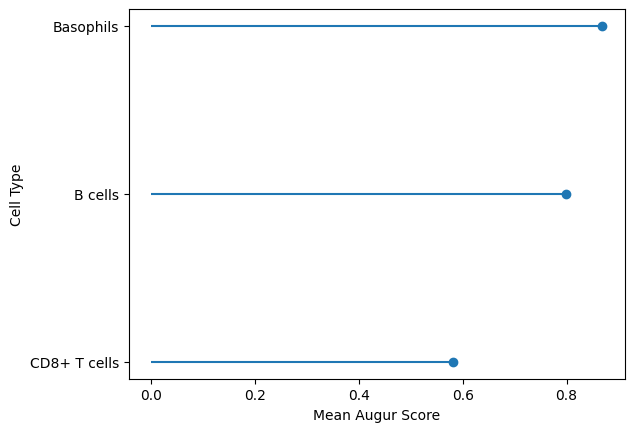

In [ ]:
lollipop = pt.pl.ag.lollipop(v_results)

In [ ]:
sc.pp.neighbors(v_adata)
sc.tl.umap(v_adata)

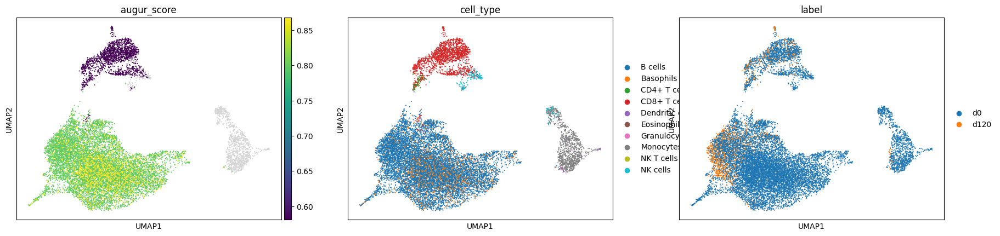

In [ ]:
sc.pl.umap(adata=v_adata, color=["augur_score", "cell_type", "label"])

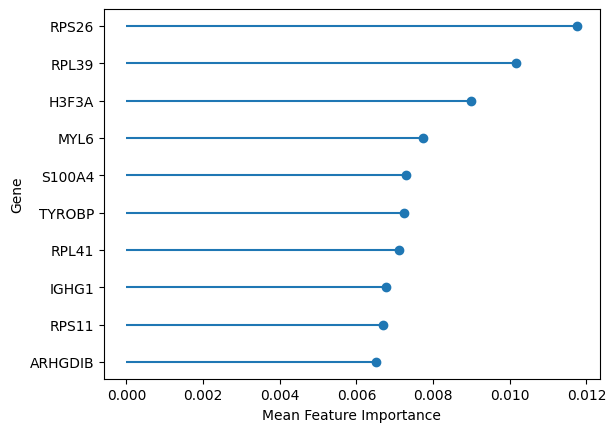

In [ ]:
important_features = pt.pl.ag.important_features(v_results)

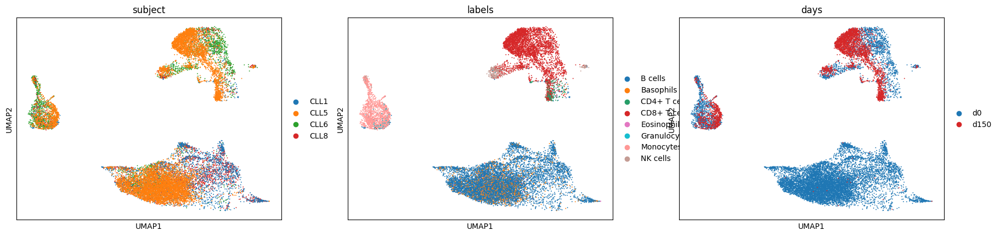

In [ ]:
#Subsetting more..
CLLdata_D0_150 = CLLdata[(CLLdata.obs["days"].isin(["d150", "d0"]))]
augurdata = CLLdata_D0_150[(CLLdata_D0_150.obs["labels"].isin(["B cells", "CD8+ T cells", "Basophils", "Monocytes", "NK cells", "CD4+ T cells", "Granulocytes", "Eosinophils"]))]
sc.pl.umap(augurdata, color=['subject', 'labels', 'days'])

In [ ]:
loaded_data = ag_rfc.load(augurdata, label_col="days", cell_type_col="labels")
loaded_data

AnnData object with n_obs × n_vars = 16417 × 16333
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'label', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'cell_type', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2', 'y_'
    uns: 'days_colors', 'labels_colors', 'subject_colors'
    obsm: 'X_pca', 'X_umap'

In [ ]:
v_adata, v_results = ag_rfc.predict(
    loaded_data, subsample_size=10, n_threads=4, select_variance_features=True, span=1
)

v_results["summary_metrics"]

Set smaller span value in the case of a `segmentation fault` error.

Set larger span in case of svddc or other near singularities error.

Output()

Skipping Basophils cell type - the number of samples for at least one class type is less than subsample size 10.

Skipping Eosinophils cell type - 45 samples is less than min_cells 50.

,B cells,CD8+ T cells,Monocytes,CD4+ T cells,NK cells,Granulocytes
mean_augur_score,0.819907,0.778889,0.899537,0.717963,0.778981,0.772315
mean_auc,0.819907,0.778889,0.899537,0.717963,0.778981,0.772315
mean_accuracy,0.629365,0.558413,0.646508,0.539683,0.536349,0.553333
mean_precision,0.613317,0.546190,0.629762,0.532667,0.524698,0.549143
mean_f1,0.717750,0.684497,0.737041,0.673824,0.674323,0.681741
mean_recall,0.929444,0.962778,0.960000,0.962222,0.973889,0.953889


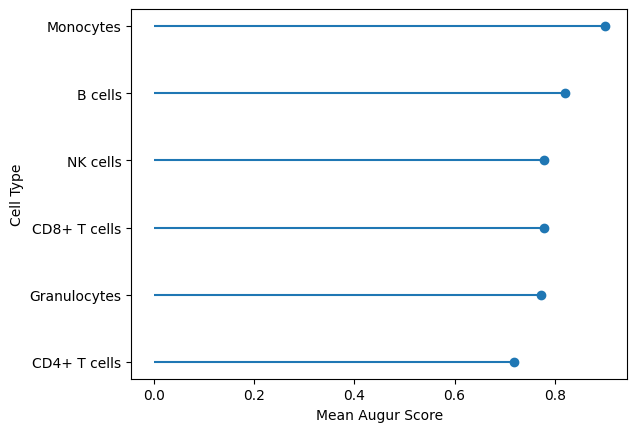

In [ ]:
lollipop = pt.pl.ag.lollipop(v_results)

In [ ]:
sc.pp.neighbors(v_adata)
sc.tl.umap(v_adata)

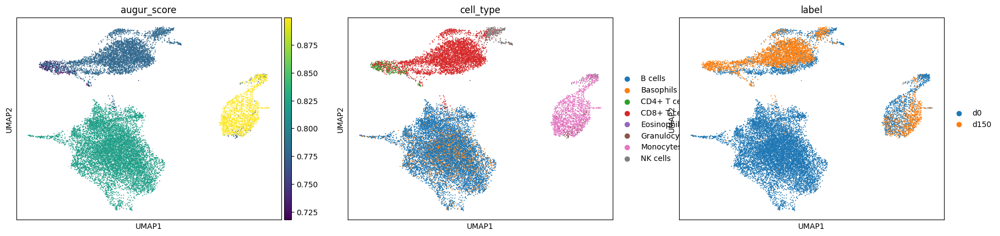

In [ ]:
sc.pl.umap(adata=v_adata, color=["augur_score", "cell_type", "label"])

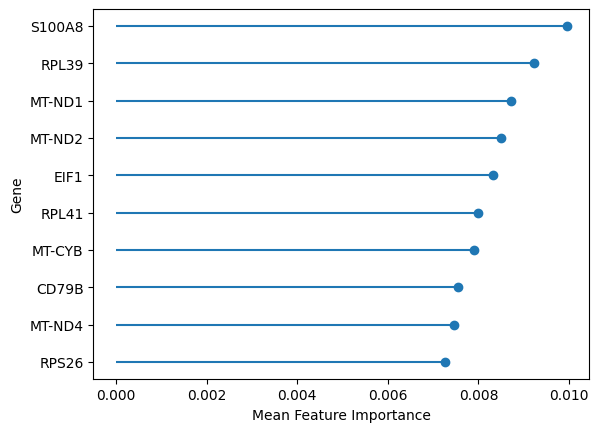

In [ ]:
important_features = pt.pl.ag.important_features(v_results)

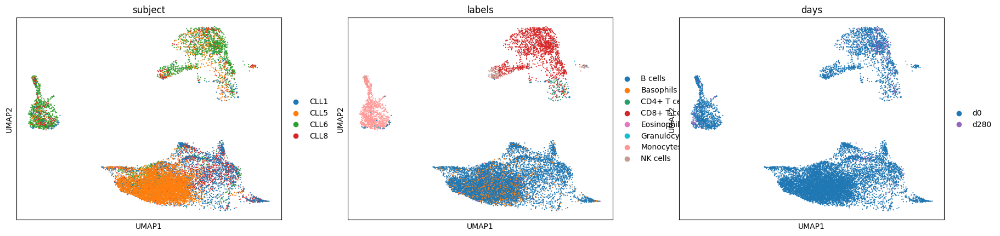

In [ ]:
#Subsetting more..
CLLdata_D0_280 = CLLdata[(CLLdata.obs["days"].isin(["d280", "d0"]))]
augurdata = CLLdata_D0_280[(CLLdata_D0_280.obs["labels"].isin(["B cells", "CD8+ T cells", "Basophils", "Monocytes", "NK cells", "CD4+ T cells", "Granulocytes", "Eosinophils"]))]
sc.pl.umap(augurdata, color=['subject', 'labels', 'days'])

In [ ]:
augurdata = CLLdata_D0_280[(CLLdata_D0_280.obs["labels"].isin(["B cells", "CD8+ T cells", "Basophils", "Monocytes", "NK cells", "CD4+ T cells", "Granulocytes", "Eosinophils", "Dendritic cells", "NK T cells"]))]

In [ ]:
loaded_data = ag_rfc.load(augurdata, label_col="days", cell_type_col="labels")
loaded_data

AnnData object with n_obs × n_vars = 13263 × 16333
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'dataset', 'barcode', 'subject', 'label', 'mitoPercent', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.7', 'seurat_clusters', 'integrated_snn_res.0.3', 'cell_type', 'integrated_snn_res.0.5', 'UMAP_1', 'UMAP_2', 'y_'
    uns: 'days_colors', 'labels_colors', 'subject_colors'
    obsm: 'X_pca', 'X_umap'

In [ ]:
v_adata, v_results = ag_rfc.predict(
    loaded_data, subsample_size=10, n_threads=4, select_variance_features=True, span=1
)

v_results["summary_metrics"]

Set smaller span value in the case of a `segmentation fault` error.

Set larger span in case of svddc or other near singularities error.

Output()

Skipping CD4+ T cells cell type - the number of samples for at least one class type is less than subsample size 10.

Skipping NK cells cell type - the number of samples for at least one class type is less than subsample size 10.

Skipping Dendritic cells cell type - 14 samples is less than min_cells 50.

Skipping Granulocytes cell type - 41 samples is less than min_cells 50.

Skipping Eosinophils cell type - 45 samples is less than min_cells 50.

Skipping NK T cells cell type - 5 samples is less than min_cells 50.

,B cells,CD8+ T cells,Monocytes,Basophils
mean_augur_score,0.939074,0.857130,0.814815,0.934167
mean_auc,0.939074,0.857130,0.814815,0.934167
mean_accuracy,0.794603,0.671270,0.647778,0.769683
mean_precision,0.798127,0.655952,0.643873,0.816111
mean_f1,0.802598,0.721012,0.662695,0.688185
mean_recall,0.873889,0.884444,0.782778,0.656111


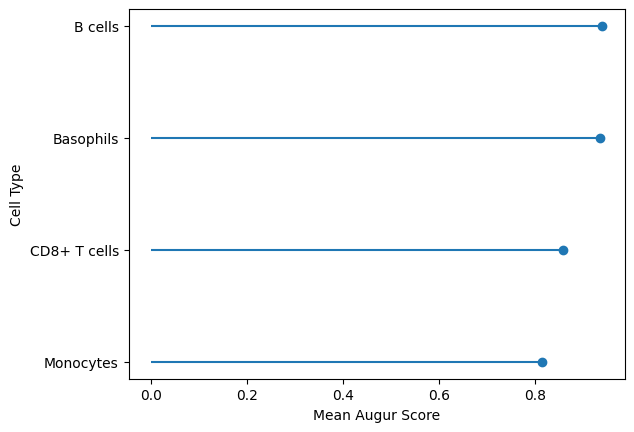

In [ ]:
lollipop = pt.pl.ag.lollipop(v_results)

In [ ]:
sc.pp.neighbors(v_adata)
sc.tl.umap(v_adata)

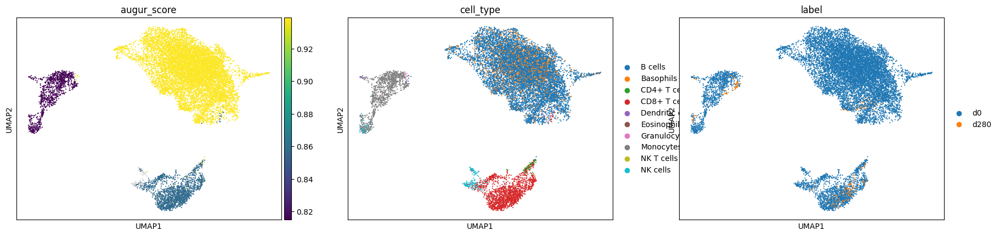

In [ ]:
sc.pl.umap(adata=v_adata, color=["augur_score", "cell_type", "label"])

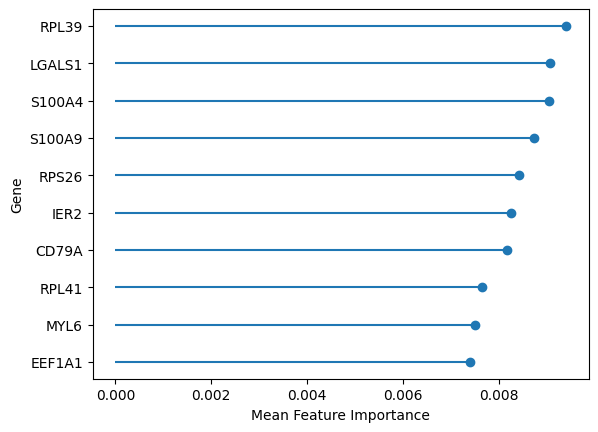

In [ ]:
important_features = pt.pl.ag.important_features(v_results)

***We observe that monocytes apart from B cells are experiencing strong perturbational effects due to Ibrutinib, a finding that is in line with the literature and merits further investigation (https://doi.org/10.18632%2Foncotarget.26744). Futhermore, based on Feature Ranking, we notice that for the 280 days Post Ibrutinib, the galectin LGALS1 plays an important role in distinguishing Post-therapy sample which does not respond well to treatment, which is in line with recently published data (https://doi.org/10.5114%2Fceji.2021.105246).***

**2.3 Mixscape - analysis of single-cell pooled CRSIPR screen**

In [ ]:
# https://pertpy.readthedocs.io/en/latest/tutorials/notebooks/mixscape.html

This vignette reproduces the Mixscape https://satijalab.org/seurat/articles/mixscape_vignette.html .


Mixscape leverages CRISPR-compatible (EC)CITE-seq, a technology that combines pooled CRISPR screens with single-cell mRNA and surface protein measurements, to explore the molecular networks that regulate signaling pathways of interest. Mixscape improves the signal-to-noise ratio in single-cell perturbation screens by identifying and removing confounding sources of variation.

***Mixscape can reveal the perturbational landscape after molecular knockdowns, hence an assessment can be made whether a particular target is "druggable" for a specific disease context.***


Reference: Papalexi, E., Mimitou, E.P., Butler, A.W. et al. Characterizing the molecular regulation of inhibitory immune checkpoints with multimodal single-cell screens. Nat Genet 53, 322–331 (2021). https://doi.org/10.1038/s41588-021-00778-2



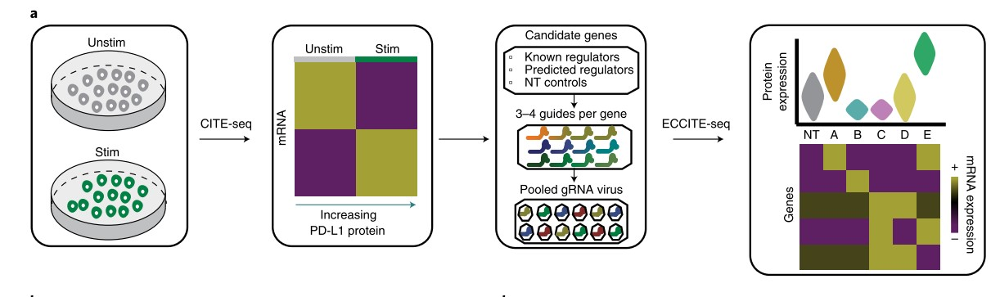

In [ ]:
import muon as mu
import pandas as pd

2.3.1 Getting the dataset

Download a 111 gRNA ECCITE-seq dataset generated from stimulated THP-1 cells that was published in bioRxiv https://www.biorxiv.org/content/10.1101/2020.06.28.175596v1

In [ ]:
mdata = pt.dt.papalexi_2021()

Downloading... ━━━━━━━━━━━━━━╺━━━━━━━━━━━━━━━━━━━━━━━━━  36% 0:00:29

Downloading... ━━━━━━━━━━━━━━━━━━━━━━━━━━╺━━━━━━━━━━━━━  66% 0:00:16

In [ ]:
mdata

MuData object with n_obs × n_vars = 20729 × 18776
  4 modalities
    rna:	20729 x 18649
      obs:	'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_GDO', 'nCount_ADT', 'nFeature_ADT', 'percent.mito', 'MULTI_ID', 'HTO_classification', 'guide_ID', 'gene_target', 'NT', 'perturbation', 'replicate', 'S.Score', 'G2M.Score', 'Phase'
      var:	'name'
    adt:	20729 x 4
      obs:	'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_GDO', 'nCount_ADT', 'nFeature_ADT', 'percent.mito', 'MULTI_ID', 'HTO_classification', 'guide_ID', 'gene_target', 'NT', 'perturbation', 'replicate', 'S.Score', 'G2M.Score', 'Phase'
      var:	'name'
    hto:	20729 x 12
      obs:	'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_GDO', 'nCount_ADT', 'nFeature_ADT', 'percent.mito', 'MULTI_ID', 'HTO_classification', 'guide_ID', 'gene_target', 'NT', 'perturbation', 'replicate', 'S.Score', 'G2M.Score', 'Phase'
      var:	'name'
    gdo:	20729 x 111
      obs:	'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_HTO', 'nFeature_HTO', 'nCount_GDO', 'nCount_ADT', 'nFeature_ADT', 'percent.mito', 'MULTI_ID', 'HTO_classification', 'guide_ID', 'gene_target', 'NT', 'perturbation', 'replicate', 'S.Score', 'G2M.Score', 'Phase'
      var:	'name'

In [ ]:
#  non-perturbed (NP) cells
#  cells expressing non-targeting gRNAs (NT)

2.3.2 Pre-processing

In [ ]:
# Preprocessing - RNA layer
mdata["rna"]
sc.pp.normalize_total(mdata['rna'])
sc.pp.log1p(mdata['rna'])
sc.pp.highly_variable_genes(mdata['rna'], subset=True)

In [ ]:
# Preprocessing - Protein layer
mdata["adt"]
mu.prot.pp.clr(mdata["adt"])

2.3.3 RNA-based clustering is driven by confounding sources of variation

Cluster cells based on their gene expression profiles. We expect perturbation-specific clusters, but as we can see, from the UMAP plots, the clustering is primarily driven by cell cycle phase and replicate ID.

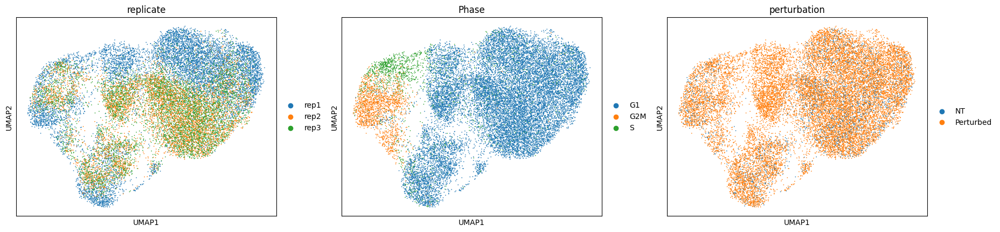

In [ ]:
# RNA-based clustering is driven by confounding sources of variation
sc.pp.pca(mdata["rna"])
sc.pp.neighbors(mdata['rna'], metric='cosine')
sc.tl.umap(mdata["rna"])
sc.pl.umap(mdata["rna"], color=["replicate", "Phase", "perturbation"])

2.3.4 Calculating local perturbation signatures mitigates confounding effects

Calculate perturbation signature. For each cell, we identify n_neighbors cells from the control pool with the most similar mRNA expression profiles. The perturbation signature is calculated by subtracting the averaged mRNA expression profile of the control neighbors from the mRNA expression profile of each cell.

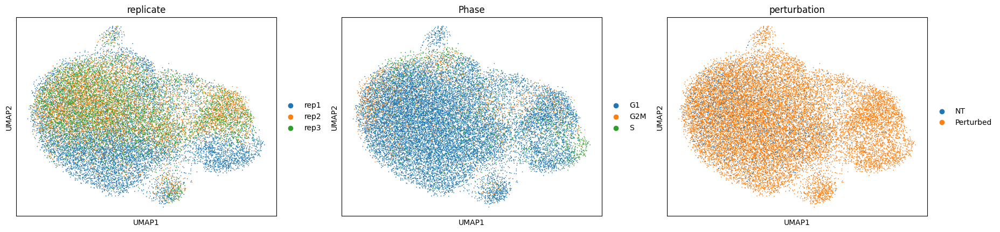

In [ ]:
# Calculating local perturbation signatures mitigates confounding effects
mixscape_identifier = pt.tl.Mixscape()
mixscape_identifier.perturbation_signature(mdata['rna'], 'perturbation', 'NT', 'replicate')

adata_pert = mdata['rna'].copy()

adata_pert.X = adata_pert.layers['X_pert']

sc.pp.pca(adata_pert)
sc.pp.neighbors(adata_pert, metric='cosine')
sc.tl.umap(adata_pert)
sc.pl.umap(adata_pert, color=['replicate', 'Phase', 'perturbation'])

2.3.5 Mixscape identifies cells with no detectable perturbation

Identify perturbed and non-perturbed gRNA expressing cells that accounts for multiple perturbations.

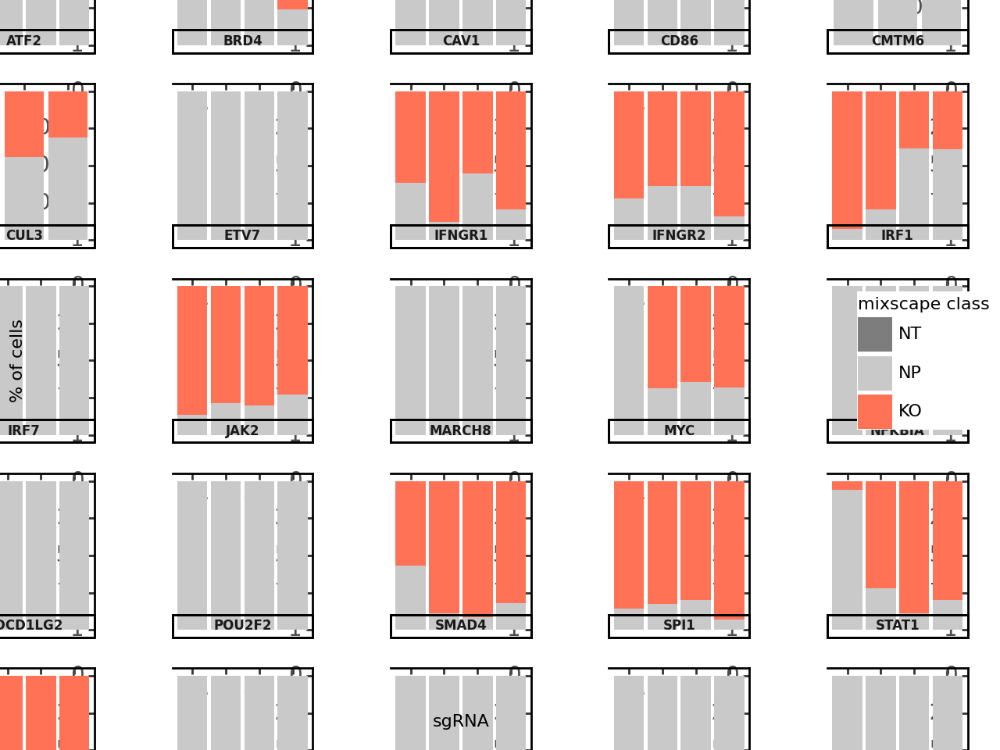

<Figure Size: (640 x 480)>

In [ ]:
# Mixscape identifies cells with no detectable perturbation
mixscape_identifier.mixscape(adata = mdata['rna'], control = 'NT', labels='gene_target', layer='X_pert')

pt.pl.ms.barplot(mdata['rna'], guide_rna_column='NT', axis_text_x_size=12, axis_text_y_size=10)

2.3.6 Inspecting mixscape results

Explore the perturbation scores of cells.

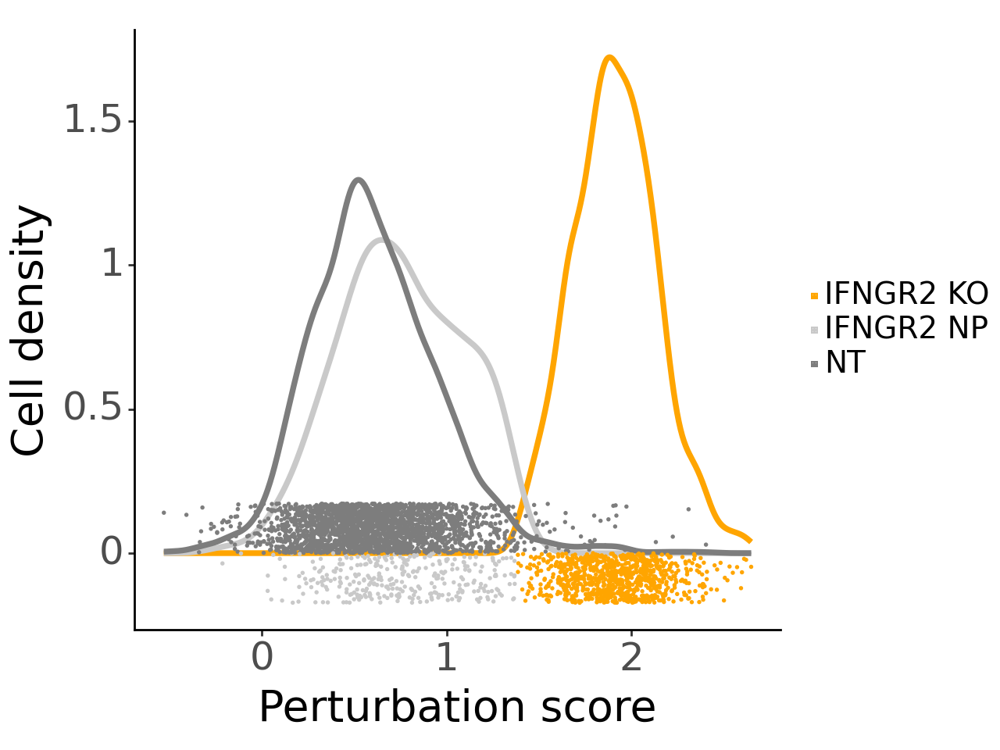

<Figure Size: (640 x 480)>

In [ ]:
# Inspecting mixscape results
pt.pl.ms.perturbscore(adata = mdata['rna'], labels='gene_target', target_gene='IFNGR2', color = 'orange')

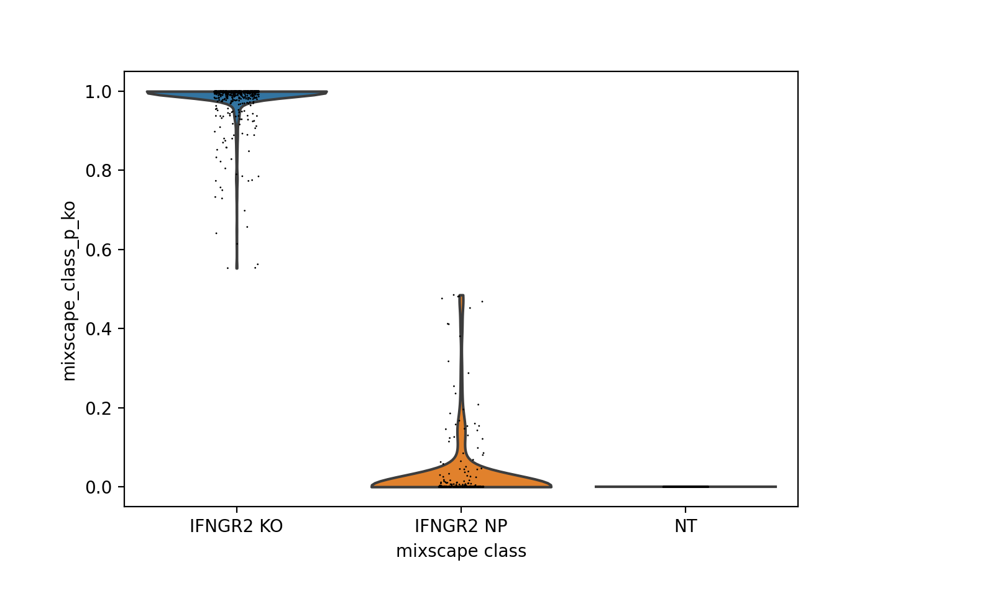

In [ ]:
pt.pl.ms.violin(adata = mdata['rna'], target_gene_idents=['NT', 'IFNGR2 NP', 'IFNGR2 KO'], groupby='mixscape_class')

categories: IFNGR2 KO, IFNGR2 NP, NT
var_group_labels: NT


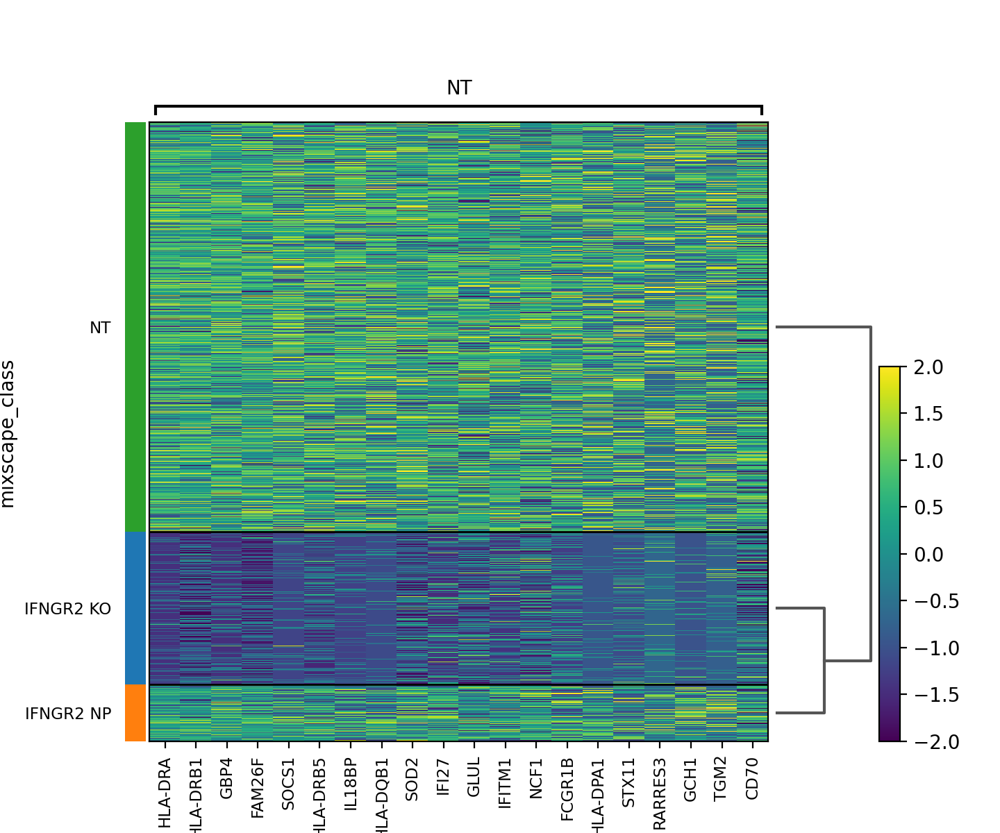

In [ ]:
pt.pl.ms.heatmap(adata = mdata['rna'], labels='gene_target', target_gene='IFNGR2', layer='X_pert', control='NT')

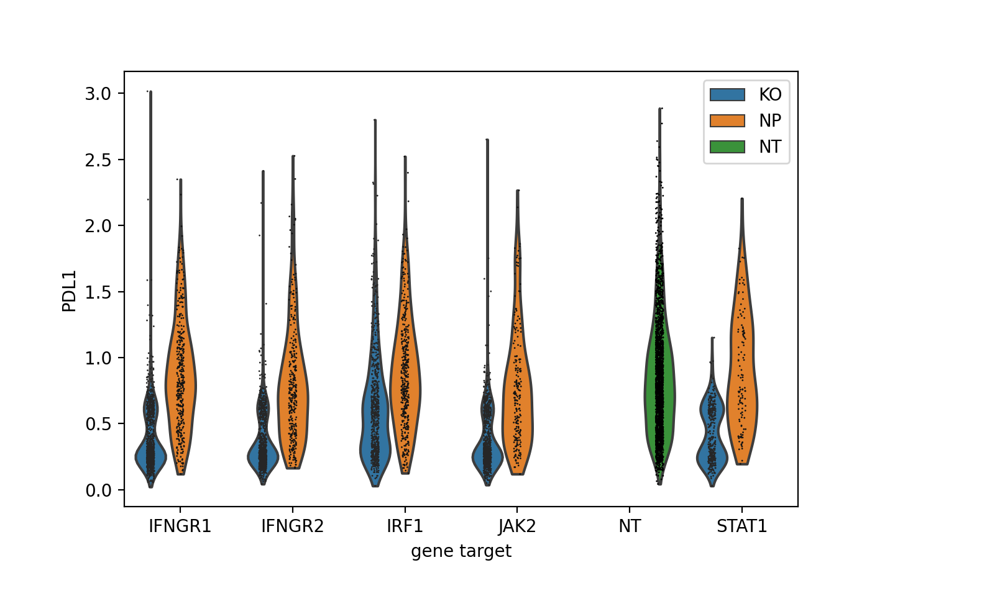

In [ ]:
mdata['adt'].obs['mixscape_class_global'] = mdata['rna'].obs['mixscape_class_global']
pt.pl.ms.violin(adata = mdata['adt'], target_gene_idents=["NT","JAK2","STAT1","IFNGR1","IFNGR2", "IRF1"], keys='PDL1', groupby='gene_target', hue='mixscape_class_global')

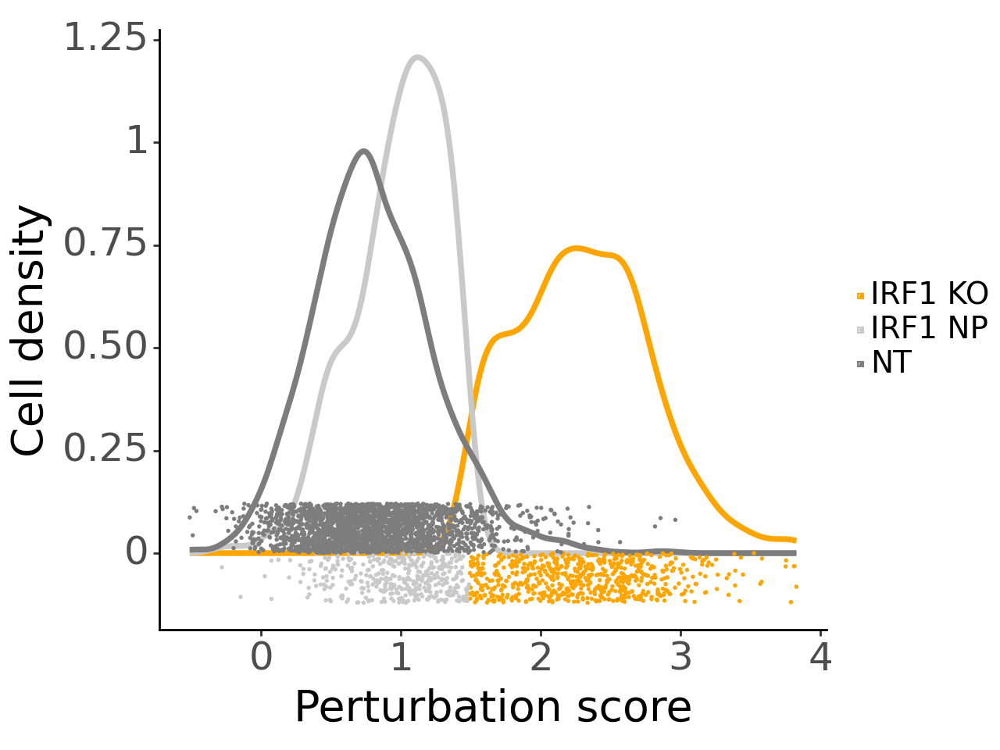

<Figure Size: (640 x 480)>

In [ ]:
pt.pl.ms.perturbscore(adata = mdata['rna'], labels='gene_target', target_gene='IRF1', color = 'orange')

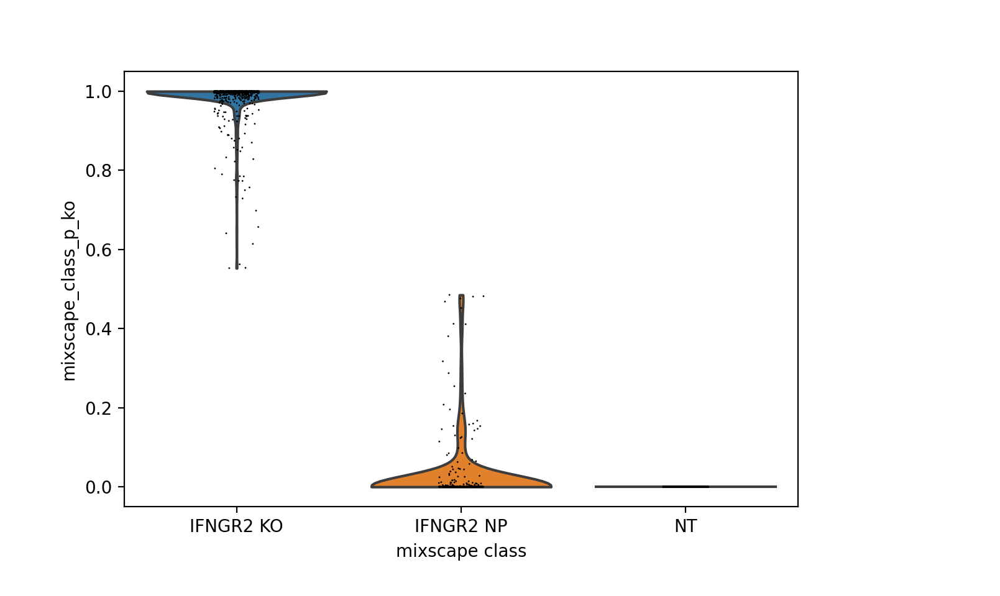

In [ ]:
pt.pl.ms.violin(adata = mdata['rna'], target_gene_idents=['NT', 'IFNGR2 NP', 'IFNGR2 KO'], groupby='mixscape_class')

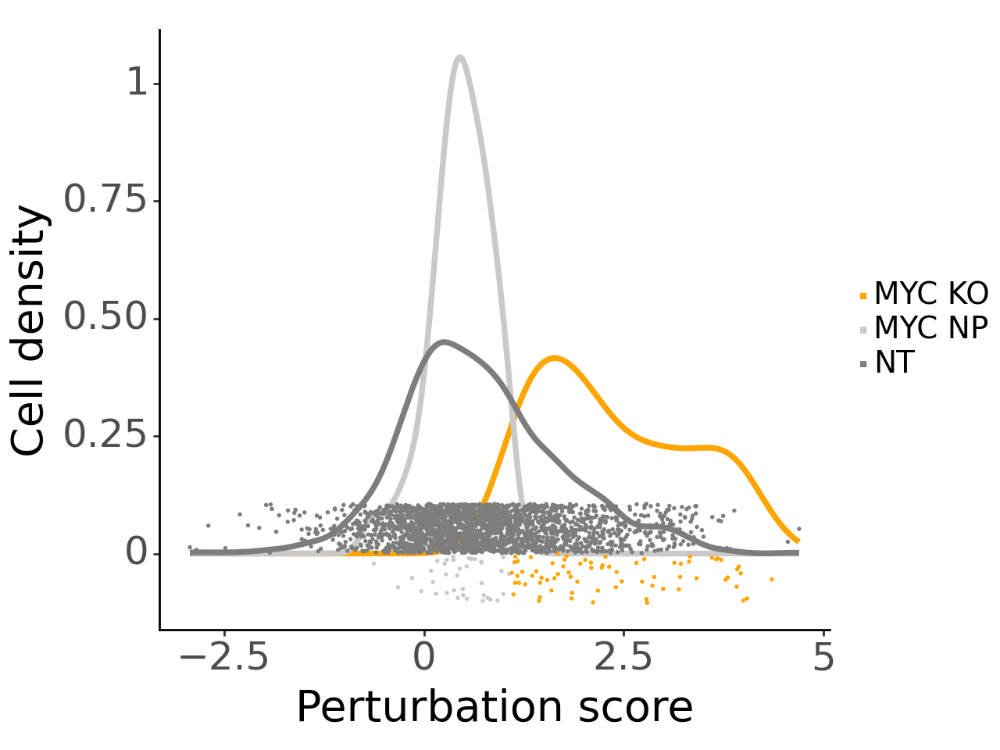

<Figure Size: (640 x 480)>

In [ ]:
pt.pl.ms.perturbscore(adata = mdata['rna'], labels='gene_target', target_gene='MYC', color = 'orange')

categories: IFNGR2 KO, IFNGR2 NP, NT
var_group_labels: NT


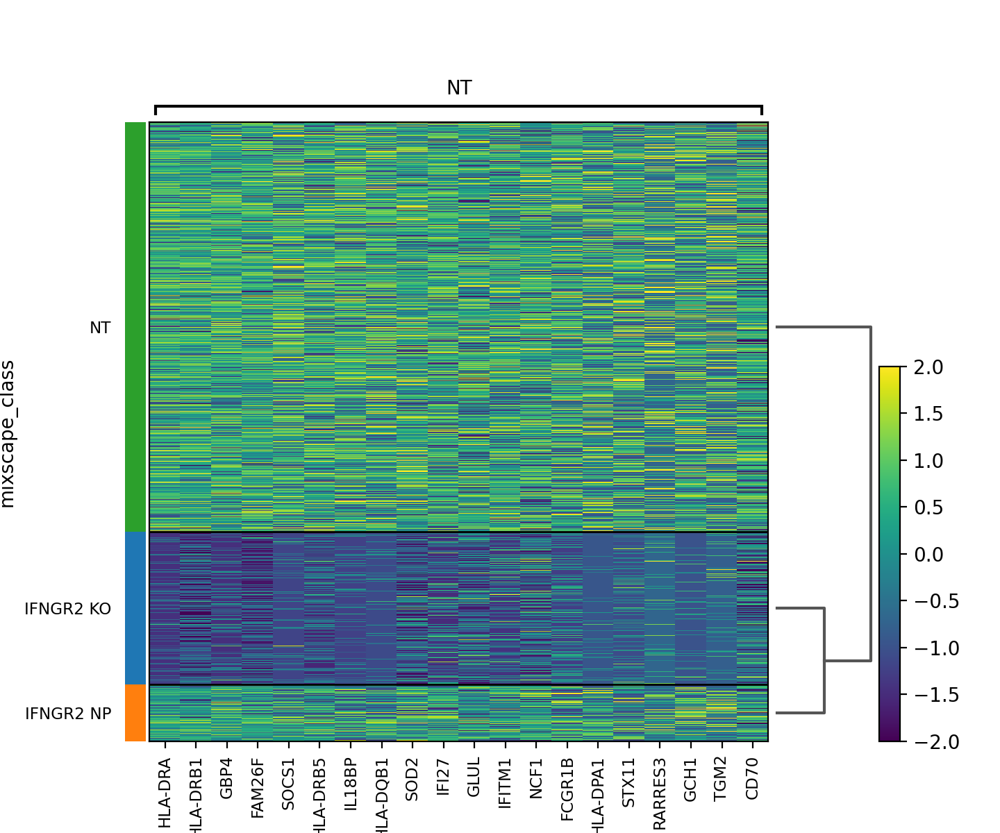

In [ ]:
pt.pl.ms.heatmap(adata = mdata['rna'], labels='gene_target', target_gene='IFNGR2', layer='X_pert', control='NT')

categories: IRF1 KO, IRF1 NP, NT
var_group_labels: NT


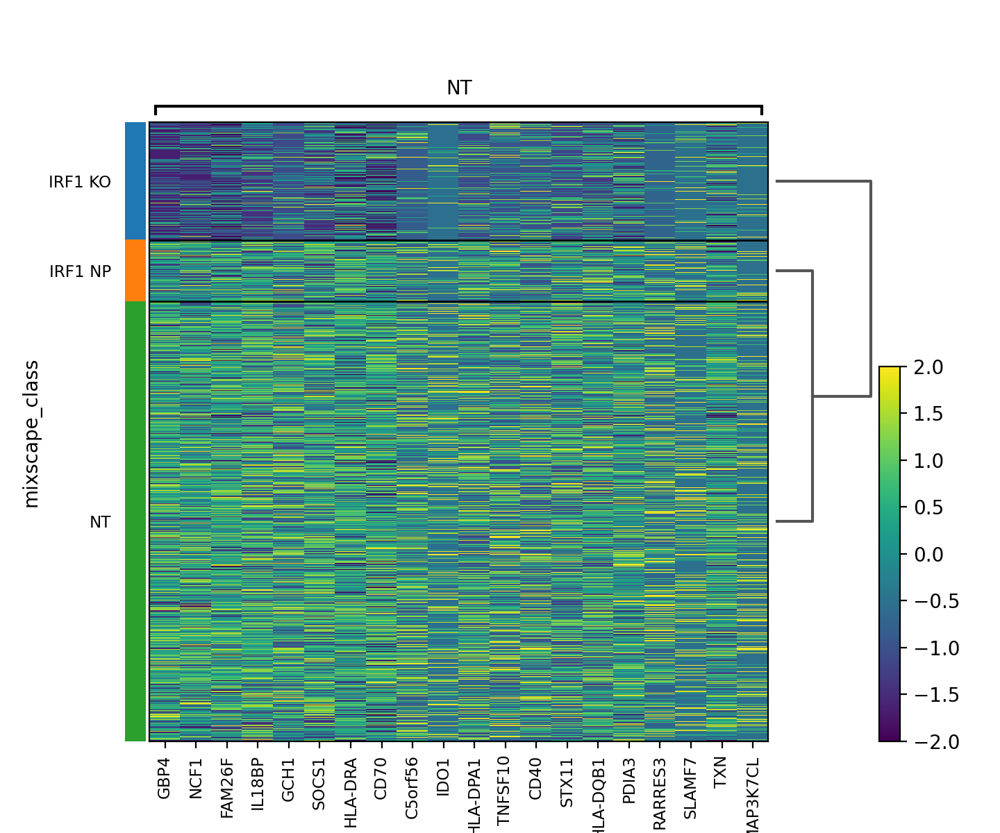

In [ ]:
pt.pl.ms.heatmap(adata = mdata['rna'], labels='gene_target', target_gene='IRF1', layer='X_pert', control='NT')

categories: MYC KO, MYC NP, NT
var_group_labels: NT


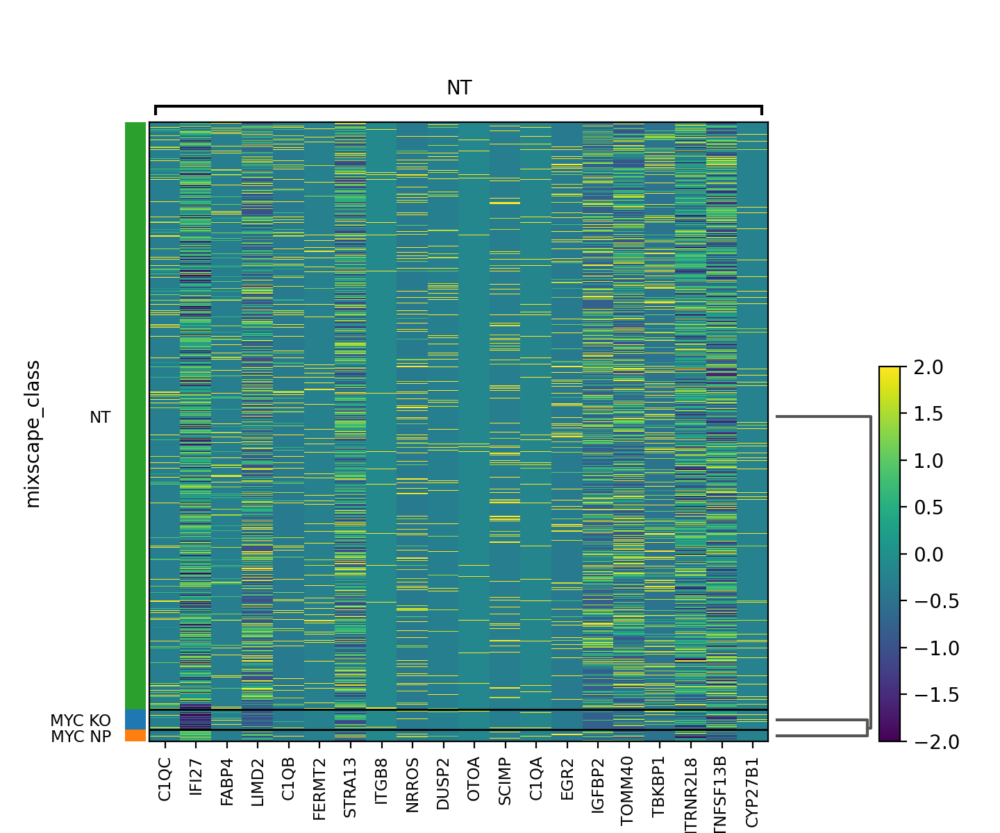

In [ ]:
pt.pl.ms.heatmap(adata = mdata['rna'], labels='gene_target', target_gene='MYC', layer='X_pert', control='NT')

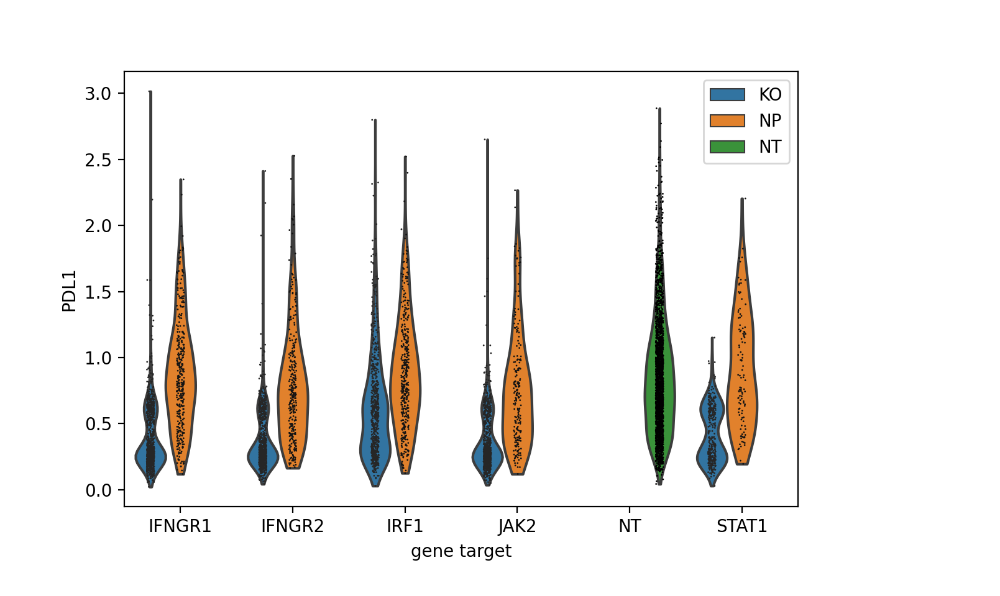

In [ ]:
mdata['adt'].obs['mixscape_class_global'] = mdata['rna'].obs['mixscape_class_global']
pt.pl.ms.violin(adata = mdata['adt'], target_gene_idents=["NT","JAK2","STAT1","IFNGR1","IFNGR2", "IRF1"], keys='PDL1', groupby='gene_target', hue='mixscape_class_global')

In [ ]:
mdata.var

,rna:name,adt:name,hto:name,gdo:name
index,,,,
AL627309.1,AL627309.1,NaN,NaN,NaN
AP006222.2,AP006222.2,NaN,NaN,NaN
RP4-669L17.10,RP4-669L17.10,NaN,NaN,NaN
RP11-206L10.3,RP11-206L10.3,NaN,NaN,NaN
RP11-206L10.2,RP11-206L10.2,NaN,NaN,NaN
...,...,...,...,...
UBE2L6g3,NaN,NaN,NaN,UBE2L6g3
UBE2L6g4,NaN,NaN,NaN,UBE2L6g4
NTg8,NaN,NaN,NaN,NTg8


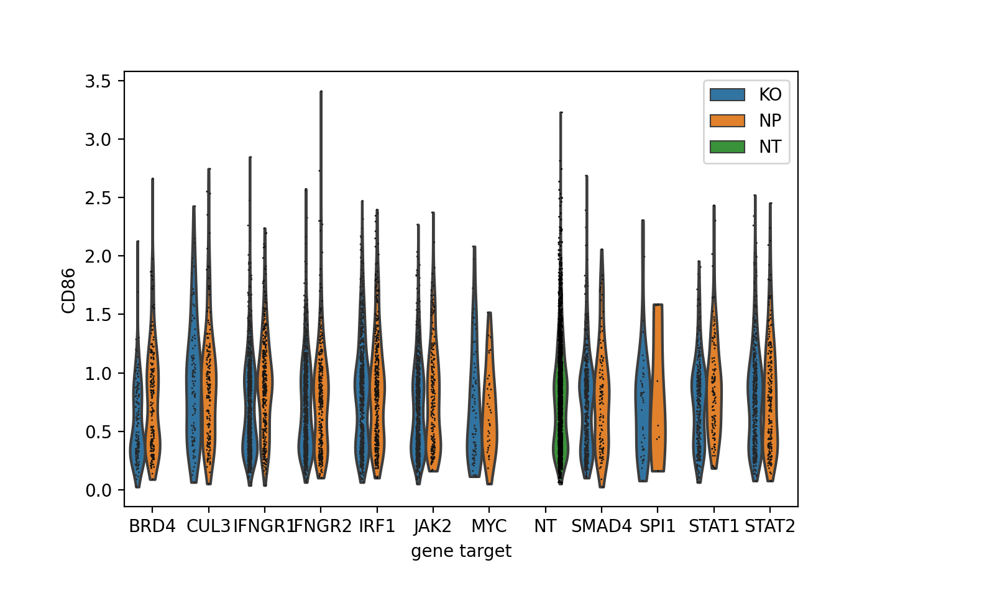

In [ ]:
mdata['adt'].obs['mixscape_class_global'] = mdata['rna'].obs['mixscape_class_global']
pt.pl.ms.violin(adata = mdata['adt'], target_gene_idents=["NT","JAK2","STAT1","IFNGR1","IFNGR2", "IRF1", "MYC", "SMAD4", "BRD4", "CUL3", "SPI1", "STAT2"], keys='CD86', groupby='gene_target', hue='mixscape_class_global')

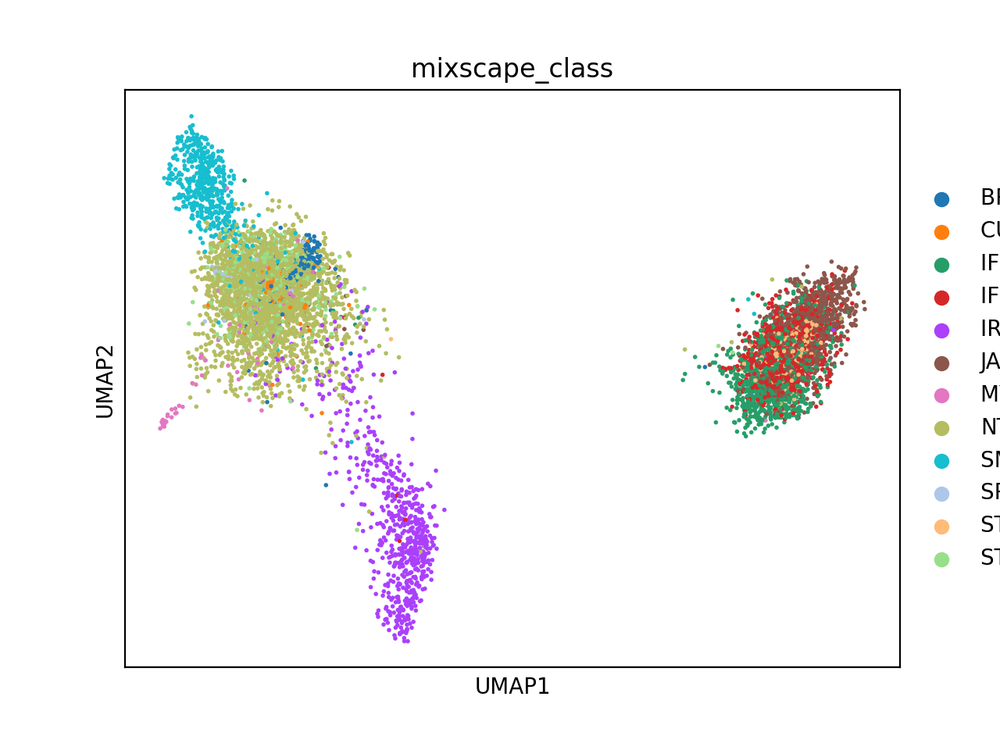

In [ ]:
mixscape_identifier = pt.tl.Mixscape()
mixscape_identifier.lda(adata=mdata['rna'], control='NT', labels='gene_target', layer='X_pert')

pt.pl.ms.lda(adata=mdata['rna'], control='NT')

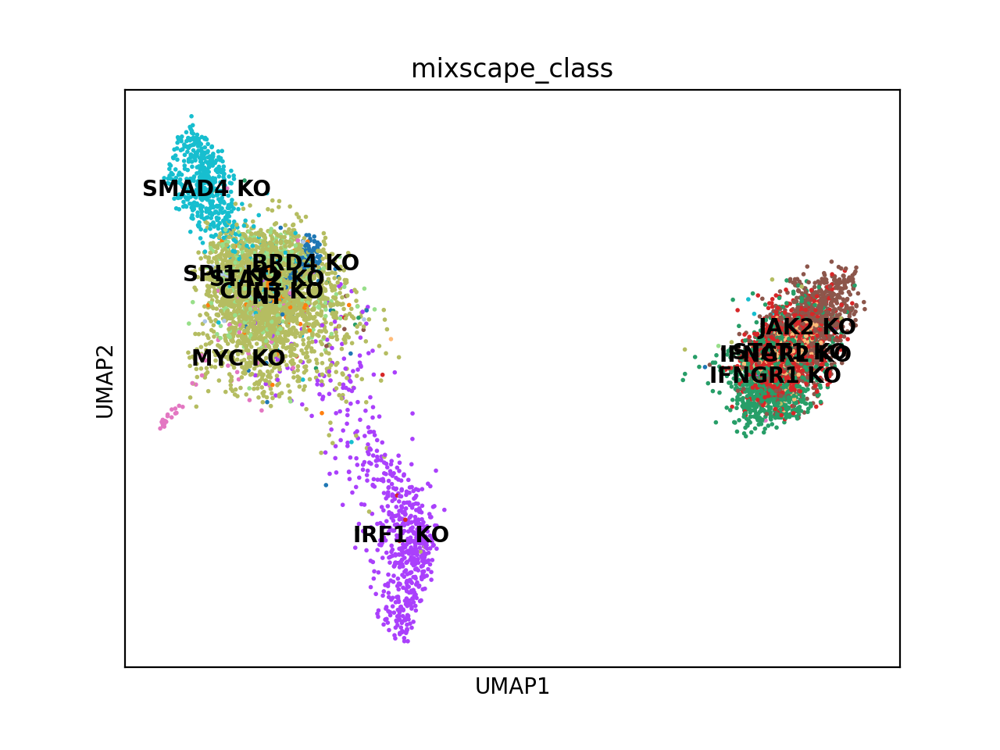

In [ ]:
pt.pl.ms.lda(adata=mdata['rna'], control='NT', legend_loc='on data')

# **5. Drug Repurposing based on ASGARD through L1000 LINCS project**

A Single- cell Guided Pipeline to Aid Repurposing of Drugs (ASGARD) (https://doi.org/10.1038/s41467-023-36637-3) that defines a drug score to recommend drugs by considering all cell clusters to address the intercellular heterogeneity within each patient.

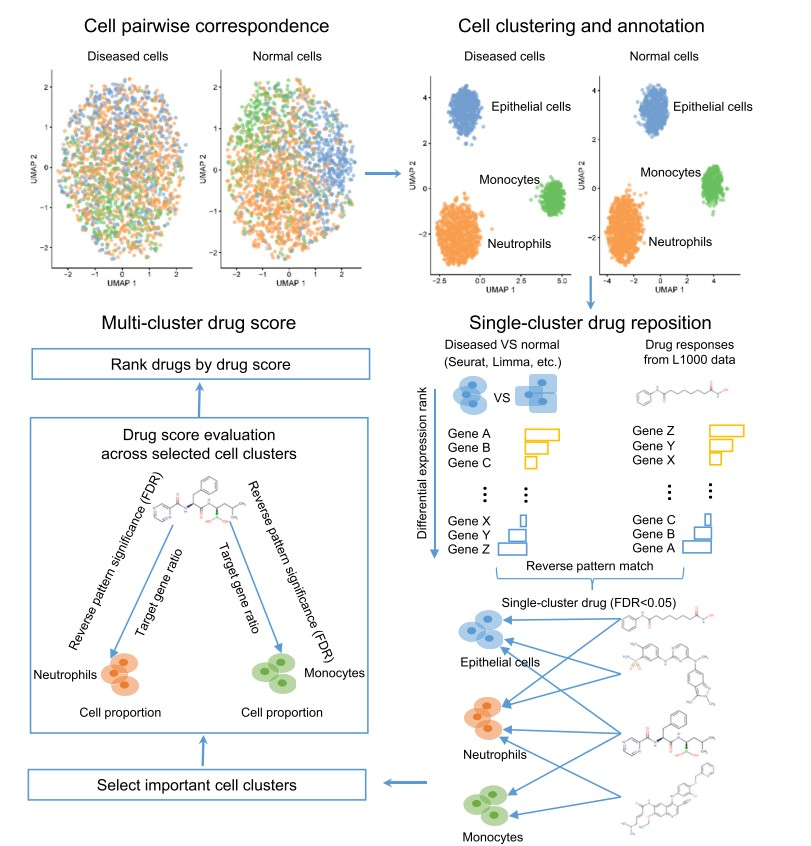

Installing dependencies for ASGARD on Colab

In [ ]:
%%R
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager")

BiocManager::install(c("SingleR","limma","celldex"))

install.packages('Seurat')

'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.rstudio.com


(as ‘lib’ is unspecified)







	‘/tmp/Rtmpz3IkyQ/downloaded_packages’



In [ ]:
%%R
if (!requireNamespace("BiocManager", quietly = TRUE))
    install.packages("BiocManager")
BiocManager::install('cmapR')

'help("repositories", package = "BiocManager")' for details.
Replacement repositories:
    CRAN: https://cran.rstudio.com




In [ ]:
%%R
library("cmapR")

In [ ]:
%%bash
# https://stackoverflow.com/questions/20923209/problems-installing-the-devtools-package
sudo apt-get install libcurl4-openssl-dev libssl-dev libfontconfig1-dev libxml2-dev libharfbuzz-dev libfribidi-dev libfreetype6-dev libpng-dev libtiff5-dev libjpeg-dev

Reading package lists...
Building dependency tree...
Reading state information...
libfontconfig1-dev is already the newest version (2.13.1-4.2ubuntu5).
libjpeg-dev is already the newest version (8c-2ubuntu10).
libpng-dev is already the newest version (1.6.37-3build5).
libcurl4-openssl-dev is already the newest version (7.81.0-1ubuntu1.13).
libfreetype6-dev is already the newest version (2.11.1+dfsg-1ubuntu0.2).
libfribidi-dev is already the newest version (1.0.8-2ubuntu3.1).
libharfbuzz-dev is already the newest version (2.7.4-1ubuntu3.1).
libssl-dev is already the newest version (3.0.2-0ubuntu1.10).
libtiff5-dev is already the newest version (4.3.0-6ubuntu0.5).
libxml2-dev is already the newest version (2.9.13+dfsg-1ubuntu0.3).
0 upgraded, 0 newly installed, 0 to remove and 16 not upgraded.


In [ ]:
%%R
library('devtools')

In [ ]:
%%R
devtools::install_version("crossmatch", version = "1.3.1", repos = "http://cran.us.r-project.org")


(as ‘lib’ is unspecified)



In [ ]:
%%R
devtools::install_version("multicross", version = "2.1.0", repos = "http://cran.us.r-project.org")



(as ‘lib’ is unspecified)



In [ ]:
%%R
devtools::install_github("lanagarmire/Asgard")

  Use `force = TRUE` to force installation



In [ ]:
%%R
library(Seurat)

which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)




    consider that it could be called from a Python process. This
    results in a quasi-obligatory segfault when rpy2 is evaluating
    R code using it. On the hand, rpy2 is accounting for the
    fact that it might already be running embedded in a Python
    process. This is why:
    - Python -> rpy2 -> R -> reticulate: crashes
    - R -> reticulate -> Python -> rpy2: works

    The issue with reticulate is tracked here:
    https://github.com/rstudio/reticulate/issues/208
    

In [ ]:
%%R
library(celldex)
library(tidyr)




Attaching package: ‘MatrixGenerics’



    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, rowMads, rowMaxs, rowMeans2, rowMedians, rowMins,
    rowOrderStats, rowProds, rowQuantiles, rowRanges, rowRanks,
    rowSdDiffs, rowSds, rowSums2, rowTabulates, rowVarDiffs, rowVars,
    rowWeightedMads, rowWeightedMeans, rowWeightedMedians,
    rowWeightedSds, rowWeightedVars





Attach

In [ ]:
%%R
library(limma)
library(cmapR)

Attaching package: ‘limma’



    plotMA




In [ ]:
%%R
library('Asgard')

In [ ]:
%%R
install.packages("tidyseurat")
library("tidyseurat")

In [ ]:
# Switching to R coding now
%%R
CLLSeurat <- readRDS("cll_integrated_annot.rds")

In [ ]:
%%R
# Focusing on drug repurposing to find drugs that mimic Ibrutinib response in 30 days
ASGARD_0_30 <- CLLSeurat %>% filter(days %in% c("d0", "d30"))
rm(CLLSeurat)

In [ ]:
%%R
gc()

            used   (Mb) gc trigger   (Mb)   max used   (Mb)
Ncells   7554766  403.5   15383457  821.6   14287233  763.1
Vcells 427002580 3257.8 1042564800 7954.2 1042564800 7954.2


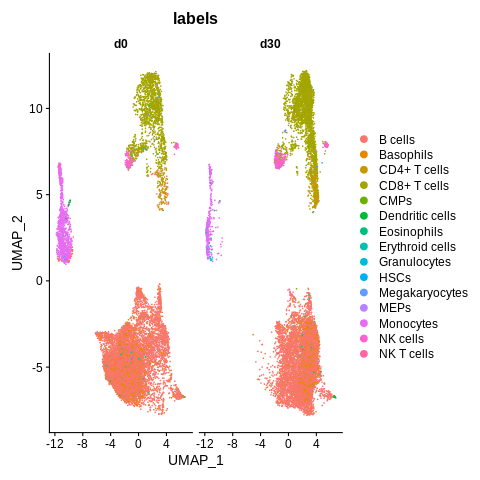

In [ ]:
%%R
#Sanity check
DimPlot(ASGARD_0_30, group.by="labels", split.by="days")

In [ ]:
%%R
ASGARD_0_30$sample <- paste(ASGARD_0_30$subject, ASGARD_0_30$days, sep = "_")

#Control sample names
Control=c("CLL6_d0", "CLL8_d0", "CLL1_d0", "CLL5_d0")

#Case sample names
Case=c("CLL6_d30", "CLL8_d30", "CLL5_d30")

ASGARD_0_30$sample <- ASGARD_0_30$Patient
ASGARD_0_30$celltype <- ASGARD_0_30$labels

In [ ]:
%%R
#Get differential genes from Seurat (Wilcoxon Rank Sum test)
# library('Seurat')
# DefaultAssay(complete) <- "RNA"
set.seed(123456)
Gene.list <- list()
C_names <- NULL
min.cells = 3

In [ ]:
%%R
for(i in unique(ASGARD_0_30@meta.data$labels)){
  Idents(ASGARD_0_30) <- "labels"
  c_cells <- subset(ASGARD_0_30, labels == i)
  print(i)
  if (sum(c_cells$days == "d30")>min.cells & sum(c_cells$days == "d0")>min.cells){
    Idents(c_cells) <- "days"
    C_data <- FindMarkers(c_cells, ident.1 = "d30", ident.2 = "d0")
    C_data_for_drug <- data.frame(row.names=row.names(C_data),score=C_data$avg_log2FC,adj.P.Val=C_data$p_val_adj,P.Value=C_data$p_val) ##for Seurat version > 4.0, please use avg_log2FC instead of avg_logFC
    Gene.list[[i]] <- C_data_for_drug
    C_names <- c(C_names,i)
  }
}
names(Gene.list) <- C_names

[1] "B cells"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=07m 27s
[1] "CD8+ T cells"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02m 00s
[1] "Monocytes"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=34s  
[1] "CD4+ T cells"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=12s  
[1] "NK cells"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=21s  
[1] "Basophils"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=52s  
[1] "Dendritic cells"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=03s  
[1] "Granulocytes"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=05s  
[1] "Eosinophils"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=03s  
[1] "MEPs"
[1] "Megakaryocytes"
[1] "HSCs"
[1] "NK T cells"
  |++++++++++++++++++++++++++++++++++++++++++++++++++| 100% elapsed=02s  
[1] "Erythroid cells"
[1] "CMPs"


In [ ]:
%%R
saveRDS(Gene.list, file="Gene.list_Wilcoxon_d0_d30_CLL_ASGARD_Colab.RData")
# readRDS("Gene.list_Wilcoxon_d0_d30_CLL_ASGARD_Colab.RData")

In [ ]:
%%R
gc()

            used   (Mb) gc trigger   (Mb)   max used   (Mb)
Ncells   3315370  177.1    5108038  272.8    5108038  272.8
Vcells 393953379 3005.7 1042564800 7954.2 1042564800 7954.2


In [ ]:
%%R
library("Asgard")

In [ ]:
%%R
#Load tissue specific drug reference produced by PrepareReference function as mentioned above. Please select proper tissue accroding to the disease.
my_gene_info<-read.table(file="haematopoietic-and-lymphoid-tissue_gene_info.txt",sep="\t",header = T,quote = "")
my_drug_info<-read.table(file="haematopoietic-and-lymphoid-tissue_drug_info.txt",sep="\t",header = T,quote = "")
drug.ref.profiles = GetDrugRef(drug.response.path = 'haematopoietic-and-lymphoid-tissue_rankMatrix.txt', #select a relevant tissue
                               probe.to.genes = my_gene_info,
                               drug.info = my_drug_info)

In [ ]:
%%R
#Repurpose mono-drugs for every cell type
Drug.ident.res = GetDrug(gene.data = Gene.list,
                         drug.ref.profiles = drug.ref.profiles,
                         repurposing.unit = "drug",
                         connectivity = "negative",
                         drug.type = "FDA")

In [ ]:
%%R
write.csv(Drug.ident.res, "Drug.ident.res_COLAB_CLL_D0_D30.csv") #these are various drugs that can mimic Ibrutinib activity for 30 days

In [ ]:
%%R
GSE92742.gctx.path="GSE92742_Broad_LINCS_Level5_COMPZ.MODZ_n473647x12328.gctx"
GSE70138.gctx.path="GSE70138_Broad_LINCS_Level5_COMPZ_n118050x12328_2017-03-06.gctx"

Drug.score<-DrugScore(SC.integrated=ASGARD_0_30,
                      Gene.data=Gene.list,
                      Cell.type= NULL,
                      Drug.data=Drug.ident.res,
                      FDA.drug.only=TRUE,
                      Case= Case,
                      Tissue="haematopoietic and lymphoid tissue",
                      GSE92742.gctx=GSE92742.gctx.path,
                      GSE70138.gctx=GSE70138.gctx.path)

In [ ]:
%%R
write.csv(Drug.score, "Drug.score_COLAB_CLL_D0_D30.csv")

***Several drugs that are under investigation in CLL have been retrieved  (check github for relevant publications)***

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('Drug.ident.res_COLAB_CLL_D0_D30.csv', usecols=['B.cells.Drug.name', 'B.cells.Drug.id', 'B.cells.P.value', 'Monocytes.Drug.name', 'Monocytes.Drug.name', 'Monocytes.P.value'])

In [ ]:
df

,B.cells.Drug.name,B.cells.Drug.id,B.cells.P.value,Monocytes.Drug.name,Monocytes.P.value
0,verapamil,BRD-A09533288,0.003522,parthenolide,0.004169
1,nicardipine,BRD-A26711594,0.004984,everolimus,0.006370
2,tamoxifen,BRD-K93754473,0.015525,losartan,0.014061
3,vandetanib,BRD-K77625799,0.024738,vandetanib,0.040748
4,lovastatin,BRD-K09416995,0.035848,rucaparib,0.049534
...,...,...,...,...,...
89,temozolomide,BRD-K32107296,0.980751,niclosamide,0.972916
90,tigecycline,BRD-A34462049,0.991474,sildenafil,0.978835
91,temsirolimus,BRD-A62025033,0.993377,thioridazine,0.990017
92,daunorubicin,BRD-K43389675,0.998351,sirolimus,0.996741


In [ ]:
pip install pandas matplotlib

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
df

,B.cells.Drug.name,B.cells.Drug.id,B.cells.P.value,Monocytes.Drug.name,Monocytes.P.value
0,verapamil,BRD-A09533288,0.003522,parthenolide,0.004169
1,nicardipine,BRD-A26711594,0.004984,everolimus,0.006370
2,tamoxifen,BRD-K93754473,0.015525,losartan,0.014061
3,vandetanib,BRD-K77625799,0.024738,vandetanib,0.040748
4,lovastatin,BRD-K09416995,0.035848,rucaparib,0.049534
...,...,...,...,...,...
89,temozolomide,BRD-K32107296,0.980751,niclosamide,0.972916
90,tigecycline,BRD-A34462049,0.991474,sildenafil,0.978835
91,temsirolimus,BRD-A62025033,0.993377,thioridazine,0.990017
92,daunorubicin,BRD-K43389675,0.998351,sirolimus,0.996741


In [ ]:
df['Minus_Log_PValue_B'] = -np.log10(df['B.cells.P.value'])

In [ ]:
df['Minus_Log_PValue_Mono'] = -np.log10(df['Monocytes.P.value'])

In [ ]:
df

,B.cells.Drug.name,B.cells.Drug.id,B.cells.P.value,Monocytes.Drug.name,Monocytes.P.value,Minus_Log_PValue_B,Minus_Log_PValue_Mono
0,verapamil,BRD-A09533288,0.003522,parthenolide,0.004169,2.453160,2.379936
1,nicardipine,BRD-A26711594,0.004984,everolimus,0.006370,2.302452,2.195842
2,tamoxifen,BRD-K93754473,0.015525,losartan,0.014061,1.808975,1.851982
3,vandetanib,BRD-K77625799,0.024738,vandetanib,0.040748,1.606643,1.389893
4,lovastatin,BRD-K09416995,0.035848,rucaparib,0.049534,1.445541,1.305093
...,...,...,...,...,...,...,...
89,temozolomide,BRD-K32107296,0.980751,niclosamide,0.972916,0.008441,0.011925
90,tigecycline,BRD-A34462049,0.991474,sildenafil,0.978835,0.003719,0.009290
91,temsirolimus,BRD-A62025033,0.993377,thioridazine,0.990017,0.002886,0.004357
92,daunorubicin,BRD-K43389675,0.998351,sirolimus,0.996741,0.000717,0.001418


In [ ]:
# libraries
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('Drug.ident.res_COLAB_CLL_D0_D30.csv')

In [ ]:
df

,Unnamed: 0,B.cells.Drug.name,B.cells.Drug.id,B.cells.P.value,B.cells.FDR,CD8..T.cells.Drug.name,CD8..T.cells.Drug.id,CD8..T.cells.P.value,CD8..T.cells.FDR,Monocytes.Drug.name,...,Granulocytes.P.value,Granulocytes.FDR,Eosinophils.Drug.name,Eosinophils.Drug.id,Eosinophils.P.value,Eosinophils.FDR,NK.T.cells.Drug.name,NK.T.cells.Drug.id,NK.T.cells.P.value,NK.T.cells.FDR
0,1,verapamil,BRD-A09533288,0.003522,0.234232,atorvastatin,BRD-U88459701,0.002886,0.247050,parthenolide,...,0.002138,0.200933,iloprost,BRD-K57391913,0.006526,0.403317,fostamatinib,BRD-K20285085,0.000652,0.053016
1,2,nicardipine,BRD-A26711594,0.004984,0.234232,menadione,BRD-K78126613,0.005843,0.247050,everolimus,...,0.012863,0.489289,itraconazole,BRD-A34817987,0.008581,0.403317,dacomitinib,BRD-K57169635,0.001128,0.053016
2,3,tamoxifen,BRD-K93754473,0.015525,0.486443,selumetinib,BRD-K57080016,0.008685,0.247050,losartan,...,0.020960,0.489289,sunitinib,BRD-K42828737,0.015414,0.422493,cabozantinib,BRD-K51544265,0.003476,0.108907
3,4,vandetanib,BRD-K77625799,0.024738,0.581333,sirolimus,BRD-A23770159,0.012203,0.247050,vandetanib,...,0.021778,0.489289,verapamil,BRD-A09533288,0.019491,0.422493,atorvastatin,BRD-U88459701,0.011705,0.275065
4,5,lovastatin,BRD-K09416995,0.035848,0.601477,curcumin,BRD-K74148702,0.013141,0.247050,rucaparib,...,0.029435,0.489289,thalidomide,BRD-A93255169,0.026883,0.422493,thioridazine,BRD-A84481105,0.020960,0.394056
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,90,temozolomide,BRD-K32107296,0.980751,1.000000,iloprost,BRD-A45664787,0.973923,0.993204,niclosamide,...,0.977346,0.998383,nimodipine,BRD-A58048407,0.953533,0.981148,carbamazepine,BRD-K71799949,0.955811,0.998292
90,91,tigecycline,BRD-A34462049,0.991474,1.000000,calcitriol,BRD-K27316855,0.977522,0.993204,sildenafil,...,0.980464,0.998383,sonidegib,BRD-K19796430,0.958057,0.981148,rucaparib,BRD-K88560311,0.995072,1.000000
91,92,temsirolimus,BRD-A62025033,0.993377,1.000000,quinine,BRD-U94846492,0.977575,0.993204,thioridazine,...,0.991655,0.998383,rosiglitazone,BRD-A97437073,0.960272,0.981148,idelalisib,BRD-K60866521,0.996741,1.000000
92,93,daunorubicin,BRD-K43389675,0.998351,1.000000,pazopanib,BRD-K74514084,0.982638,0.993204,sirolimus,...,0.996643,0.998383,carbamazepine,BRD-K71799949,0.982638,0.987180,itraconazole,BRD-A34817987,0.998383,1.000000


In [ ]:
# Get a list of all columns containing ".P.value"
p_value_columns = [col for col in df.columns if '.P.value' in col]

# Calculate the minus log p-value for each of these columns in a loop
for col_name in p_value_columns:
    minus_log_col_name = col_name.replace('.P.value', '.Minus_Log_PValue')
    df[minus_log_col_name] = -np.log10(df[col_name])

# Display the DataFrame with the added minus log p-value columns
print(df)

    Unnamed: 0 B.cells.Drug.name B.cells.Drug.id  B.cells.P.value  \
0            1         verapamil   BRD-A09533288         0.003522   
1            2       nicardipine   BRD-A26711594         0.004984   
2            3         tamoxifen   BRD-K93754473         0.015525   
3            4        vandetanib   BRD-K77625799         0.024738   
4            5        lovastatin   BRD-K09416995         0.035848   
..         ...               ...             ...              ...   
89          90      temozolomide   BRD-K32107296         0.980751   
90          91       tigecycline   BRD-A34462049         0.991474   
91          92      temsirolimus   BRD-A62025033         0.993377   
92          93      daunorubicin   BRD-K43389675         0.998351   
93          94          ixazomib   BRD-K78659596         1.000000   

    B.cells.FDR CD8..T.cells.Drug.name CD8..T.cells.Drug.id  \
0      0.234232           atorvastatin        BRD-U88459701   
1      0.234232              menadione       

In [ ]:
df

,Unnamed: 0,B.cells.Drug.name,B.cells.Drug.id,B.cells.P.value,B.cells.FDR,CD8..T.cells.Drug.name,CD8..T.cells.Drug.id,CD8..T.cells.P.value,CD8..T.cells.FDR,Monocytes.Drug.name,...,B.cells.Minus_Log_PValue,CD8..T.cells.Minus_Log_PValue,Monocytes.Minus_Log_PValue,CD4..T.cells.Minus_Log_PValue,NK.cells.Minus_Log_PValue,Basophils.Minus_Log_PValue,Dendritic.cells.Minus_Log_PValue,Granulocytes.Minus_Log_PValue,Eosinophils.Minus_Log_PValue,NK.T.cells.Minus_Log_PValue
0,1,verapamil,BRD-A09533288,0.003522,0.234232,atorvastatin,BRD-U88459701,0.002886,0.247050,parthenolide,...,2.453160,2.539701,2.379936,3.343867,2.745493,2.195842,3.518069,2.670077,2.185338,3.185672
1,2,nicardipine,BRD-A26711594,0.004984,0.234232,menadione,BRD-K78126613,0.005843,0.247050,everolimus,...,2.302452,2.233399,2.195842,1.436002,2.191546,1.867972,2.146319,1.890652,2.066452,2.947693
2,3,tamoxifen,BRD-K93754473,0.015525,0.486443,selumetinib,BRD-K57080016,0.008685,0.247050,losartan,...,1.808975,2.061207,1.851982,1.402999,2.074912,1.796345,1.949372,1.678600,1.812086,2.458953
3,4,vandetanib,BRD-K77625799,0.024738,0.581333,sirolimus,BRD-A23770159,0.012203,0.247050,vandetanib,...,1.606643,1.913517,1.389893,1.395500,1.752152,1.537072,1.626958,1.661973,1.710169,1.931632
4,5,lovastatin,BRD-K09416995,0.035848,0.601477,curcumin,BRD-K74148702,0.013141,0.247050,rucaparib,...,1.445541,1.881373,1.305093,1.373576,1.368110,1.507982,1.362576,1.531135,1.570515,1.678600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
89,90,temozolomide,BRD-K32107296,0.980751,1.000000,iloprost,BRD-A45664787,0.973923,0.993204,niclosamide,...,0.008441,0.011475,0.011925,0.022788,0.013395,0.017606,0.010795,0.009951,0.020664,0.019628
90,91,tigecycline,BRD-A34462049,0.991474,1.000000,calcitriol,BRD-K27316855,0.977522,0.993204,sildenafil,...,0.003719,0.009873,0.009290,0.010913,0.013040,0.016619,0.009190,0.008568,0.018608,0.002146
91,92,temsirolimus,BRD-A62025033,0.993377,1.000000,quinine,BRD-U94846492,0.977575,0.993204,thioridazine,...,0.002886,0.009850,0.004357,0.005186,0.010154,0.009709,0.002146,0.003639,0.017606,0.001418
92,93,daunorubicin,BRD-K43389675,0.998351,1.000000,pazopanib,BRD-K74514084,0.982638,0.993204,sirolimus,...,0.000717,0.007607,0.001418,0.002802,0.005979,0.005979,0.001418,0.001460,0.007607,0.000703


<ipython-input-69-2c535737068d>:30: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=filtered_df, x=column, y=drug_name_column, ax=ax,
<ipython-input-69-2c535737068d>:30: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=filtered_df, x=column, y=drug_name_column, ax=ax,
<ipython-input-69-2c535737068d>:30: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=filtered_df, x=column, y=drug_name_column, ax=ax,
<ipython-input-69-2c535737068d>:30: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=filtered_df, x=column, y=drug_name_column, ax=ax,
<ipython-input-69-2c535737068d>:30: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=filtered_df, x=column, y=drug_name_column, ax=ax,
<ipython-input-69-2c535737068d>:30: UserWarning: Ignoring `palette` be

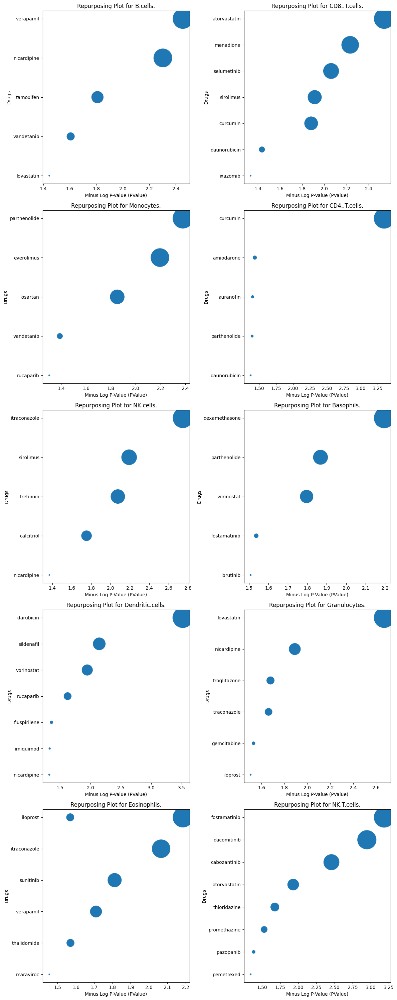

In [ ]:
# Get a list of all columns containing ".Minus_Log_PValue"
minus_log_columns = [col for col in df.columns if '.Minus_Log_PValue' in col]

# Create a color palette for distinct cell types
color_palette = sns.color_palette("Set1", len(minus_log_columns))

# Create a figure with subplots arranged side by side
num_plots = len(minus_log_columns)
cols = 2  # Number of columns for subplots
rows = (num_plots + 1) // cols  # Calculate the number of rows needed

# Set the figure size based on the number of subplots
fig, axes = plt.subplots(rows, cols, figsize=(12, 6 * rows))

# Iterate through Minus_Log_PValue columns and create plots
for i, column in enumerate(minus_log_columns):
    # Extract the corresponding drug name column based on cell type
    drug_name_column = column.replace('.Minus_Log_PValue', '.Drug.name')

    # Filter the DataFrame to include only drugs with log p-values above 1.3
    filtered_df = df[df[column] > 1.3]

    # Determine the subplot axes based on the row and column
    if rows > 1:
        ax = axes[i // cols, i % cols]
    else:
        ax = axes[i % cols]

    # Create the bubble plot for the current cell type with different colors
    sns.scatterplot(data=filtered_df, x=column, y=drug_name_column, ax=ax,
                    palette=color_palette[i:i + 1], size=column, sizes=(20, 2000), legend=False)

    ax.set_xlabel(f'Minus Log P-Value ({column.split("_")[-1]})')
    ax.set_ylabel('Drugs')

    # Modify the title to remove both "Minus" and ".Minus Cells"
    cell_type = column.split("_")[0].replace("Minus", "")
    ax.set_title(f'Repurposing Plot for {cell_type}')

# Remove any empty subplots if the number of plots is not a multiple of cols
for i in range(num_plots, rows * cols):
    fig.delaxes(axes.flatten()[i])

# Adjust layout
plt.tight_layout()

# Show the graph
plt.show()